In [22]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import pandas as pd
import numpy as np
#import pandas_datareader as pdr
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

from technicalindicators import TechnicalIndicators
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM, GRU
import keras
from numpy import concatenate

from pickle import load, dump

%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 20,10



In [4]:
def get_modelling_data(dataset_, lag_ = 60, forward_days_ = 5,returns_ = True):
    
    dataset_ = dataset_.sort_index(ascending=True).copy()
    close_data_ = dataset_[['close']].copy()
    
    X_ = dataset_.drop(dataset_.index[(dataset_.shape[0]-forward_days_):]).copy()
    
    if returns_:
        y_ = close_data_[['close']].pct_change(forward_days_).drop(close_data_.index[0:forward_days_])
    else:    
        y_ = close_data_.drop(close_data_.index[0:forward_days_])
            
    return X_, y_
    

def create_test_and_train_sets(X, y, train_ratio=0.8, lag = 60):
    values_x=X.values
    values_y=y.values
    
    
    X_train = values_x[:int(X.shape[0]*train_ratio)]
    X_test = values_x[int(y.shape[0]*train_ratio):]
    y_train = values_y[:int(X.shape[0]*train_ratio)]
    y_test = values_y[int(y.shape[0]*train_ratio):]
    
    scaler_x = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    X_train = scaler_x.fit_transform(X_train)
    y_train = scaler_y.fit_transform(y_train)
    X_test = scaler_x.transform(X_test)
    y_test = scaler_y.transform(y_test)
    

    X_train=np.array(X_train)
    X_test=np.array(X_test)
    y_train=np.array(y_train)
    y_test=np.array(y_test)
    X_train=X_train.reshape(X_train.shape[0],1,X_train.shape[1])
    X_test=X_test.reshape(X_test.shape[0],1,X_test.shape[1])
    y_train=y_train.reshape(y_train.shape[0],1,1)
    y_test=y_test.reshape(y_test.shape[0],1,1)

      
    x_train_lag,y_train_lag,x_test_lag,y_test_lag =[],[],[],[]
    for i in range(lag,y_train.shape[0]):
        x_train_lag.append(X_train[i-lag:i,0])
        y_train_lag.append(y_train[i,0])
    
    #predicting, using past lag days from the train data
    #inputs_x = scaled_data_X[(scaled_data_y.shape[0] - y_test.shape[0] - lag):]
    #inputs_y = scaled_data_y[(scaled_data_y.shape[0] - y_test.shape[0] - lag):]
    inputs_x = values_x[(values_y.shape[0] - y_test.shape[0] - lag):]
    inputs_y = values_y[(values_y.shape[0] - y_test.shape[0] - lag):]
    inputs_x = scaler_x.transform(inputs_x)
    inputs_y = scaler_y.transform(inputs_y)
    
    inputs_x = inputs_x.reshape(inputs_x.shape[0],1,inputs_x.shape[1])
    inputs_y = inputs_y.reshape(inputs_y.shape[0],1,1)

    
    for x in range(lag,inputs_y.shape[0]):
        x_test_lag.append(inputs_x[(x-lag):x,0])
        y_test_lag.append(inputs_y[x,0])
    
    x_train_lag, y_train_lag,x_test_lag,y_test_lag = np.array(x_train_lag), np.array(y_train_lag), np.array(x_test_lag), np.array(y_test_lag)

    x_train_lag = np.reshape(x_train_lag, (x_train_lag.shape[0],x_train_lag.shape[1], X.shape[1]))
    y_train_lag=np.reshape(y_train_lag,(y_train_lag.shape[0],y_train_lag.shape[1]))
    x_test_lag=np.reshape(x_test_lag,(x_test_lag.shape[0],x_test_lag.shape[1],X.shape[1]))
    y_test_lag=np.reshape(y_test_lag,(y_test_lag.shape[0],y_test_lag.shape[1]))
    
    return x_train_lag, y_train_lag, x_test_lag, y_test_lag, X_train, y_train, X_test, y_test,scaler_x,scaler_y

def scheduler(epoch, lr):
    if epoch < 20:
        return lr
    elif epoch < 100:
        return lr * 0.1
    elif epoch < 150:
        return lr * 0.01
    elif epoch < 175:
        return lr * 0.001
    else:
        return lr * 0.0001
    
def train_models(a_train, b_train, c_test, d_test):
    
    model = Sequential()
    model.add(LSTM(units=100, return_sequences=True, input_shape=(a_train.shape[1],a_train.shape[2])))
    model.add(LSTM(units=100))
    #model.add(Dropout(0.2))
    model.add(Dense(1))

    ADAM=keras.optimizers.Adam(0.0005, beta_1=0.9, beta_2=0.999, amsgrad=False)
    SGD = keras.optimizers.SGD(learning_rate=0.01,momentum=0.9)
    #callback = keras.callbacks.LearningRateScheduler(scheduler)

    model.compile(loss='mean_squared_error', optimizer=SGD)
    history = model.fit(a_train,b_train,
                        epochs=50,
                        batch_size=32,
                        validation_data=(c_test,d_test),
                        verbose=1,
                        #callbacks=[callback],
                        shuffle=False)
    return model, history

def train_gru_model(a_train, b_train, c_test, d_test):
    regressorGRU = Sequential()
    # First GRU layer with Dropout regularisation
    regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(a_train.shape[1],a_train.shape[2]), activation='tanh'))
    regressorGRU.add(Dropout(0.2))
    # Second GRU layer
    regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(a_train.shape[1],a_train.shape[2]), activation='tanh'))
    regressorGRU.add(Dropout(0.2))
    # Third GRU layer
    regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(a_train.shape[1],a_train.shape[2]), activation='tanh'))
    regressorGRU.add(Dropout(0.2))
    # Fourth GRU layer
    regressorGRU.add(GRU(units=50, activation='tanh'))
    regressorGRU.add(Dropout(0.2))
    # The output layer
    regressorGRU.add(Dense(units=1))
    # Compiling the RNN
    regressorGRU.compile(optimizer=keras.optimizers.SGD(lr=0.01, decay=1e-7, momentum=0.9, nesterov=False),loss='mean_squared_error')
    # Fitting to the training set
    history = regressorGRU.fit(a_train,b_train,
                    epochs=50,
                    batch_size=32,
                    validation_data=(c_test,d_test),
                    verbose=1,
                    #callbacks=[callback],
                    shuffle=False)
    return regressorGRU, history

def train_combo_model(a_train, b_train, c_test, d_test,epochs = 100, verbose = 0,d=0.0):
    # The LSTM architecture
    regressorLG = Sequential()
    # First LSTM layer with Dropout regularisation
    regressorLG.add(LSTM(units=100, return_sequences=True, input_shape=(a_train.shape[1],a_train.shape[2])))
    regressorLG.add(Dropout(d))
    regressorLG.add(GRU(units=100, activation='tanh'))
    regressorLG.add(Dropout(d))
    # The output layer
    regressorLG.add(Dense(units=1))
    # Compiling the RNN
    regressorLG.compile(optimizer=keras.optimizers.SGD(lr=0.01, decay=1e-7, momentum=0.9, nesterov=False),loss='mean_squared_error')
    # Fitting to the training set
    history = regressorLG.fit(a_train,b_train,
                                epochs=epochs,
                                batch_size=150,
                                validation_data=(c_test,d_test),
                                verbose = verbose)
    return regressorLG, history


def create_training_plots(model,history, c_test, X_test, y_test, scaler,title='AAPL plots'):
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title(title)
    plt.legend()
    plt.show()
    
    
    yhat = model.predict(c_test)
    #X_test_new = X_test.reshape((X_test.shape[0], X_test.shape[2]))
    #inv_yhat = concatenate((yhat,X_test_new), axis=1)
    #inv_yhat = scaler.inverse_transform(inv_yhat)
    #inv_yhat = inv_yhat[:,0]
    inv_yhat = scaler.inverse_transform(yhat)
    
    mean_squared_error = keras.losses.MeanSquaredError()
    y_test_new = y_test.reshape((y_test.shape[0], 1))
    #inv_y = concatenate((y_test_new,X_test_new), axis=1)
    #inv_y = scaler.inverse_transform(inv_y)
    inv_y = scaler.inverse_transform(y_test_new)
    #inv_y = inv_y[:,0]

    rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)

    #plt.plot(dataset.index[:len(inv_yhat)].values,inv_yhat,label="Prediction")
    #plt.plot(dataset.index[:len(inv_yhat)].values,y[len(y_train)+60:].values,label="Actual")
    plt.plot(inv_yhat,label="Prediction")
    plt.plot(inv_y,label="Actual")
    plt.legend()
    plt.title(title)
    plt.show()




In [397]:
#['AAPL', 'AMZN', 'MSFT', 'GOOGL', 'FB', 'BRK.A', 'V', 'WMT',
#                   'JNJ', 'TSLA', 'PG', 'MA', 'JPM', 'NVDA', 'UNH', 'HD', 'VZ', 'DIS',
#                   'ADBE', 'CRM']
for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data

    dataset = pd.concat([macd_data.copy(), rsi_data.copy(), bbands_data.copy(), sma_data.copy(), vix_data.copy(),close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = 42, forward_days = 21,returns = True)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = 60)
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

Starting process for: AAPL
Epoch 1/50
154/154 [==============================] - 22s 141ms/step - loss: 0.0224 - val_loss: 0.0105
Epoch 2/50
154/154 [==============================] - 17s 112ms/step - loss: 0.0149 - val_loss: 0.0139
Epoch 3/50
154/154 [==============================] - 17s 111ms/step - loss: 0.0135 - val_loss: 0.0148
Epoch 4/50
154/154 [==============================] - 16s 105ms/step - loss: 0.0126 - val_loss: 0.0143
Epoch 5/50
154/154 [==============================] - 17s 110ms/step - loss: 0.0124 - val_loss: 0.0151
Epoch 6/50
154/154 [==============================] - 16s 105ms/step - loss: 0.0118 - val_loss: 0.0149
Epoch 7/50
154/154 [==============================] - 16s 105ms/step - loss: 0.0117 - val_loss: 0.0149
Epoch 8/50
154/154 [==============================] - 16s 103ms/step - loss: 0.0116 - val_loss: 0.0143
Epoch 9/50
154/154 [==============================] - 16s 106ms/step - loss: 0.0115 - val_loss: 0.0145
Epoch 10/50
 86/154 [===============>.........

KeyboardInterrupt: 

Starting process for: AAPL
Epoch 1/50
154/154 [==============================] - 18s 114ms/step - loss: 0.0027 - val_loss: 0.0967
Epoch 2/50
154/154 [==============================] - 16s 102ms/step - loss: 0.0068 - val_loss: 0.0926
Epoch 3/50
154/154 [==============================] - 16s 104ms/step - loss: 0.0046 - val_loss: 0.0934
Epoch 4/50
154/154 [==============================] - 15s 99ms/step - loss: 0.0041 - val_loss: 0.0863
Epoch 5/50
154/154 [==============================] - 16s 101ms/step - loss: 0.0045 - val_loss: 0.0785
Epoch 6/50
154/154 [==============================] - 15s 96ms/step - loss: 0.0049 - val_loss: 0.0671
Epoch 7/50
154/154 [==============================] - 15s 99ms/step - loss: 0.0056 - val_loss: 0.0643
Epoch 8/50
154/154 [==============================] - 14s 94ms/step - loss: 0.0059 - val_loss: 0.0647
Epoch 9/50
154/154 [==============================] - 15s 98ms/step - loss: 0.0060 - val_loss: 0.0650
Epoch 10/50
154/154 [==============================

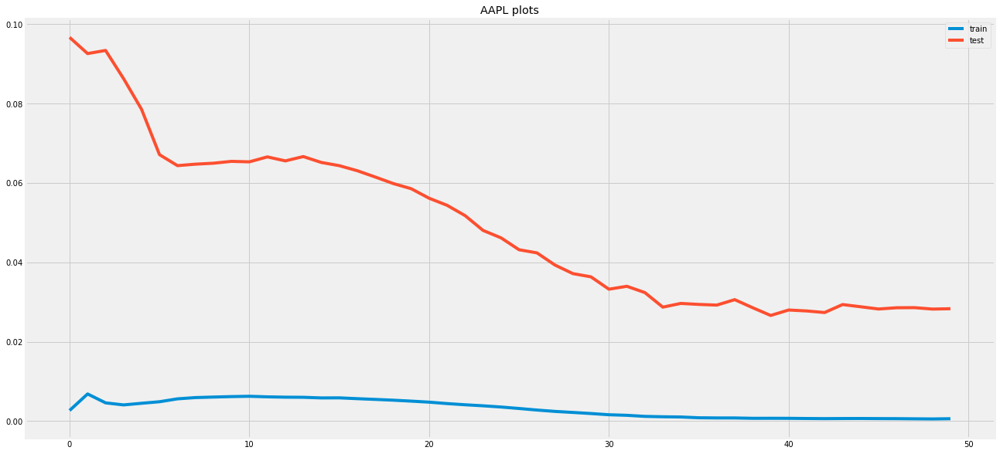

Test RMSE: 28.334


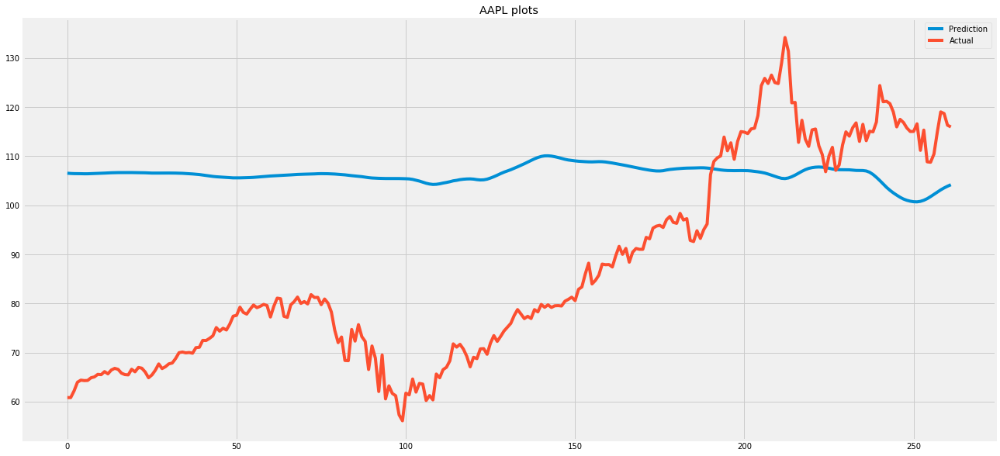

Epoch 1/50
154/154 [==============================] - 12s 78ms/step - loss: 8.3473e-04 - val_loss: 0.1062
Epoch 2/50
154/154 [==============================] - 12s 80ms/step - loss: 0.0057 - val_loss: 0.0942
Epoch 3/50
154/154 [==============================] - 11s 72ms/step - loss: 0.0038 - val_loss: 0.0685
Epoch 4/50
154/154 [==============================] - 12s 77ms/step - loss: 0.0039 - val_loss: 0.0562
Epoch 5/50
154/154 [==============================] - 14s 91ms/step - loss: 0.0042 - val_loss: 0.0504
Epoch 6/50
154/154 [==============================] - 12s 76ms/step - loss: 0.0041 - val_loss: 0.0464
Epoch 7/50
154/154 [==============================] - 12s 78ms/step - loss: 0.0037 - val_loss: 0.0432
Epoch 8/50
154/154 [==============================] - 12s 78ms/step - loss: 0.0034 - val_loss: 0.0401
Epoch 9/50
154/154 [==============================] - 11s 72ms/step - loss: 0.0030 - val_loss: 0.0372
Epoch 10/50
154/154 [==============================] - 11s 75ms/step - loss: 0

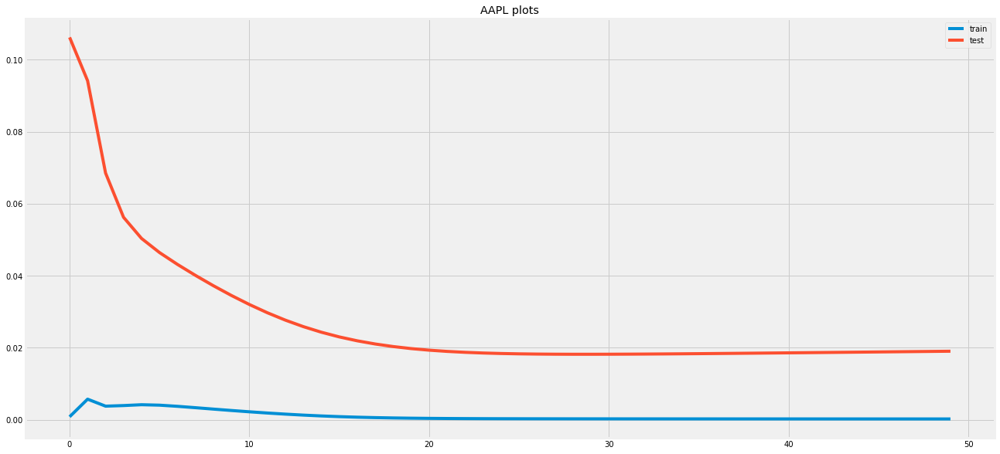

Test RMSE: 18.484


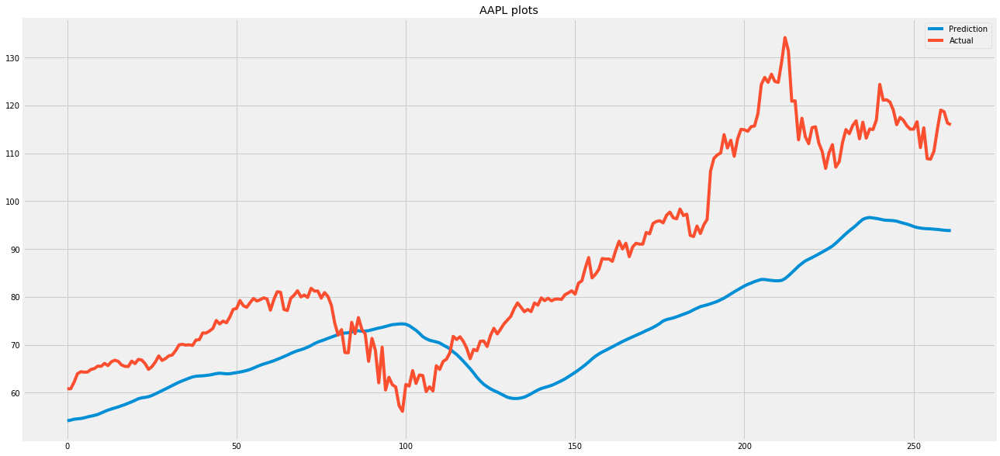

Finished process for: AAPL


In [356]:
for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data

    dataset = pd.concat([macd_data.copy(), rsi_data.copy(), bbands_data.copy(), sma_data.copy(), vix_data.copy(),close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = 42, forward_days = 1,returns = False)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = 60)
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

Starting process for: AAPL
Epoch 1/50
156/156 [==============================] - 5s 33ms/step - loss: 0.0213 - val_loss: 0.0020
Epoch 2/50
156/156 [==============================] - 4s 25ms/step - loss: 0.0030 - val_loss: 0.0019
Epoch 3/50
156/156 [==============================] - 4s 24ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 4/50
156/156 [==============================] - 4s 23ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 5/50
156/156 [==============================] - 3s 22ms/step - loss: 0.0021 - val_loss: 0.0020
Epoch 6/50
156/156 [==============================] - 4s 23ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 7/50
156/156 [==============================] - 4s 23ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 8/50
156/156 [==============================] - 4s 23ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 9/50
156/156 [==============================] - 4s 23ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 10/50
156/156 [==============================] - 4s 23ms/s

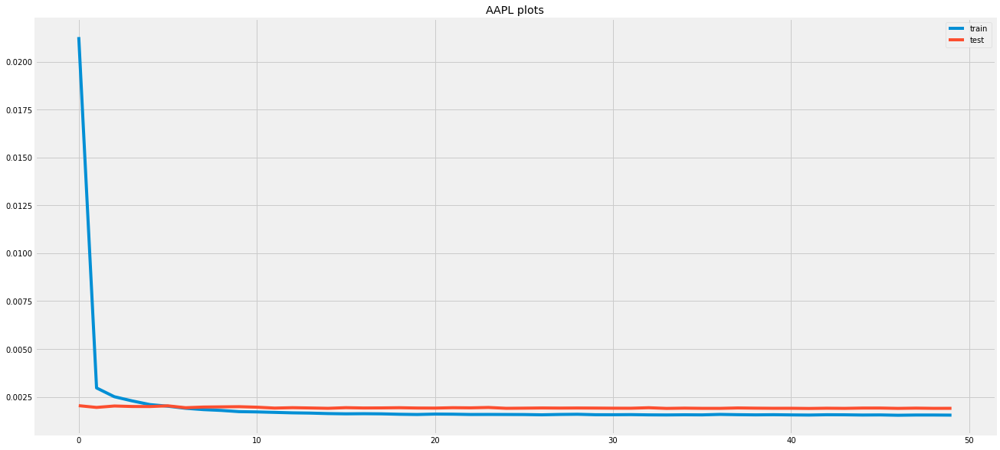

Test RMSE: 0.037


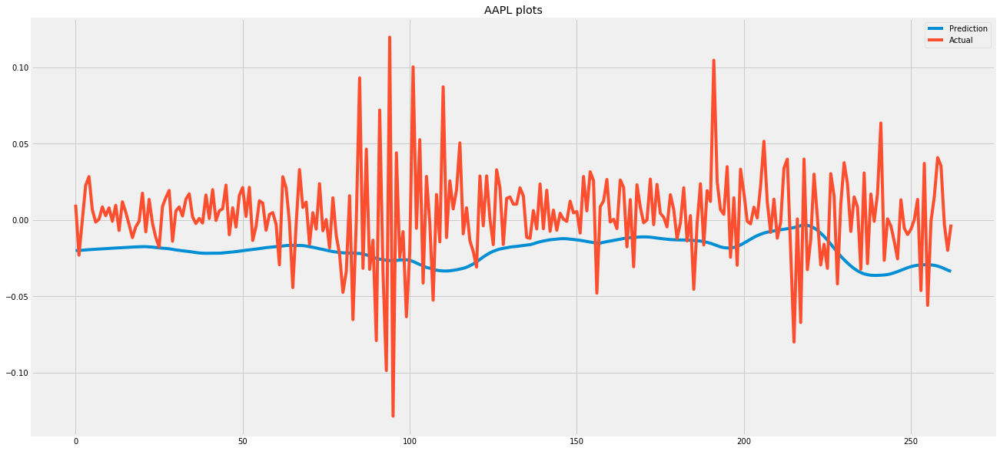

Epoch 1/50
156/156 [==============================] - 3s 19ms/step - loss: 0.0191 - val_loss: 0.0031
Epoch 2/50
156/156 [==============================] - 2s 15ms/step - loss: 0.0016 - val_loss: 0.0027
Epoch 3/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 4/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 5/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 6/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0016 - val_loss: 0.0023
Epoch 7/50
156/156 [==============================] - 2s 15ms/step - loss: 0.0016 - val_loss: 0.0023
Epoch 8/50
156/156 [==============================] - 3s 17ms/step - loss: 0.0016 - val_loss: 0.0023
Epoch 9/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0016 - val_loss: 0.0023
Epoch 10/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0016 - val_lo

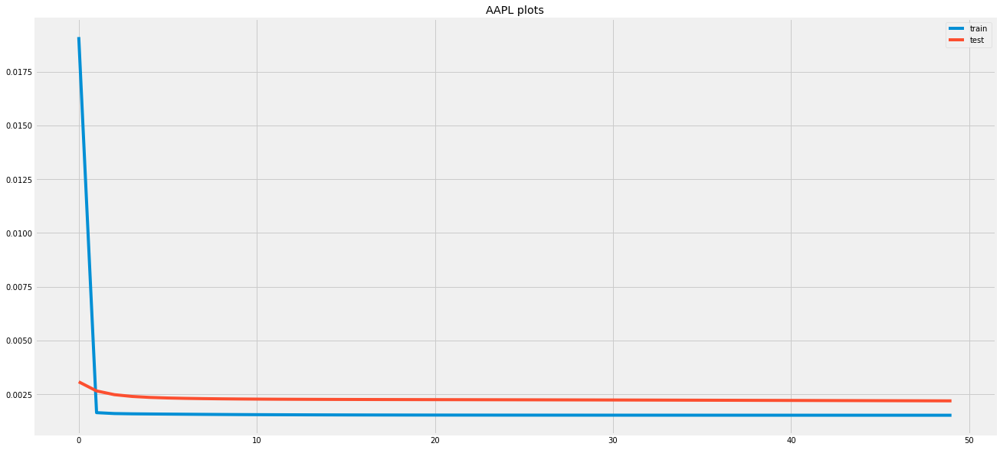

Test RMSE: 0.031


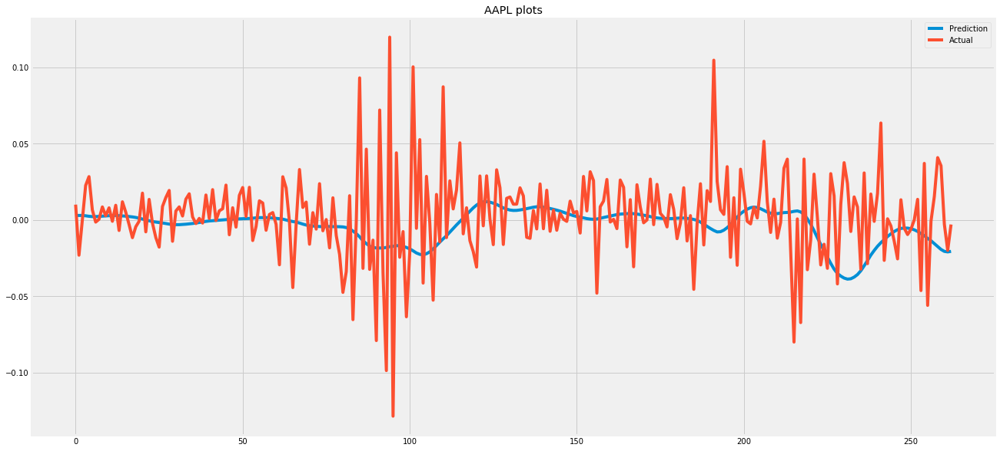

Finished process for: AAPL


In [358]:
#['AAPL', 'AMZN', 'MSFT', 'GOOGL', 'FB', 'BRK.A', 'V', 'WMT',
#                   'JNJ', 'TSLA', 'PG', 'MA', 'JPM', 'NVDA', 'UNH', 'HD', 'VZ', 'DIS',
#                   'ADBE', 'CRM']
lag = 10
forward_looking_days = 1

for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data

    dataset = pd.concat([macd_data.copy(), rsi_data.copy(), bbands_data.copy(), sma_data.copy(), vix_data.copy(),close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = lag, forward_days = forward_looking_days,returns = True)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = lag)
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

Starting process for: AAPL
Epoch 1/50
156/156 [==============================] - 5s 30ms/step - loss: 0.0018 - val_loss: 0.1036
Epoch 2/50
156/156 [==============================] - 4s 24ms/step - loss: 0.0056 - val_loss: 0.1105
Epoch 3/50
156/156 [==============================] - 4s 24ms/step - loss: 0.0046 - val_loss: 0.0907
Epoch 4/50
156/156 [==============================] - 4s 24ms/step - loss: 0.0050 - val_loss: 0.0735
Epoch 5/50
156/156 [==============================] - 4s 27ms/step - loss: 0.0057 - val_loss: 0.0674
Epoch 6/50
156/156 [==============================] - 4s 25ms/step - loss: 0.0062 - val_loss: 0.0663
Epoch 7/50
156/156 [==============================] - 4s 23ms/step - loss: 0.0063 - val_loss: 0.0676
Epoch 8/50
156/156 [==============================] - 4s 23ms/step - loss: 0.0064 - val_loss: 0.0687
Epoch 9/50
156/156 [==============================] - 4s 23ms/step - loss: 0.0065 - val_loss: 0.0689
Epoch 10/50
156/156 [==============================] - 4s 23ms/s

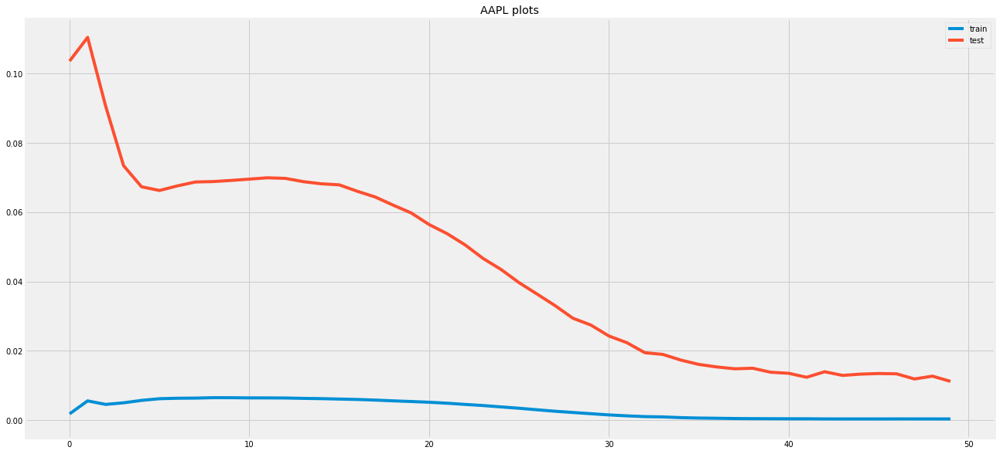

Test RMSE: 25.179


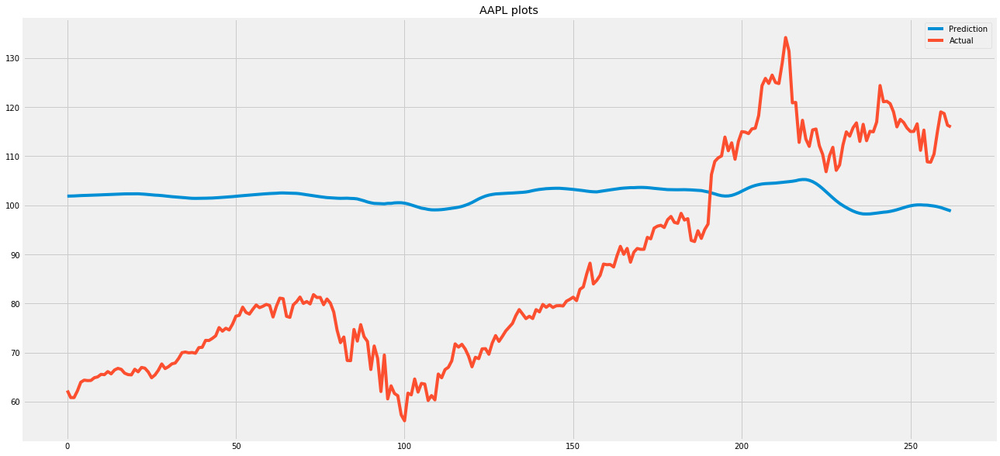

Epoch 1/50
156/156 [==============================] - 3s 16ms/step - loss: 0.0014 - val_loss: 0.1425
Epoch 2/50
156/156 [==============================] - 2s 13ms/step - loss: 0.0057 - val_loss: 0.1067
Epoch 3/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0047 - val_loss: 0.0723
Epoch 4/50
156/156 [==============================] - 3s 18ms/step - loss: 0.0050 - val_loss: 0.0586
Epoch 5/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0051 - val_loss: 0.0527
Epoch 6/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0048 - val_loss: 0.0482
Epoch 7/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0043 - val_loss: 0.0439
Epoch 8/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0038 - val_loss: 0.0397
Epoch 9/50
156/156 [==============================] - 2s 14ms/step - loss: 0.0034 - val_loss: 0.0356
Epoch 10/50
156/156 [==============================] - 2s 13ms/step - loss: 0.0029 - val_lo

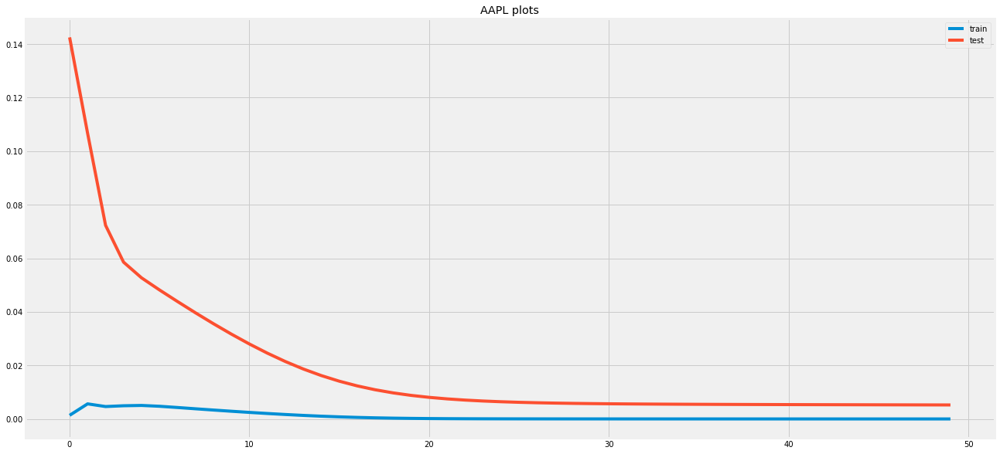

Test RMSE: 9.725


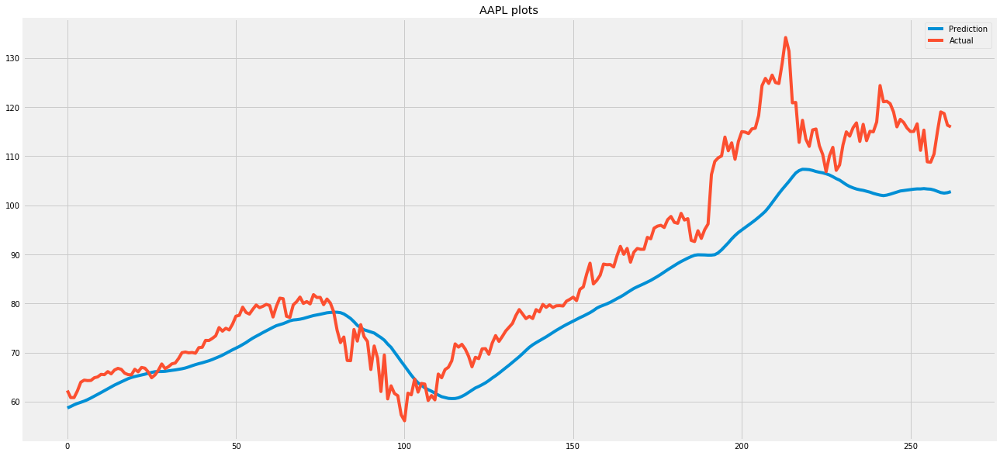

Finished process for: AAPL


In [359]:
lag = 10
forward_looking_days = 1

for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data

    dataset = pd.concat([macd_data.copy(), rsi_data.copy(), bbands_data.copy(), sma_data.copy(), vix_data.copy(),close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = lag, forward_days = forward_looking_days,returns = False)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = lag)
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

Starting process for: AAPL
Epoch 1/50
157/157 [==============================] - 3s 16ms/step - loss: 0.0014 - val_loss: 0.0885
Epoch 2/50
157/157 [==============================] - 1s 8ms/step - loss: 0.0067 - val_loss: 0.0810
Epoch 3/50
157/157 [==============================] - 1s 8ms/step - loss: 0.0071 - val_loss: 0.0770
Epoch 4/50
157/157 [==============================] - 1s 8ms/step - loss: 0.0073 - val_loss: 0.0764
Epoch 5/50
157/157 [==============================] - 1s 8ms/step - loss: 0.0075 - val_loss: 0.0742
Epoch 6/50
157/157 [==============================] - 1s 8ms/step - loss: 0.0078 - val_loss: 0.0767
Epoch 7/50
157/157 [==============================] - 1s 8ms/step - loss: 0.0077 - val_loss: 0.0780
Epoch 8/50
157/157 [==============================] - 1s 8ms/step - loss: 0.0077 - val_loss: 0.0781
Epoch 9/50
157/157 [==============================] - 1s 8ms/step - loss: 0.0079 - val_loss: 0.0795
Epoch 10/50
157/157 [==============================] - 1s 8ms/step - los

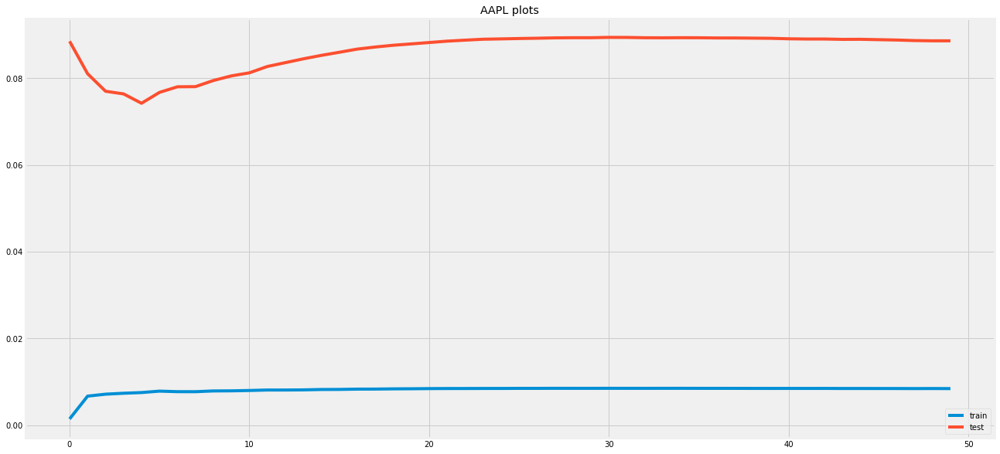

Test RMSE: 39.879


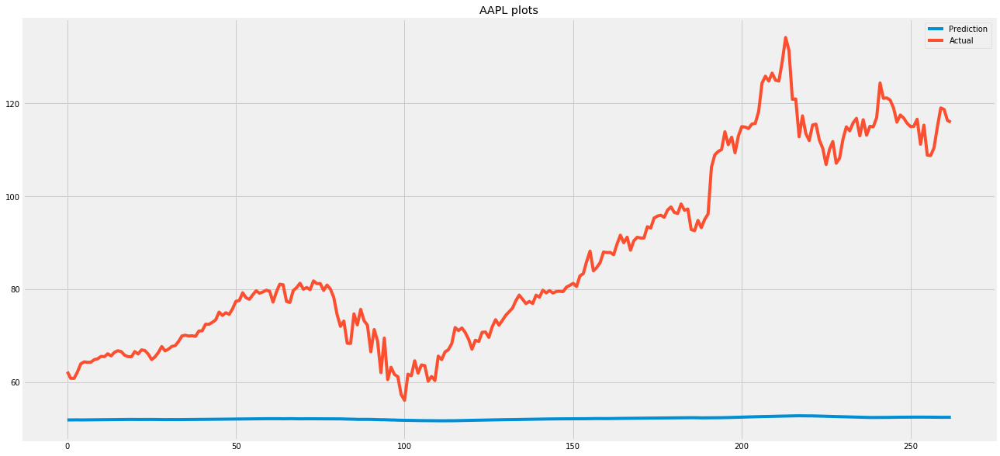

Epoch 1/50
157/157 [==============================] - 1s 8ms/step - loss: 9.2812e-04 - val_loss: 0.0791
Epoch 2/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0079 - val_loss: 0.0767
Epoch 3/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0076 - val_loss: 0.0746
Epoch 4/50
157/157 [==============================] - 1s 6ms/step - loss: 0.0073 - val_loss: 0.0726
Epoch 5/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0071 - val_loss: 0.0708
Epoch 6/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0069 - val_loss: 0.0690
Epoch 7/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0067 - val_loss: 0.0673
Epoch 8/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0065 - val_loss: 0.0657
Epoch 9/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0063 - val_loss: 0.0641
Epoch 10/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0061 - val_loss: 0.

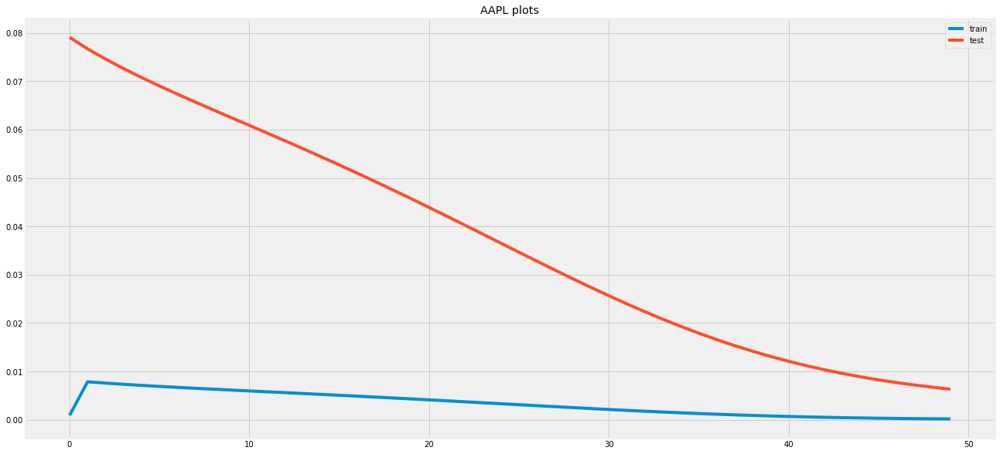

Test RMSE: 10.658


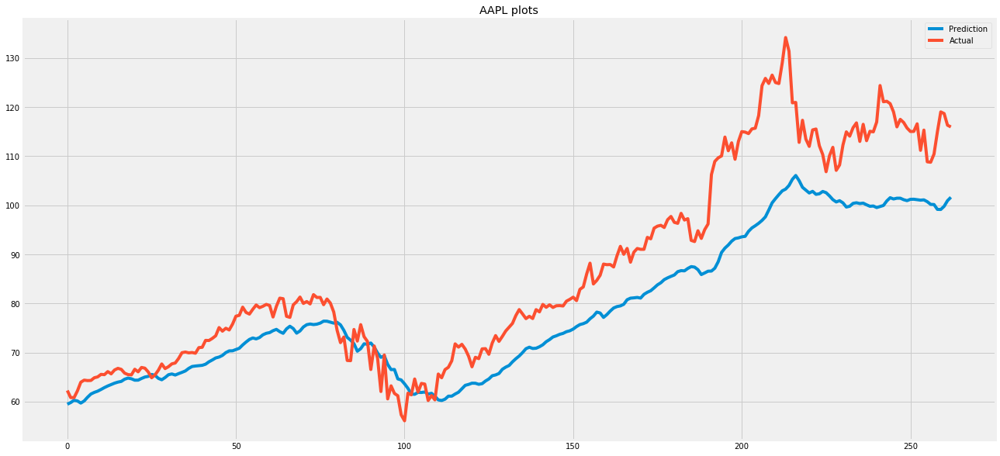

Finished process for: AAPL


In [364]:
lag = 2
forward_looking_days = 1

for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    volume_data=TI.close_data[['volume']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data
    

    dataset = pd.concat([macd_data.copy(), rsi_data.copy(), bbands_data.copy(), sma_data.copy(), vix_data.copy(),volume_data.copy(),close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = lag, forward_days = forward_looking_days,returns = False)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = lag)
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

Starting process for: AAPL
Epoch 1/50
157/157 [==============================] - 2s 14ms/step - loss: 0.0250 - val_loss: 0.0019
Epoch 2/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 3/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 4/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 5/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 6/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 7/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 8/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 9/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 10/50
157/157 [==============================] - 1s 9ms/step - los

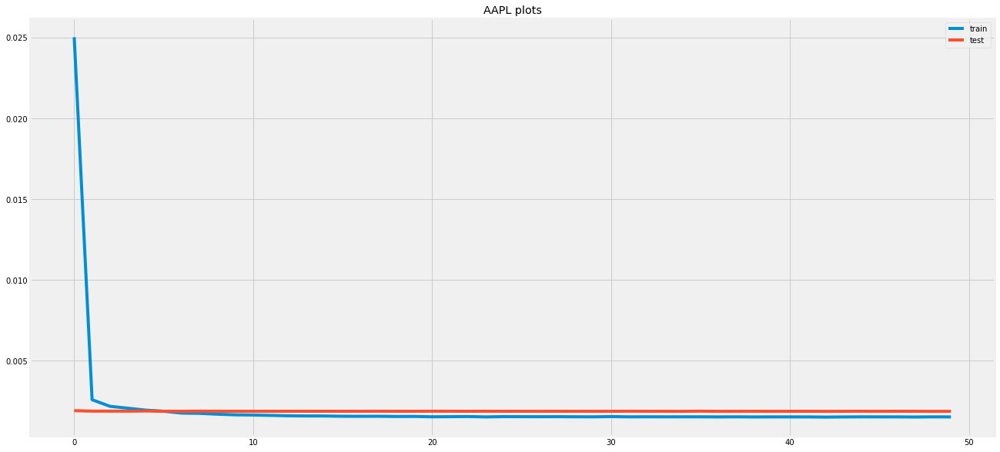

Test RMSE: 0.029


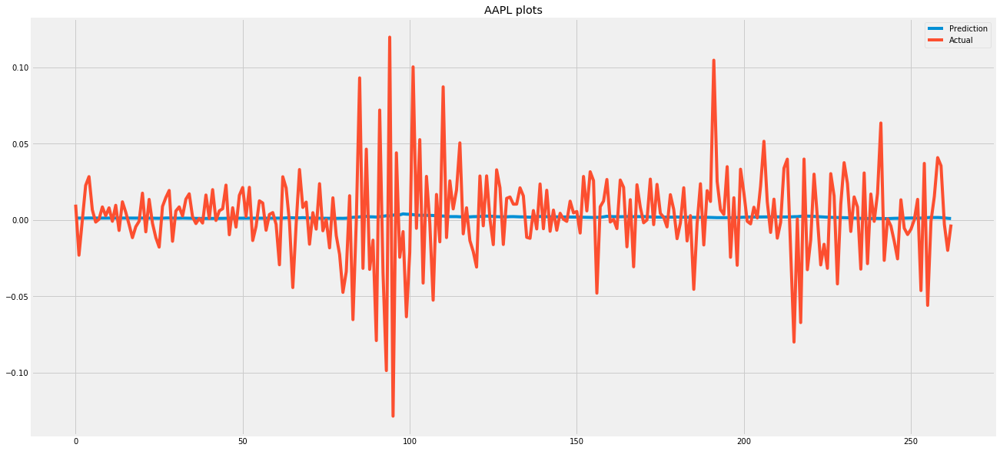

Epoch 1/50
157/157 [==============================] - 1s 9ms/step - loss: 0.0273 - val_loss: 0.0019
Epoch 2/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 3/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 4/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 5/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 6/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 7/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 8/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 9/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 10/50
157/157 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.0019

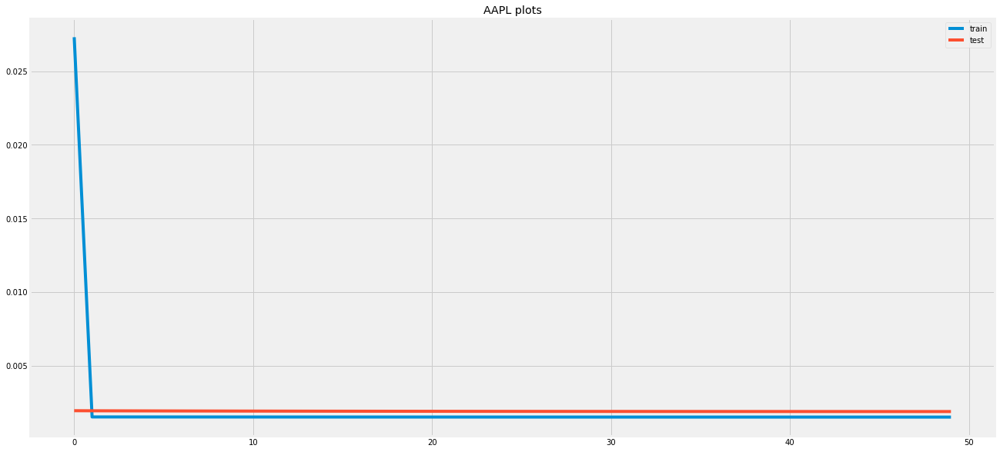

Test RMSE: 0.029


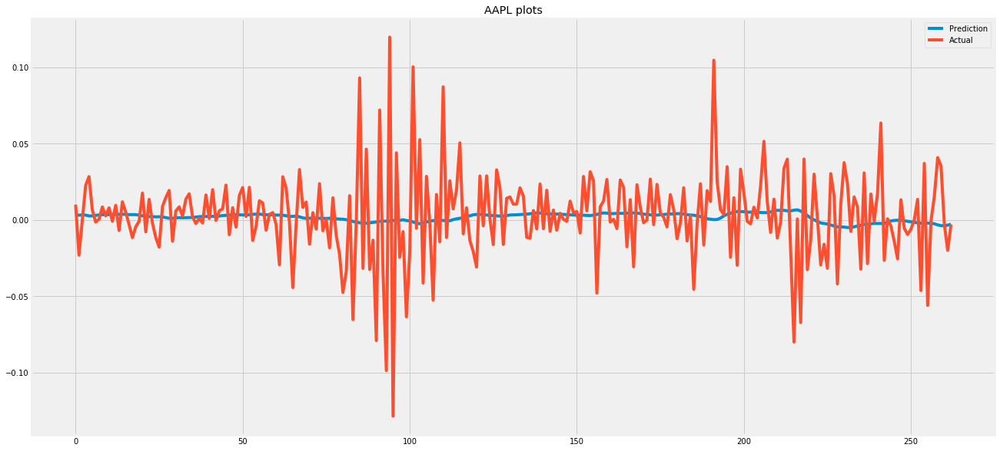

Finished process for: AAPL


In [365]:
lag = 2
forward_looking_days = 1

for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    volume_data=TI.close_data[['volume']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data
    

    dataset = pd.concat([macd_data.copy(), rsi_data.copy(), bbands_data.copy(), sma_data.copy(), vix_data.copy(),volume_data.copy(),close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = lag, forward_days = forward_looking_days,returns = True)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = lag)
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

Starting process for: AAPL
Epoch 1/50
33/33 [==============================] - 3s 76ms/step - loss: 0.0507 - val_loss: 0.0049
Epoch 2/50
33/33 [==============================] - 2s 65ms/step - loss: 0.0091 - val_loss: 0.0047
Epoch 3/50
33/33 [==============================] - 2s 64ms/step - loss: 0.0073 - val_loss: 0.0051
Epoch 4/50
33/33 [==============================] - 2s 67ms/step - loss: 0.0066 - val_loss: 0.0046
Epoch 5/50
33/33 [==============================] - 2s 64ms/step - loss: 0.0060 - val_loss: 0.0049
Epoch 6/50
33/33 [==============================] - 2s 63ms/step - loss: 0.0057 - val_loss: 0.0049
Epoch 7/50
33/33 [==============================] - 2s 65ms/step - loss: 0.0055 - val_loss: 0.0045
Epoch 8/50
33/33 [==============================] - 2s 64ms/step - loss: 0.0053 - val_loss: 0.0042
Epoch 9/50
33/33 [==============================] - 2s 64ms/step - loss: 0.0051 - val_loss: 0.0040
Epoch 10/50
33/33 [==============================] - 2s 63ms/step - loss: 0.0051 -

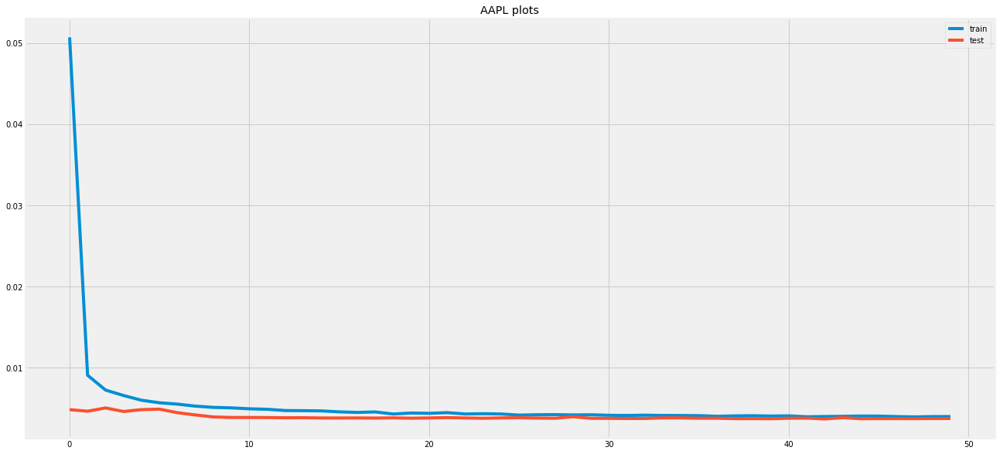

Test RMSE: 0.055


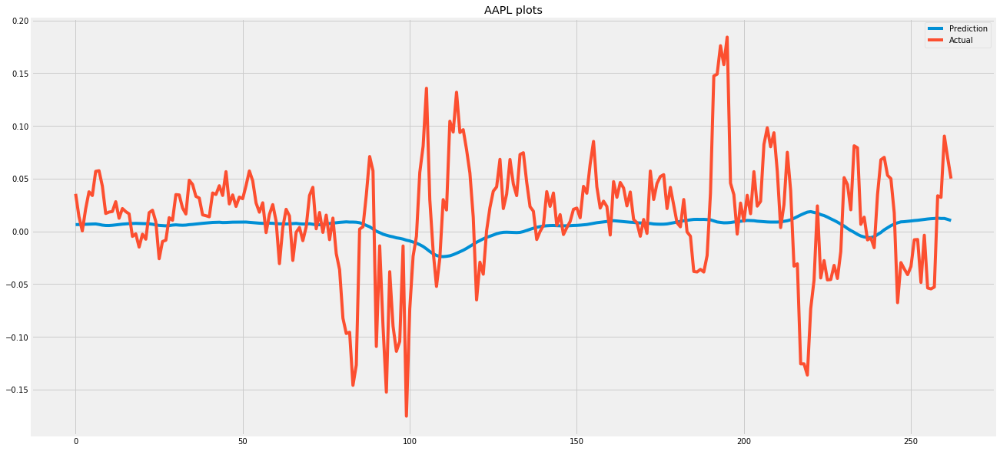

Epoch 1/50
155/155 [==============================] - 14s 90ms/step - loss: 0.0191 - val_loss: 0.0036
Epoch 2/50
155/155 [==============================] - 12s 80ms/step - loss: 0.0054 - val_loss: 0.0035
Epoch 3/50
155/155 [==============================] - 12s 76ms/step - loss: 0.0050 - val_loss: 0.0036
Epoch 4/50
155/155 [==============================] - 12s 76ms/step - loss: 0.0048 - val_loss: 0.0036
Epoch 5/50
155/155 [==============================] - 11s 74ms/step - loss: 0.0045 - val_loss: 0.0037
Epoch 6/50
155/155 [==============================] - 13s 81ms/step - loss: 0.0045 - val_loss: 0.0036
Epoch 7/50
155/155 [==============================] - 11s 74ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 8/50
155/155 [==============================] - 12s 79ms/step - loss: 0.0044 - val_loss: 0.0037
Epoch 9/50
155/155 [==============================] - 12s 75ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 10/50
155/155 [==============================] - 11s 73ms/step - loss: 0.004

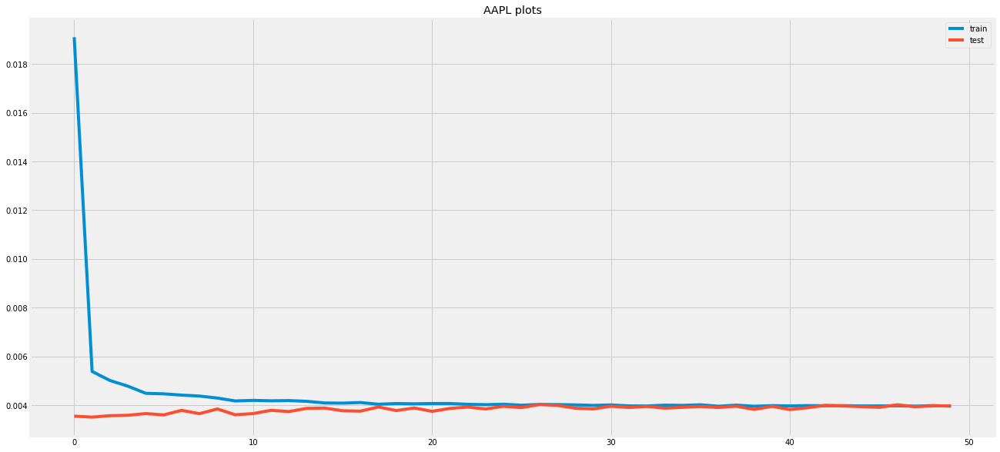

Test RMSE: 0.056


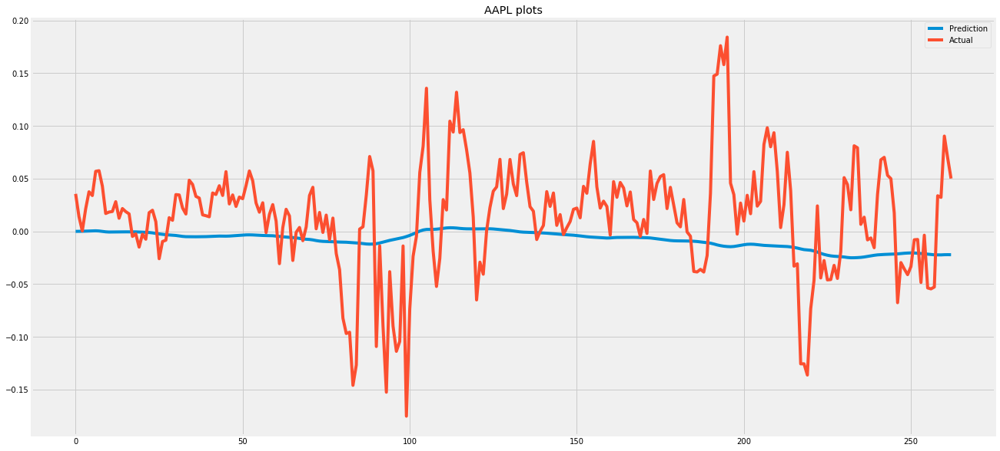

Epoch 1/50
155/155 [==============================] - 8s 53ms/step - loss: 0.0127 - val_loss: 0.0070
Epoch 2/50
155/155 [==============================] - 8s 52ms/step - loss: 0.0041 - val_loss: 0.0061
Epoch 3/50
155/155 [==============================] - 7s 46ms/step - loss: 0.0042 - val_loss: 0.0056
Epoch 4/50
155/155 [==============================] - 9s 57ms/step - loss: 0.0042 - val_loss: 0.0052
Epoch 5/50
155/155 [==============================] - 8s 50ms/step - loss: 0.0042 - val_loss: 0.0049
Epoch 6/50
155/155 [==============================] - 8s 54ms/step - loss: 0.0042 - val_loss: 0.0047
Epoch 7/50
155/155 [==============================] - 8s 49ms/step - loss: 0.0042 - val_loss: 0.0046
Epoch 8/50
155/155 [==============================] - 8s 49ms/step - loss: 0.0042 - val_loss: 0.0044
Epoch 9/50
155/155 [==============================] - 8s 49ms/step - loss: 0.0042 - val_loss: 0.0043
Epoch 10/50
155/155 [==============================] - 8s 52ms/step - loss: 0.0041 - val_lo

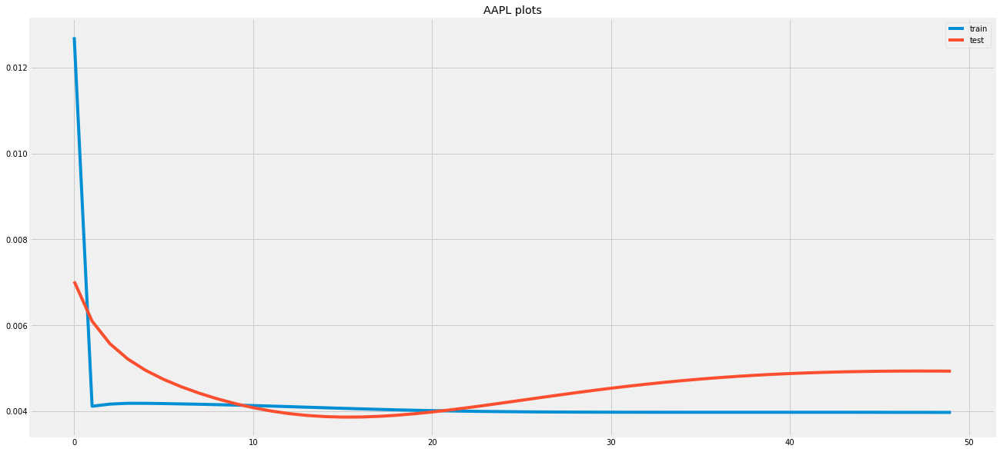

Test RMSE: 0.062


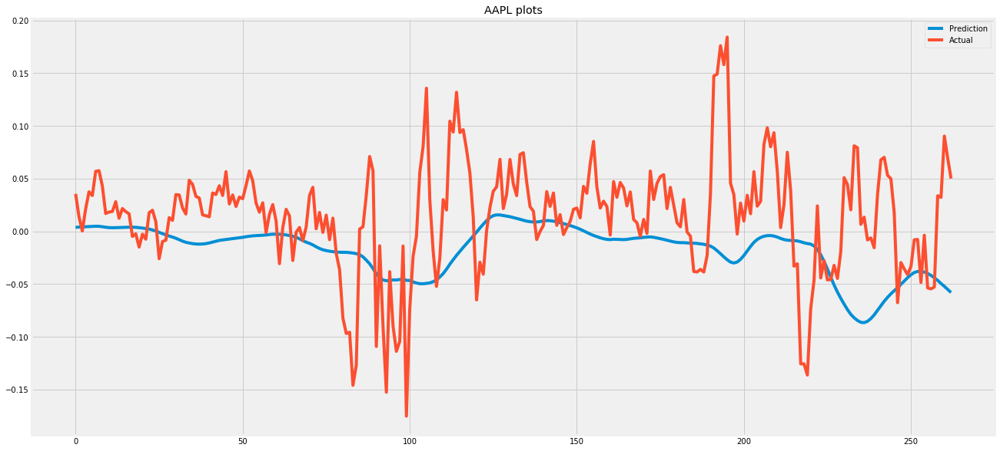

Finished process for: AAPL


In [371]:
lag = 42
forward_looking_days = 5

for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    volume_data=TI.close_data[['volume']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data
    

    dataset = pd.concat([macd_data.copy(), rsi_data.copy(), bbands_data.copy(), sma_data.copy(), vix_data.copy(),volume_data.copy(),close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = lag, forward_days = forward_looking_days,returns = True)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = lag)
    
    exec('%s_model_gr, %s_history_gr = train_combo_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gr, %s_history_gr, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

Starting process for: AAPL
Epoch 1/50
33/33 [==============================] - 2s 75ms/step - loss: 0.0104 - val_loss: 0.1567
Epoch 2/50
33/33 [==============================] - 2s 70ms/step - loss: 0.0054 - val_loss: 0.1041
Epoch 3/50
33/33 [==============================] - 2s 65ms/step - loss: 0.0027 - val_loss: 0.0556
Epoch 4/50
33/33 [==============================] - 2s 62ms/step - loss: 0.0015 - val_loss: 0.0314
Epoch 5/50
33/33 [==============================] - 2s 71ms/step - loss: 0.0010 - val_loss: 0.0202
Epoch 6/50
33/33 [==============================] - 2s 63ms/step - loss: 8.5166e-04 - val_loss: 0.0152
Epoch 7/50
33/33 [==============================] - 2s 63ms/step - loss: 7.6627e-04 - val_loss: 0.0133
Epoch 8/50
33/33 [==============================] - 2s 63ms/step - loss: 7.4768e-04 - val_loss: 0.0110
Epoch 9/50
33/33 [==============================] - 2s 61ms/step - loss: 6.9909e-04 - val_loss: 0.0100
Epoch 10/50
33/33 [==============================] - 2s 70ms/step 

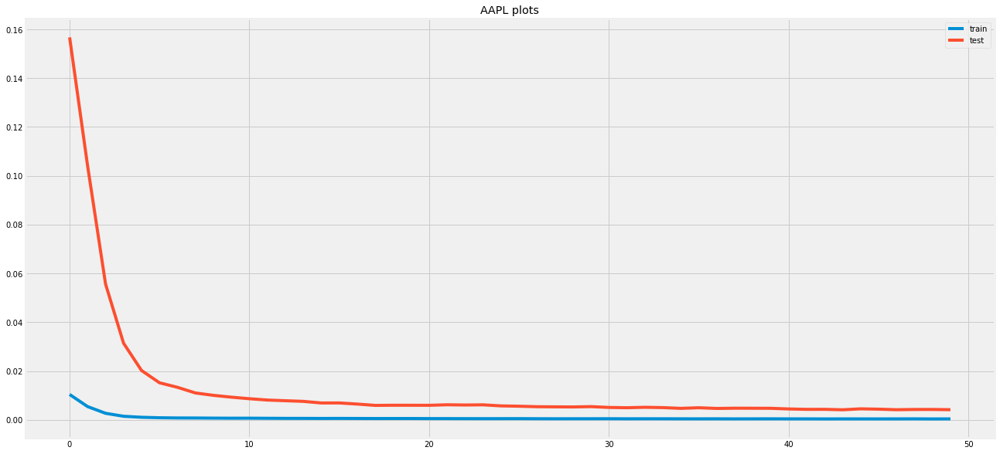

Test RMSE: 8.631


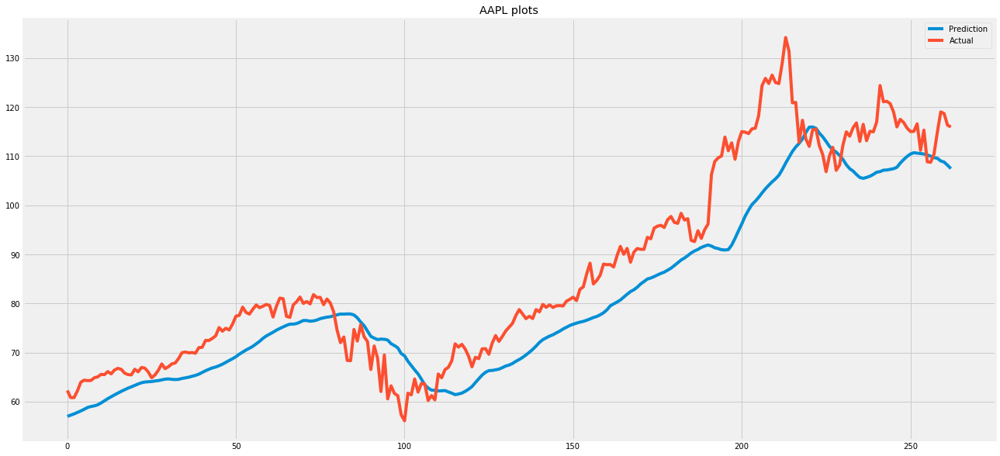

Epoch 1/50
155/155 [==============================] - 14s 93ms/step - loss: 0.0011 - val_loss: 0.0961
Epoch 2/50
155/155 [==============================] - 12s 77ms/step - loss: 0.0050 - val_loss: 0.1108
Epoch 3/50
155/155 [==============================] - 11s 73ms/step - loss: 0.0045 - val_loss: 0.0907
Epoch 4/50
155/155 [==============================] - 11s 70ms/step - loss: 0.0054 - val_loss: 0.0778
Epoch 5/50
155/155 [==============================] - 11s 71ms/step - loss: 0.0062 - val_loss: 0.0746
Epoch 6/50
155/155 [==============================] - 11s 69ms/step - loss: 0.0069 - val_loss: 0.0759
Epoch 7/50
155/155 [==============================] - 11s 70ms/step - loss: 0.0071 - val_loss: 0.0780
Epoch 8/50
155/155 [==============================] - 11s 72ms/step - loss: 0.0073 - val_loss: 0.0800
Epoch 9/50
155/155 [==============================] - 12s 78ms/step - loss: 0.0075 - val_loss: 0.0816
Epoch 10/50
155/155 [==============================] - 11s 72ms/step - loss: 0.007

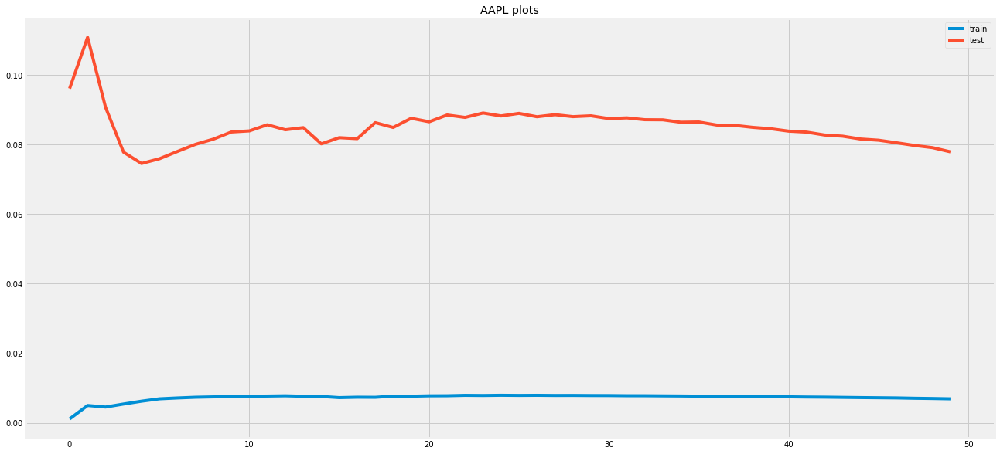

Test RMSE: 37.385


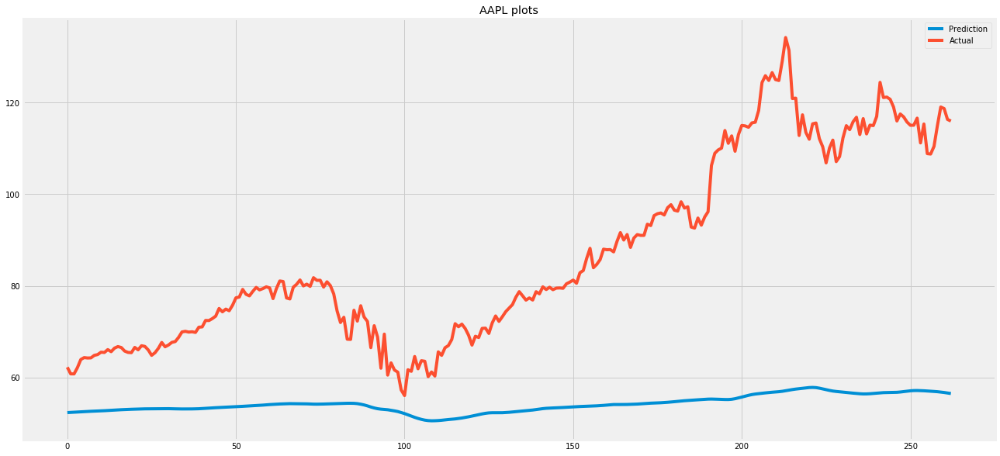

Epoch 1/50
155/155 [==============================] - 9s 57ms/step - loss: 0.0010 - val_loss: 0.1030
Epoch 2/50
155/155 [==============================] - 9s 56ms/step - loss: 0.0039 - val_loss: 0.0849
Epoch 3/50
155/155 [==============================] - 8s 52ms/step - loss: 0.0042 - val_loss: 0.0671
Epoch 4/50
155/155 [==============================] - 10s 62ms/step - loss: 0.0049 - val_loss: 0.0618
Epoch 5/50
155/155 [==============================] - 10s 63ms/step - loss: 0.0053 - val_loss: 0.0604
Epoch 6/50
155/155 [==============================] - 9s 56ms/step - loss: 0.0054 - val_loss: 0.0599
Epoch 7/50
155/155 [==============================] - 10s 63ms/step - loss: 0.0054 - val_loss: 0.0593
Epoch 8/50
155/155 [==============================] - 8s 54ms/step - loss: 0.0053 - val_loss: 0.0587
Epoch 9/50
155/155 [==============================] - 8s 53ms/step - loss: 0.0053 - val_loss: 0.0579
Epoch 10/50
155/155 [==============================] - 9s 58ms/step - loss: 0.0052 - val

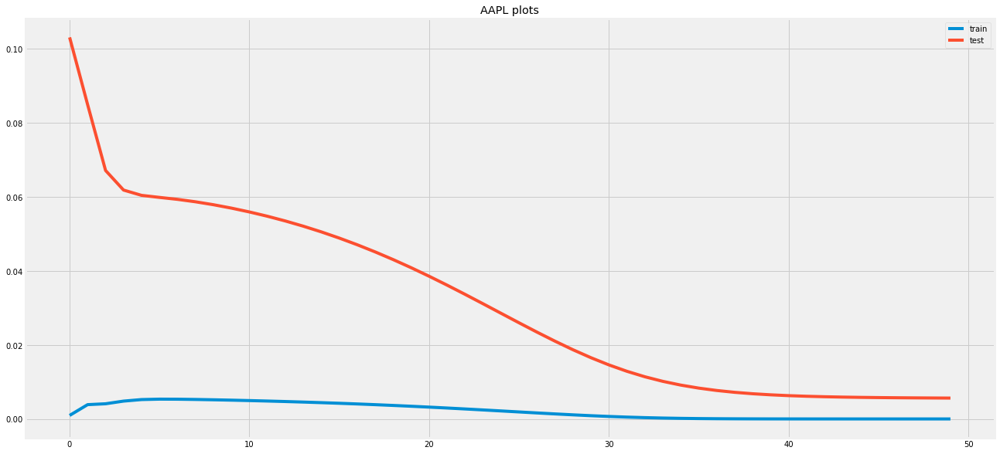

Test RMSE: 10.126


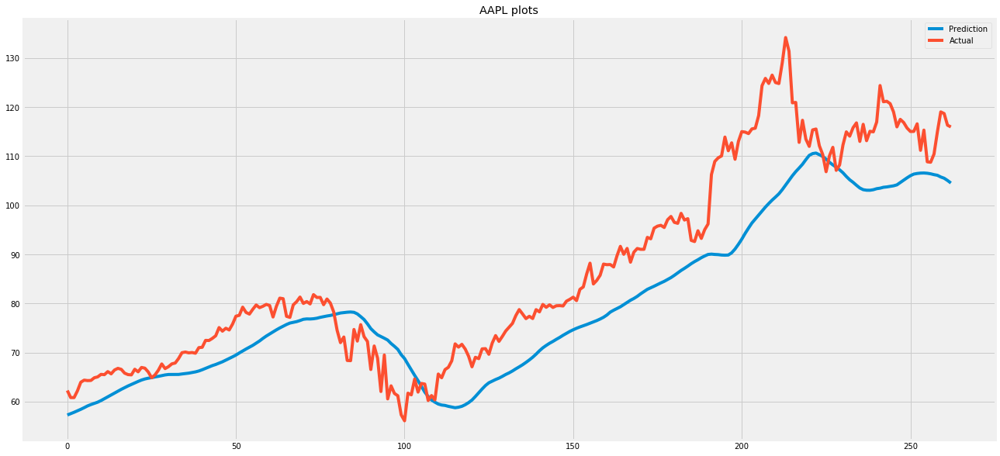

Finished process for: AAPL


In [373]:
lag = 42
forward_looking_days = 5

for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    volume_data=TI.close_data[['volume']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data
    

    dataset = pd.concat([vix_data.copy(),volume_data.copy(),close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = lag, forward_days = forward_looking_days,returns = False)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = lag)
    
    exec('%s_model_gr, %s_history_gr = train_combo_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gr, %s_history_gr, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

Starting process for: AAPL
Epoch 1/50
33/33 [==============================] - 4s 126ms/step - loss: 0.0140 - val_loss: 0.2196
Epoch 2/50
33/33 [==============================] - 3s 101ms/step - loss: 0.0081 - val_loss: 0.1430
Epoch 3/50
33/33 [==============================] - 4s 124ms/step - loss: 0.0045 - val_loss: 0.0786
Epoch 4/50
33/33 [==============================] - 3s 93ms/step - loss: 0.0019 - val_loss: 0.0305
Epoch 5/50
33/33 [==============================] - 3s 89ms/step - loss: 7.0711e-04 - val_loss: 0.0110
Epoch 6/50
33/33 [==============================] - 3s 85ms/step - loss: 4.1500e-04 - val_loss: 0.0065
Epoch 7/50
33/33 [==============================] - 3s 86ms/step - loss: 3.7061e-04 - val_loss: 0.0055
Epoch 8/50
33/33 [==============================] - 3s 81ms/step - loss: 3.7409e-04 - val_loss: 0.0050
Epoch 9/50
33/33 [==============================] - 3s 81ms/step - loss: 3.9219e-04 - val_loss: 0.0051
Epoch 10/50
33/33 [==============================] - 3s 100

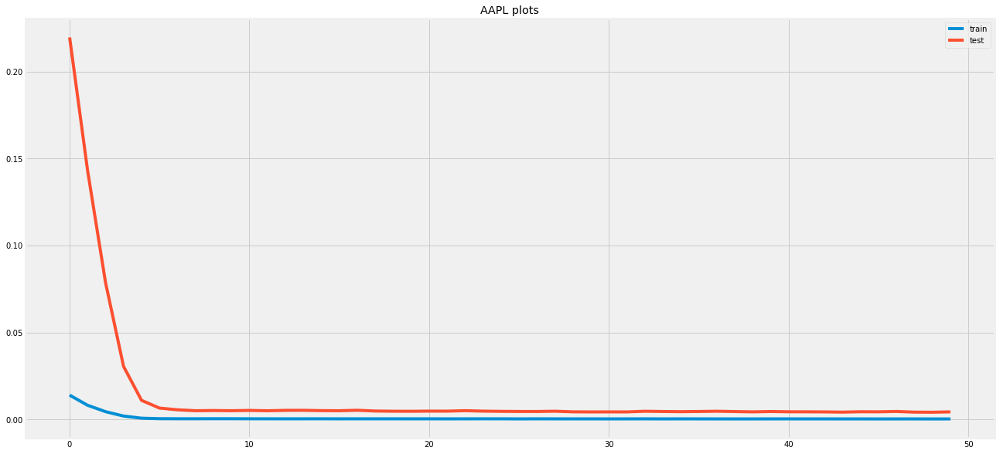

Test RMSE: 8.831


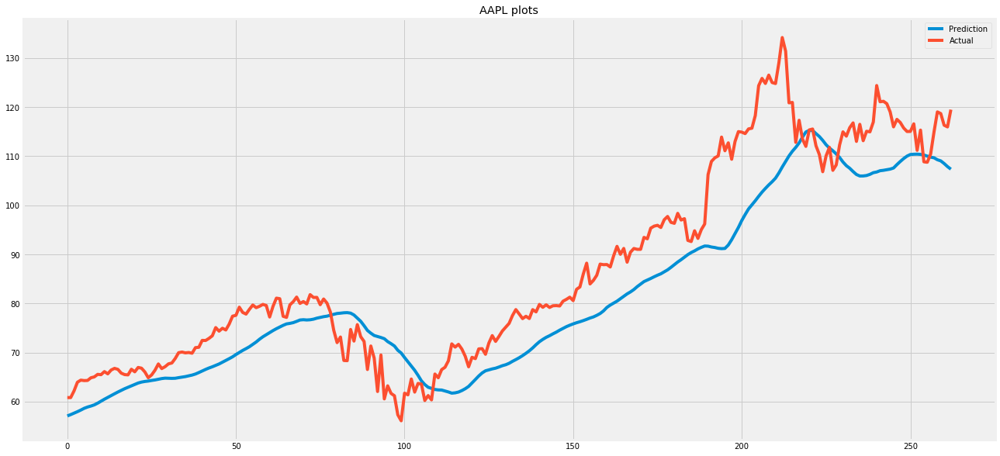

Epoch 1/50
155/155 [==============================] - 18s 114ms/step - loss: 0.0014 - val_loss: 0.1087
Epoch 2/50
155/155 [==============================] - 15s 100ms/step - loss: 0.0058 - val_loss: 0.1032
Epoch 3/50
155/155 [==============================] - 16s 100ms/step - loss: 0.0053 - val_loss: 0.0825
Epoch 4/50
155/155 [==============================] - 16s 101ms/step - loss: 0.0063 - val_loss: 0.0756
Epoch 5/50
155/155 [==============================] - 15s 98ms/step - loss: 0.0070 - val_loss: 0.0746
Epoch 6/50
155/155 [==============================] - 15s 97ms/step - loss: 0.0073 - val_loss: 0.0750
Epoch 7/50
155/155 [==============================] - 15s 95ms/step - loss: 0.0075 - val_loss: 0.0780
Epoch 8/50
155/155 [==============================] - 15s 96ms/step - loss: 0.0077 - val_loss: 0.0794
Epoch 9/50
155/155 [==============================] - 15s 96ms/step - loss: 0.0078 - val_loss: 0.0805
Epoch 10/50
155/155 [==============================] - 15s 95ms/step - loss: 0

In [ ]:
lag = 60
forward_looking_days = 5

for model_name in ['AAPL']:
    print('Starting process for: %s' % (model_name))
    TI=TechnicalIndicators(symbol=model_name, request_input=False)
    close_data=TI.close_data[['close']]
    volume_data=TI.close_data[['volume']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data

    dataset = pd.concat([close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

    dataset = dataset.sort_index(ascending=True)
    close_data = dataset[['close']]
    
    X, y = get_modelling_data(dataset = dataset, lag = lag, forward_days = forward_looking_days,returns = False)
    a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = lag)
    
    exec('%s_model_gr, %s_history_gr = train_combo_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gr, %s_history_gr, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_gru, %s_history_gru = train_gru_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_gru, %s_history_gru, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    exec('%s_model_lstm, %s_history_lstm = train_models(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test)' % (model_name,model_name))
    exec("create_training_plots(%s_model_lstm, %s_history_lstm, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler,title='%s plots')" % (model_name,model_name,model_name))
    
    print('Finished process for: %s' % (model_name))

In [33]:
import datetime
import holidays


def next_business_day(from_date):
    ONE_DAY = datetime.timedelta(days=1)
    HOLIDAYS_US = holidays.US()
    
    next_day = from_date + ONE_DAY
    while next_day.weekday() in holidays.WEEKEND or next_day in HOLIDAYS_US:
        next_day += ONE_DAY
    return next_day

def create_prediction_array(X, scaler, lag = 60,forward_range = 5):

    values_x = X.values
    
    inputs_x = values_x[(values_x.shape[0] - lag):]
    inputs_x = scaler.transform(inputs_x)

    inputs_x = inputs_x.reshape(inputs_x.shape[0],1,inputs_x.shape[1])

    x_test_lag = []
    for x in range(lag,inputs_x.shape[0]+1):
        x_test_lag.append(inputs_x[(x-lag):x,0])
       
    x_test_lag = np.array(x_test_lag)
    x_test_lag = np.reshape(x_test_lag,(x_test_lag.shape[0],x_test_lag.shape[1],X.shape[1]))
    
    return x_test_lag


def latest_predictions(symbol, root_dir='Stock-Prediction-models'):
    
    lags = [7]#[3,3,7] 
    forward_looking_days_con = [1]#[5,3,1]
    
    TI=TechnicalIndicators(symbol=symbol, request_input=False)
    close_data=TI.close_data[['close']]
    volume_data=TI.close_data[['volume']]
    macd_data=TI.macd_data
    rsi_data=TI.rsi_data
    bbands_data=TI.bbands_data
    sma_data=TI.sma_data
    vix_data = TI.vix_data
    
    predictions = {}
    
    for i in range(len(lags)):
        print('Starting process for: %s-days lag and %s-days forward prediction' % (lags[i],forward_looking_days_con[i]))

        lag, forward_looking_days = lags[i], forward_looking_days_con[i]
        
        if forward_looking_days == 1:
            window_size = 7
            dataset = close_data['close'].values[-150:]
            predictions_custom = close_data[-100:].copy()
            predictions_custom.columns = ['Actual Price']
            
            # Calling `save('my_model')` creates a SavedModel folder `my_model`.
            reconstructed_model = eval("keras.models.load_model('%s/%s_model_gr_%sday_lag_%sday_forward')" % (root_dir, symbol, lag, forward_looking_days))
            
            X_,y_ = getdata(close_data['close'].values[-150:],window_size)
            yhat = reconstructed_model.predict(X_[-100:])
            
            predictions_custom['Predicted Price'] = yhat
                        
            X = np.array([1]*window_size)
            for i in range(window_size, len(dataset)+1):
                X = np.vstack((X,dataset[i-window_size:i]))
            
            X = X[1:]
            yhat_new = reconstructed_model.predict(X[-1:])
            
            next_bus_day = next_business_day(close_data.index[-1])
            predictions_custom.loc[next_bus_day, 'Predicted Price'] = yhat_new[0][0]
            
            predictions[forward_looking_days] = predictions_custom
        
        else:
            if forward_looking_days == 3:
                dataset = pd.concat([volume_data.copy(), vix_data.copy(), close_data.copy()], axis=1,sort=True).reindex(macd_data.index)
            else:
                dataset = pd.concat([rsi_data.copy(), volume_data.copy(), vix_data.copy(), close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

            dataset = dataset.sort_index(ascending=True)

            # Load the x-scaler
            scaler_x = eval("load(open('%s/%s_scaler_x_%sdays_forward.pkl', 'rb'))" % (root_dir, symbol, forward_looking_days))

            x_test_lag = create_prediction_array(X = dataset[-100:], scaler = scaler_x, lag = lag, forward_range = forward_looking_days)

            # It can be used to reconstruct the model identically.
            #reconstructed_model = keras.models.load_model("my_model")

            #print('%s/%s_model_gr_%sday_lag_%sday_forward' % (root_dir, symbol, lag, forward_looking_days))

            # Calling `save('my_model')` creates a SavedModel folder `my_model`.
            reconstructed_model = eval("keras.models.load_model('%s/%s_model_gr_%sday_lag_%sday_forward')" % (root_dir, symbol, lag, forward_looking_days))

            # Load the y-scaler
            scaler_y = eval("load(open('%s/%s_scaler_y_%sdays_forward.pkl', 'rb'))" % (root_dir, symbol, forward_looking_days))


            yhat = reconstructed_model.predict(x_test_lag)

            inv_yhat = scaler_y.inverse_transform(yhat)

            predictions[forward_looking_days] = (float(inv_yhat),dataset['close'][-1])

    return predictions



def train_deployment_models(root_dir='Stock-Prediction-models', 
                            stocks=['AMZN'], 
                            lags = [42,2,2], 
                            forward_looking_days_con = [5,5,1],
                            epochs = 100, 
                            verbose = 0,
                            train_ratio=0.95):
    """
    Parameters:
    Notes - rsi + vix + volu + best for  5 day (144.428) & 1 day (98.55)
          - volu best 3 day (132.793)
          volume_data.copy(),
          
          
    """

    for model_name in stocks:
        print('Starting process for: %s' % (model_name))
        
        TI=TechnicalIndicators(symbol=model_name, request_input=False)
        close_data=TI.close_data[['close']]
        volume_data=TI.close_data[['volume']]
        macd_data=TI.macd_data
        rsi_data=TI.rsi_data
        bbands_data=TI.bbands_data
        sma_data=TI.sma_data
        vix_data = TI.vix_data
        
        for i in range(len(lags)):
            print('Starting process for: %s-days lag and %s-days forward prediction' % (lags[i],forward_looking_days_con[i]))
            
            lag, forward_looking_days = lags[i], forward_looking_days_con[i]
            
            if forward_looking_days == 3:
                dataset = pd.concat([ volume_data.copy(),vix_data.copy(), close_data.copy()], axis=1,sort=True).reindex(macd_data.index)
            else:
                dataset = pd.concat([rsi_data.copy(), volume_data.copy(), vix_data.copy(), close_data.copy()], axis=1,sort=True).reindex(macd_data.index)
            
            dataset = dataset.sort_index(ascending=True)
            
            X, y = get_modelling_data(dataset_= dataset, lag_ = lag, forward_days_ = forward_looking_days,returns_ = False)
            a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler_x,scaler_y = create_test_and_train_sets(X=X, y=y, train_ratio=train_ratio, lag = lag)
            
            
            if forward_looking_days == 1:
                window_size = 7
                X_,y_ = getdata(y['close'].values,window_size)
                
                X_train_ = X_[:int(X_.shape[0]*train_ratio)]
                y_train_ = y_[:int(y_.shape[0]*train_ratio)]
                X_test_ = X_[int(X_.shape[0]*train_ratio):]
                y_test_ = y_[int(y_.shape[0]*train_ratio):]
                #model = train_model_v4(X_,y_,d=0.0)
                exec('%s_model_gr_%sday_lag_%sday_forward, %s_history_gr_%sday_lag_%sday_forward =train_model_v4(X_,y_,d=0.0,epoch = epochs)' % (model_name,window_size,forward_looking_days,model_name,window_size,forward_looking_days))
                
                yhat = eval("%s_model_gr_%sday_lag_%sday_forward.predict(X_test_)" % (model_name,window_size,forward_looking_days))
                plt.plot(yhat)
                plt.plot(y_test_)
                plt.title('%s plots for %s-day lag and %s-day forward looking' % (model_name,window_size,forward_looking_days))
                plt.show()
                
                # Calling `save('my_model')` creates a SavedModel folder `my_model`.
                exec("%s_model_gr_%sday_lag_%sday_forward.save('%s/%s_model_gr_%sday_lag_%sday_forward')" % (model_name,window_size,forward_looking_days,root_dir,model_name, window_size, forward_looking_days))

            else:
                exec('%s_model_gr_%sday_lag_%sday_forward, %s_history_gr_%sday_lag_%sday_forward = train_combo_model(a_train = a_train, b_train=b_train, c_test=c_test, d_test=d_test,epochs = epochs, verbose = verbose)' % (model_name,lag,forward_looking_days,model_name,lag,forward_looking_days))
                exec("create_training_plots(%s_model_gr_%sday_lag_%sday_forward, %s_history_gr_%sday_lag_%sday_forward, c_test=c_test, X_test=X_test, y_test=y_test, scaler=scaler_y,title='%s plots for %s-day lag and %s-day forward looking')" % (model_name,lag,forward_looking_days,model_name,lag,forward_looking_days,model_name,lag,forward_looking_days))


                # Calling `save('my_model')` creates a SavedModel folder `my_model`.
                exec("%s_model_gr_%sday_lag_%sday_forward.save('%s/%s_model_gr_%sday_lag_%sday_forward')" % (model_name,lag,forward_looking_days,root_dir,model_name, lag, forward_looking_days))

                # save the scaler
                exec("dump(scaler_x, open('%s/%s_scaler_x_%sdays_forward.pkl', 'wb'))" % (root_dir, model_name, forward_looking_days))
                exec("dump(scaler_y, open('%s/%s_scaler_y_%sdays_forward.pkl', 'wb'))" % (root_dir, model_name, forward_looking_days))

            
    print('Finished process for: %s' % (model_name))
    
def train_model_v4(X,y,a_dim=100,epoch=50,batch_size=32,d=0.2):
    model = Sequential()
    model.add(Dense(a_dim,activation='relu',input_dim=X.shape[1]))
    model.add(Dropout(d))
    model.add(Dense(a_dim,activation='relu'))
    model.add(Dropout(d))
    model.add(Dense(a_dim,activation='relu'))
    model.add(Dropout(d))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    history = model.fit(X, y, epochs=epoch,batch_size=batch_size,  verbose=0)
    return model, history


def getdata(data,window_size):
    X,y = np.array([1]*window_size),np.array([])
    for i in range(window_size, len(data)):
        X = np.vstack((X,data[i-window_size:i]))
        y = np.append(y,data[i:i+1])

    return X[1:],y



Starting process for: AAPL
Starting process for: 3-days lag and 5-days forward prediction


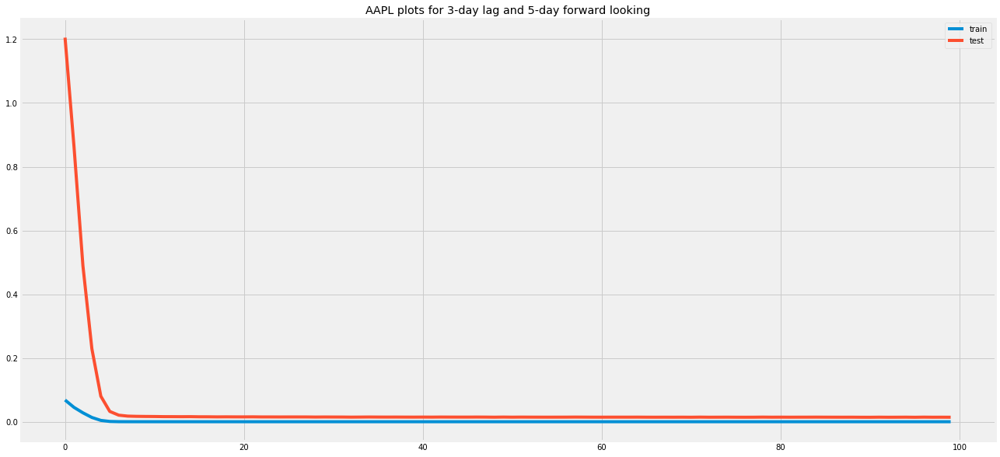

Test RMSE: 7.395


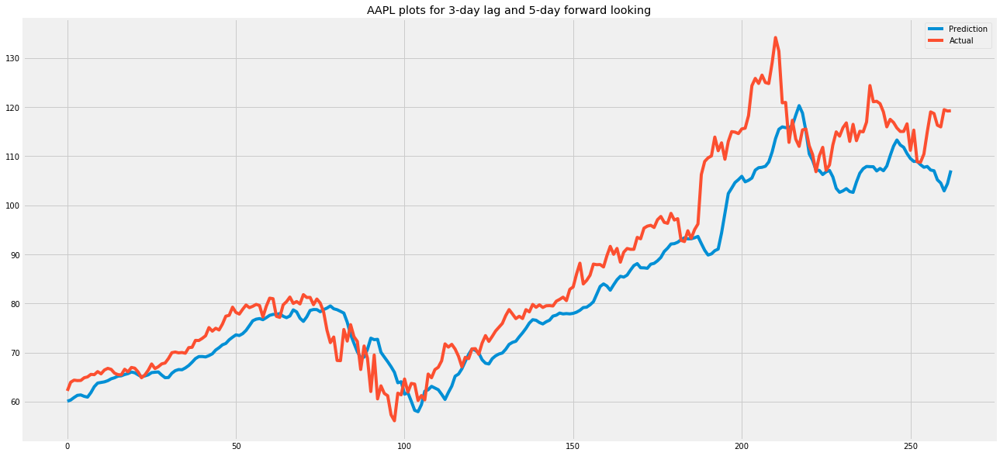

INFO:tensorflow:Assets written to: Stock-Prediction-models/AAPL_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


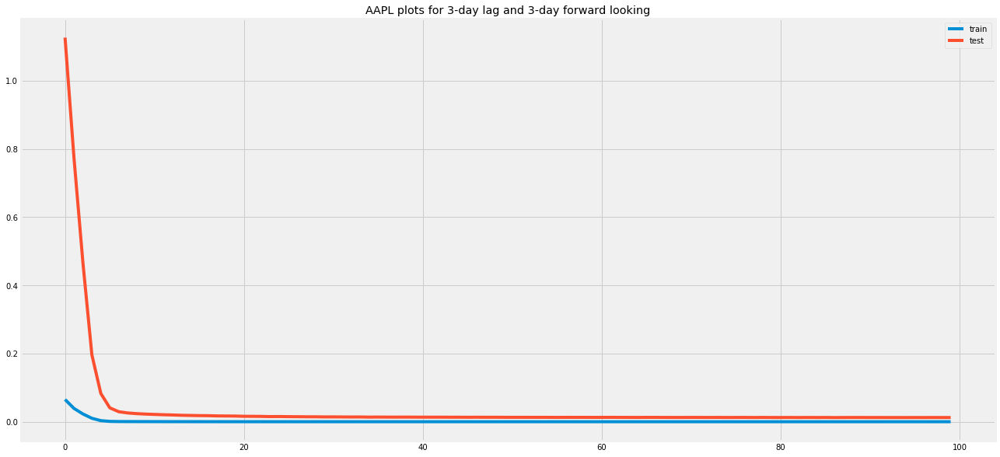

Test RMSE: 6.906


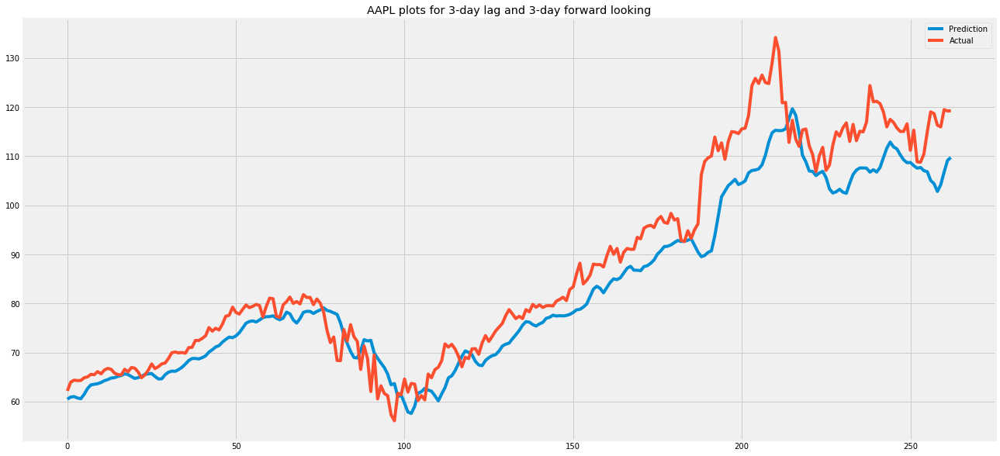

INFO:tensorflow:Assets written to: Stock-Prediction-models/AAPL_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


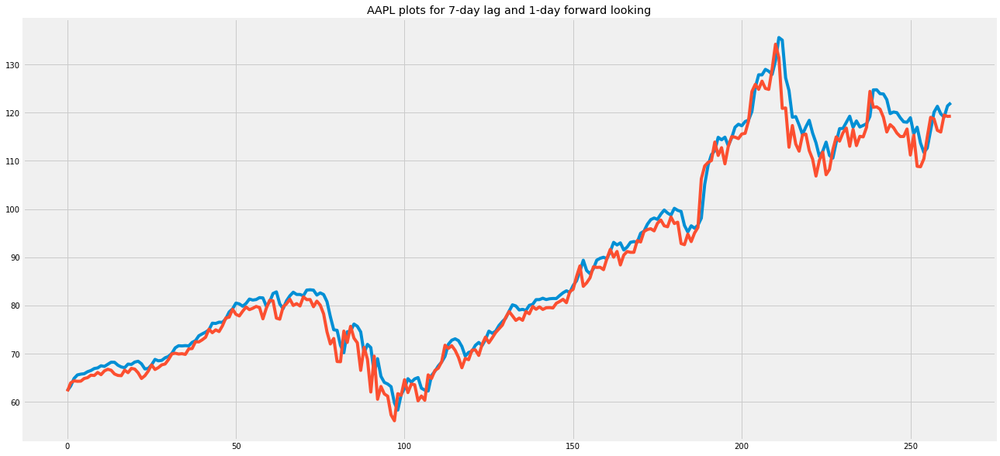

INFO:tensorflow:Assets written to: Stock-Prediction-models/AAPL_model_gr_7day_lag_1day_forward/assets
Starting process for: AMZN
Starting process for: 3-days lag and 5-days forward prediction


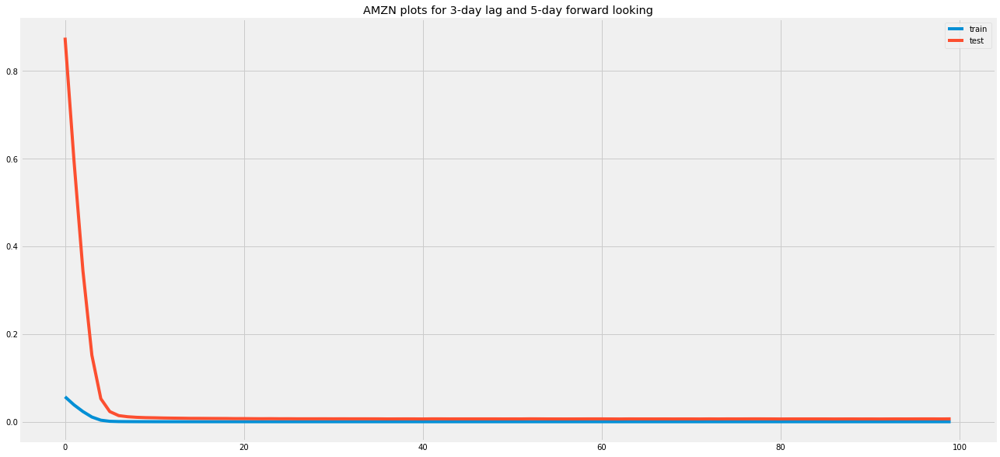

Test RMSE: 166.115


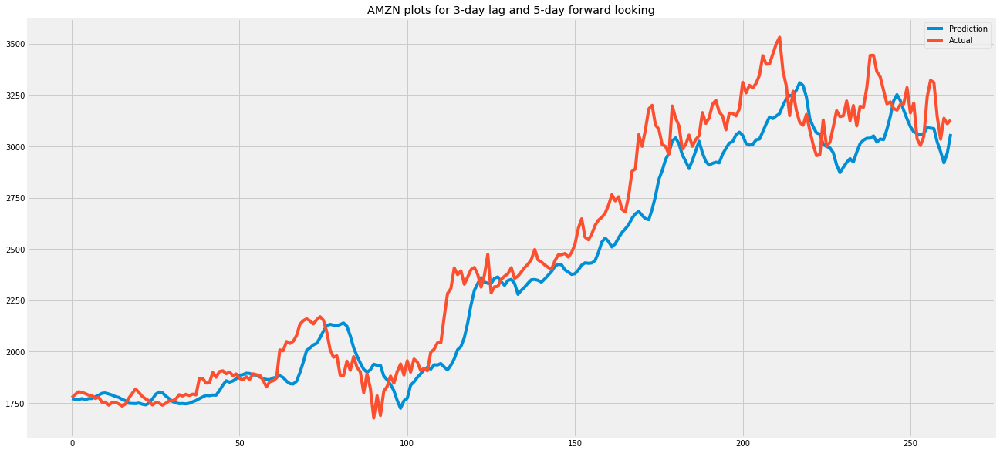

INFO:tensorflow:Assets written to: Stock-Prediction-models/AMZN_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


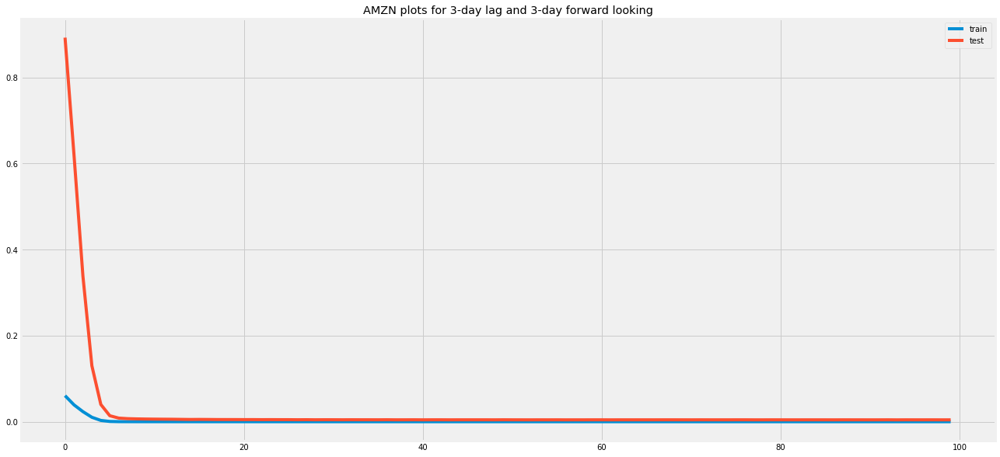

Test RMSE: 136.162


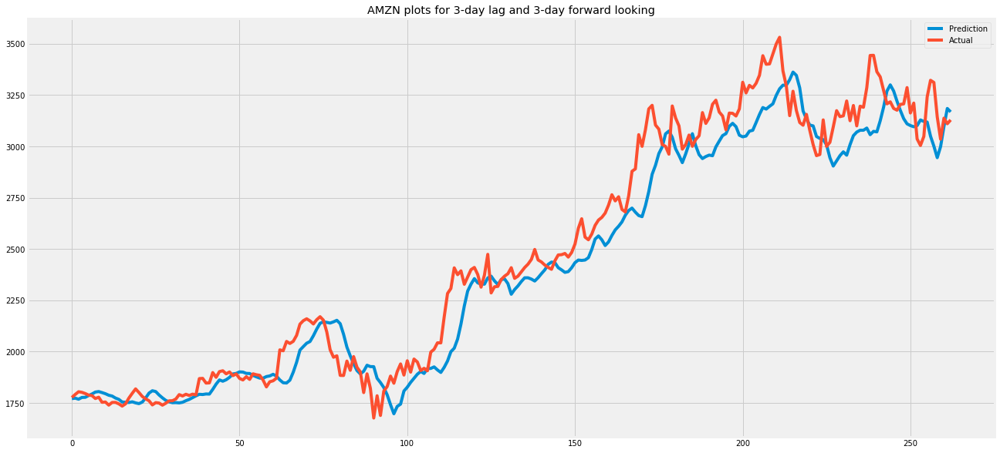

INFO:tensorflow:Assets written to: Stock-Prediction-models/AMZN_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


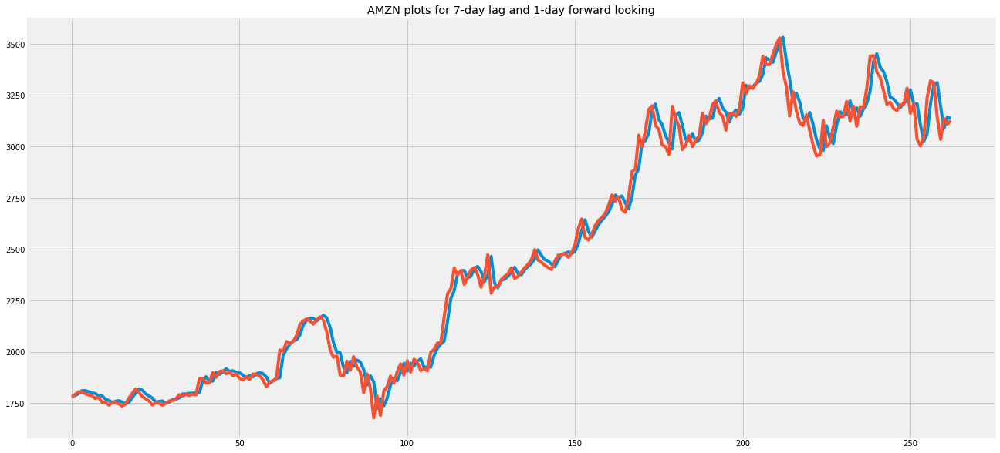

INFO:tensorflow:Assets written to: Stock-Prediction-models/AMZN_model_gr_7day_lag_1day_forward/assets
Starting process for: MSFT
Starting process for: 3-days lag and 5-days forward prediction


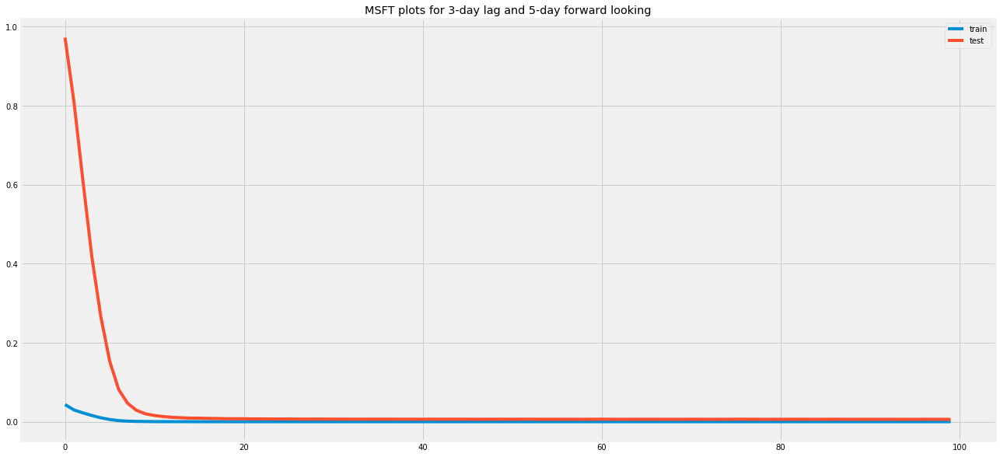

Test RMSE: 10.133


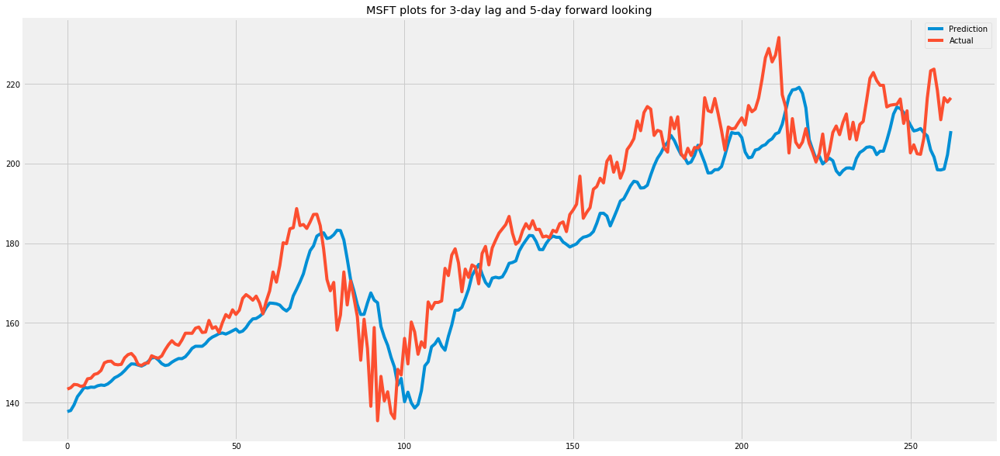

INFO:tensorflow:Assets written to: Stock-Prediction-models/MSFT_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


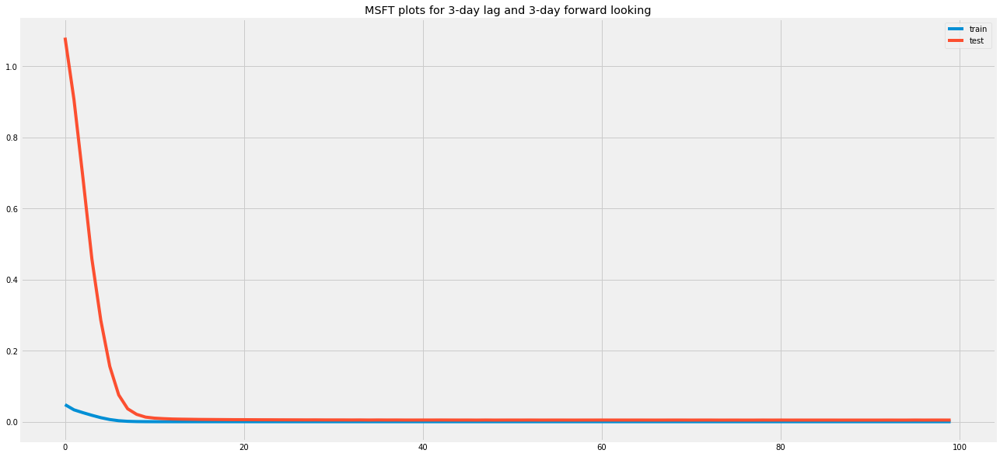

Test RMSE: 8.943


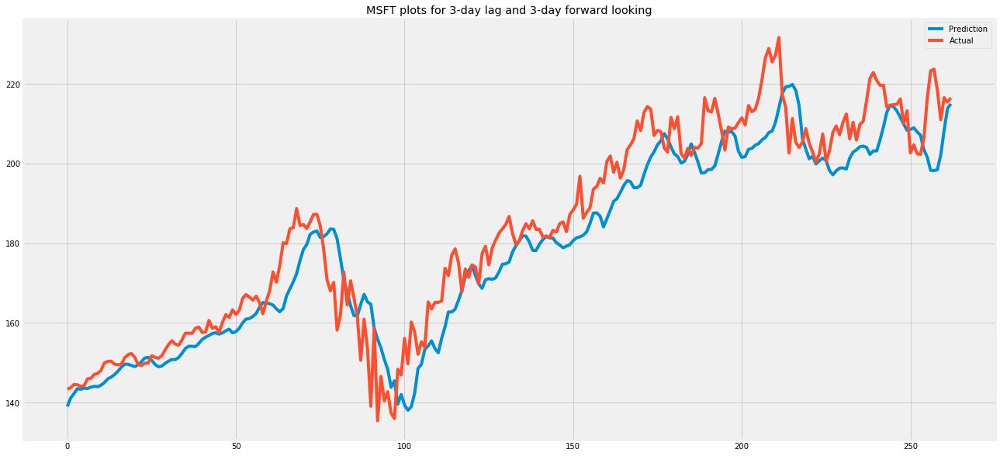

INFO:tensorflow:Assets written to: Stock-Prediction-models/MSFT_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


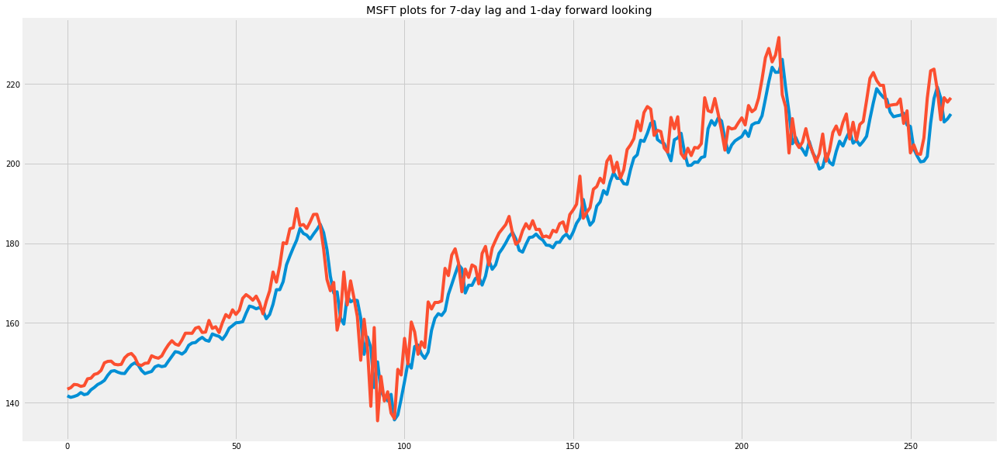

INFO:tensorflow:Assets written to: Stock-Prediction-models/MSFT_model_gr_7day_lag_1day_forward/assets
Starting process for: GOOGL
Starting process for: 3-days lag and 5-days forward prediction


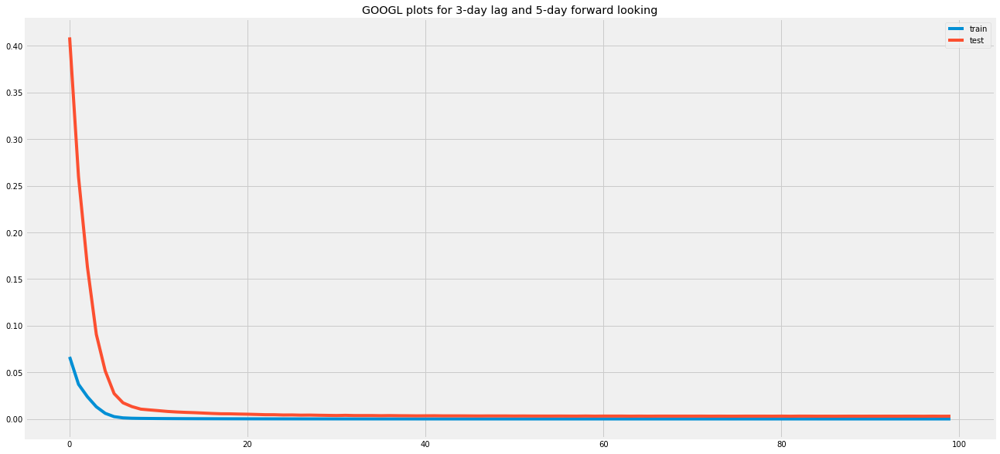

Test RMSE: 80.049


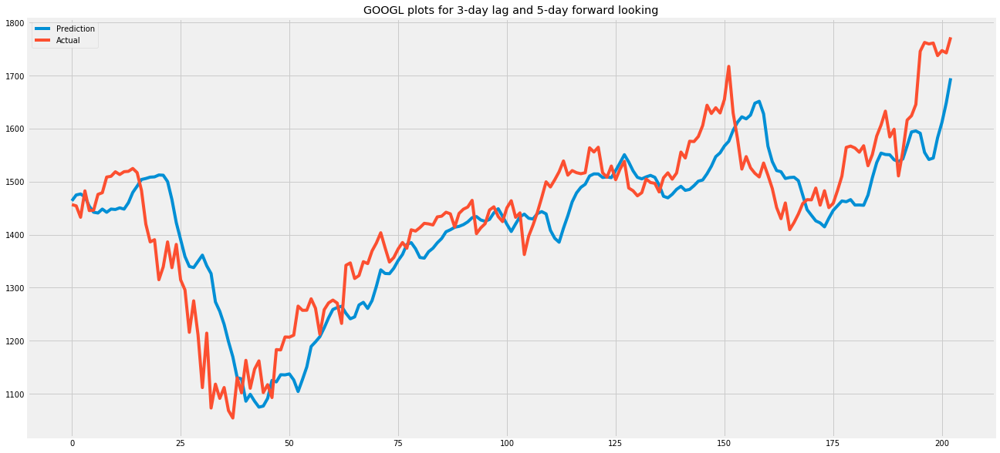

INFO:tensorflow:Assets written to: Stock-Prediction-models/GOOGL_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


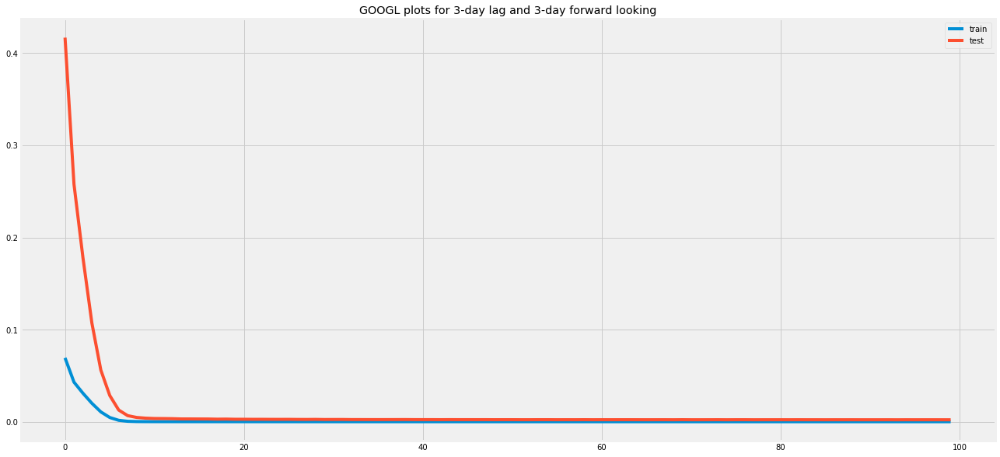

Test RMSE: 67.547


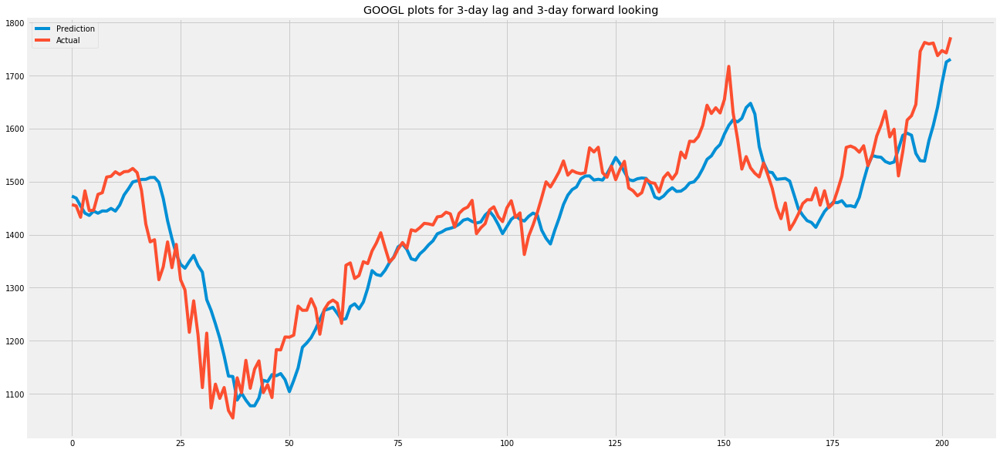

INFO:tensorflow:Assets written to: Stock-Prediction-models/GOOGL_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


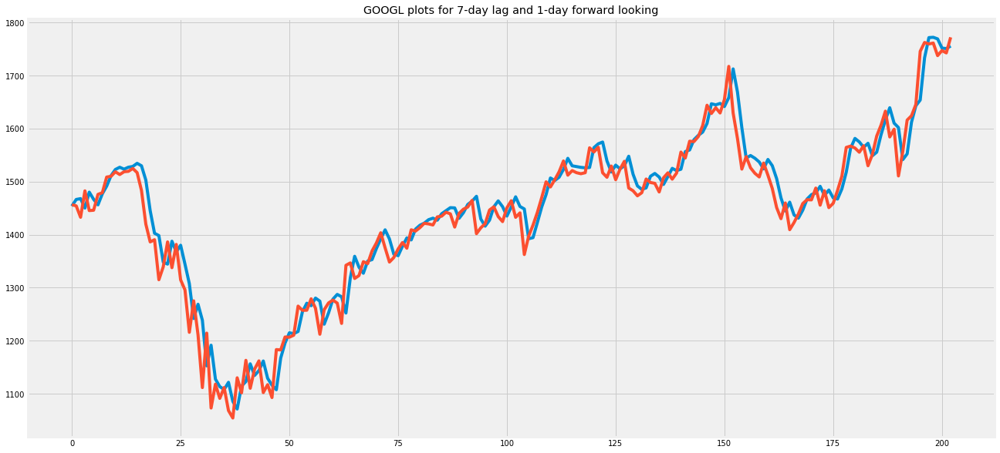

INFO:tensorflow:Assets written to: Stock-Prediction-models/GOOGL_model_gr_7day_lag_1day_forward/assets
Starting process for: FB
Starting process for: 3-days lag and 5-days forward prediction


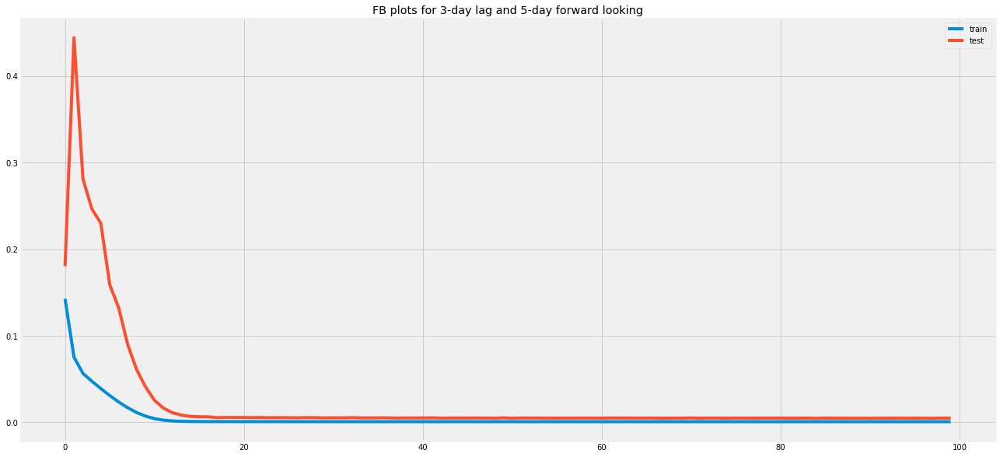

Test RMSE: 15.573


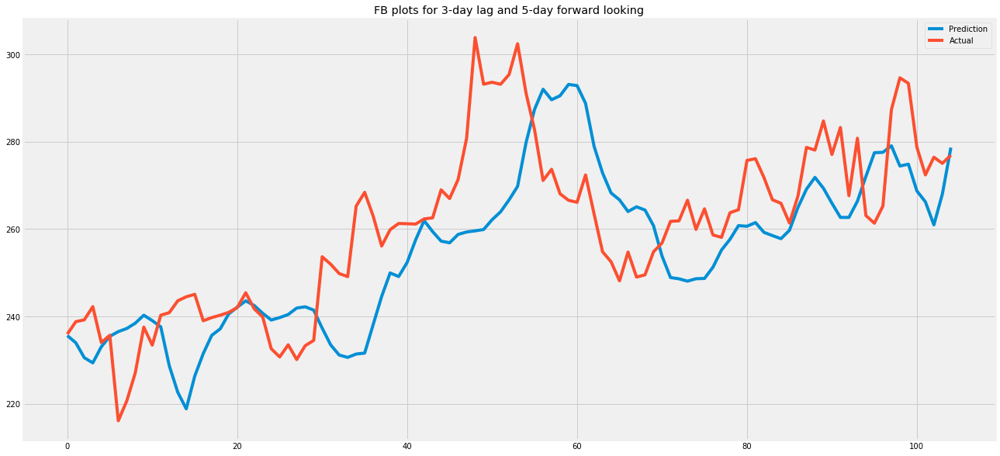

INFO:tensorflow:Assets written to: Stock-Prediction-models/FB_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


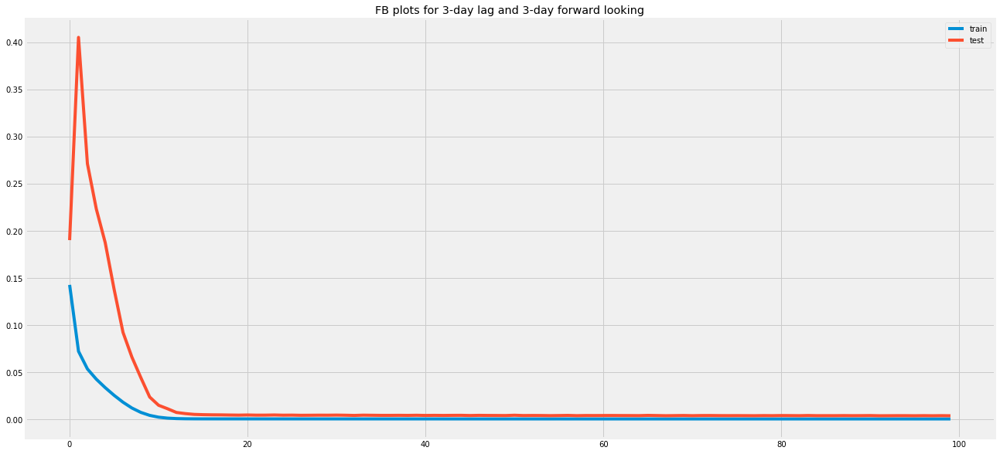

Test RMSE: 13.903


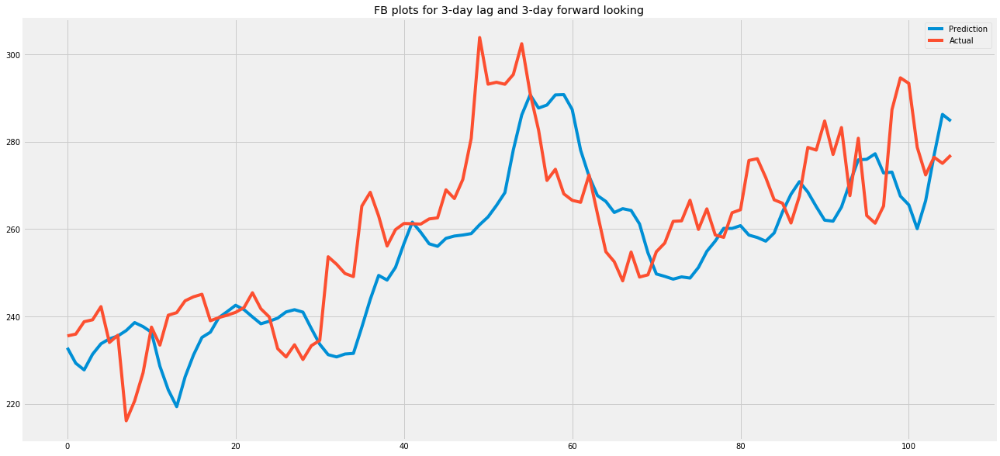

INFO:tensorflow:Assets written to: Stock-Prediction-models/FB_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


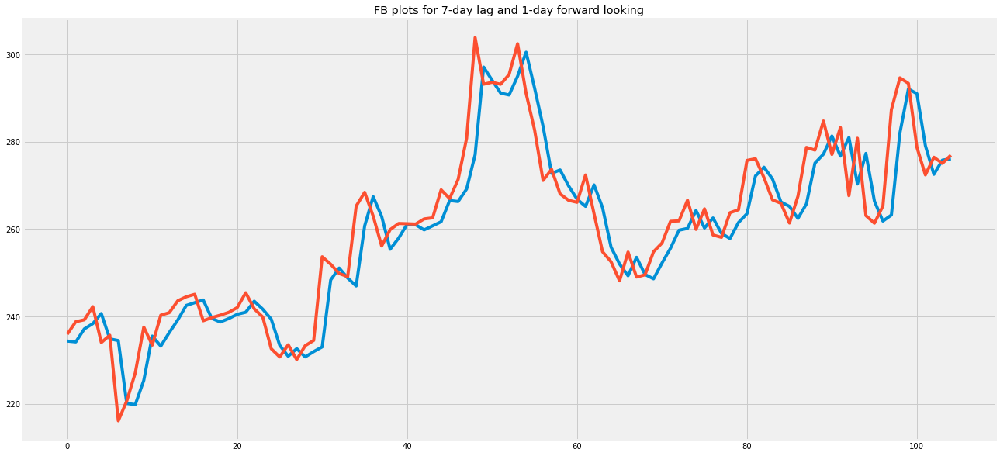

INFO:tensorflow:Assets written to: Stock-Prediction-models/FB_model_gr_7day_lag_1day_forward/assets
Starting process for: V
Starting process for: 3-days lag and 5-days forward prediction


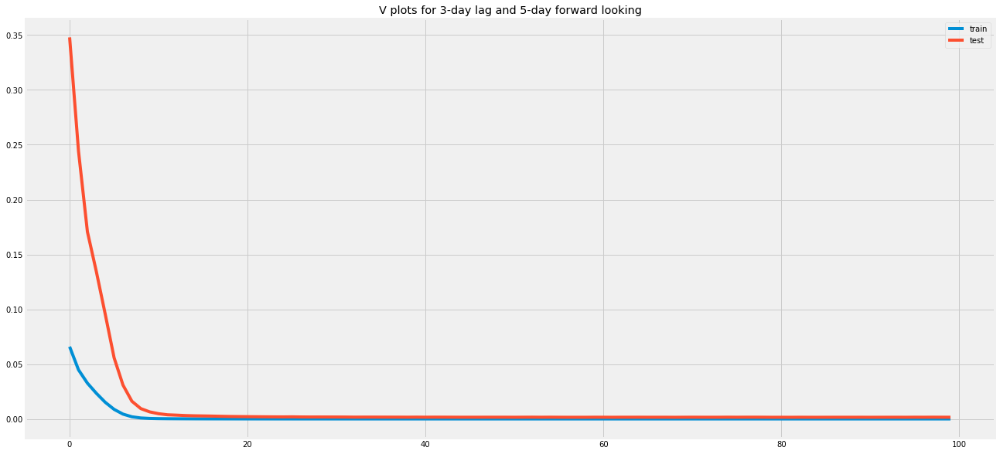

Test RMSE: 8.516


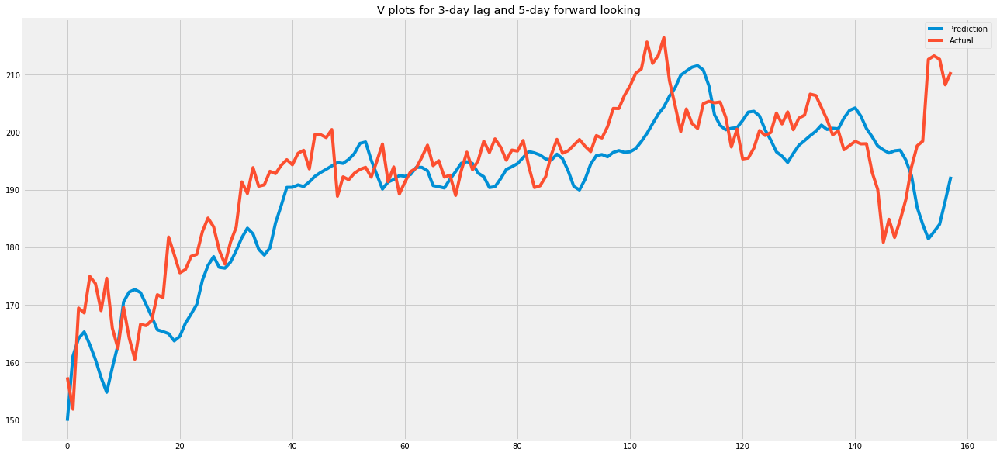

INFO:tensorflow:Assets written to: Stock-Prediction-models/V_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


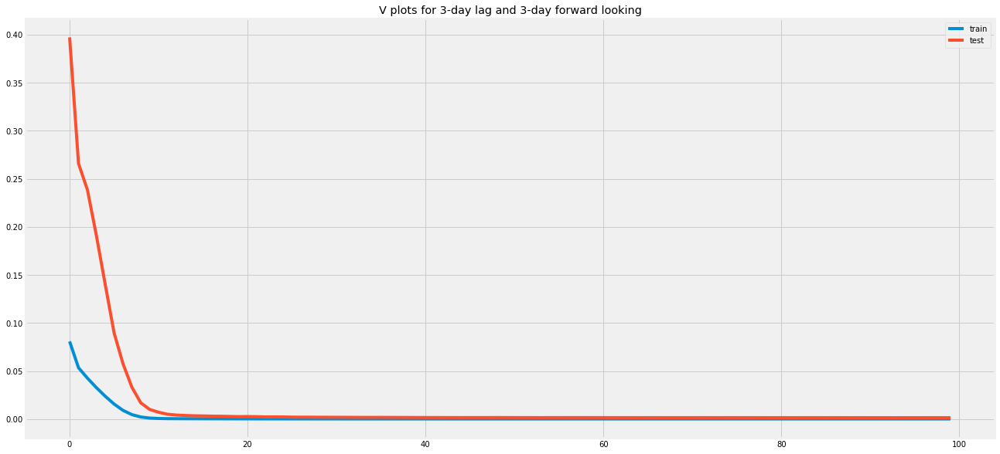

Test RMSE: 7.671


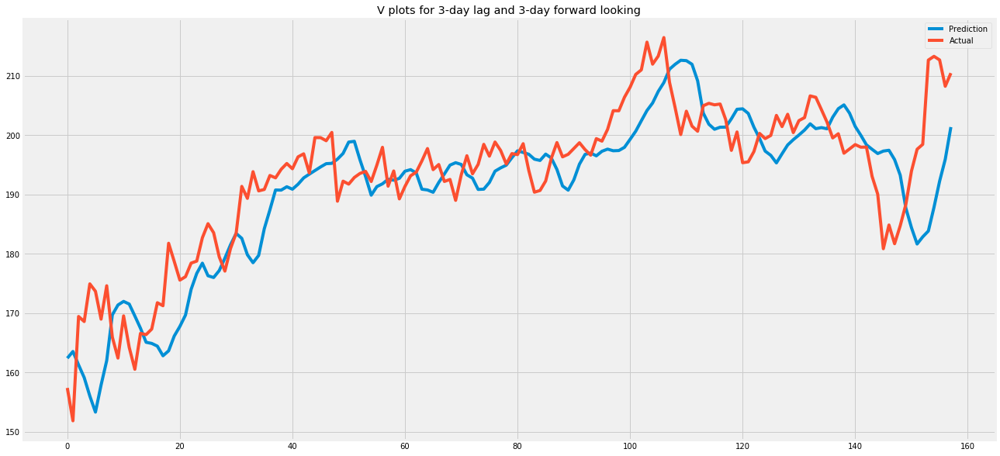

INFO:tensorflow:Assets written to: Stock-Prediction-models/V_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


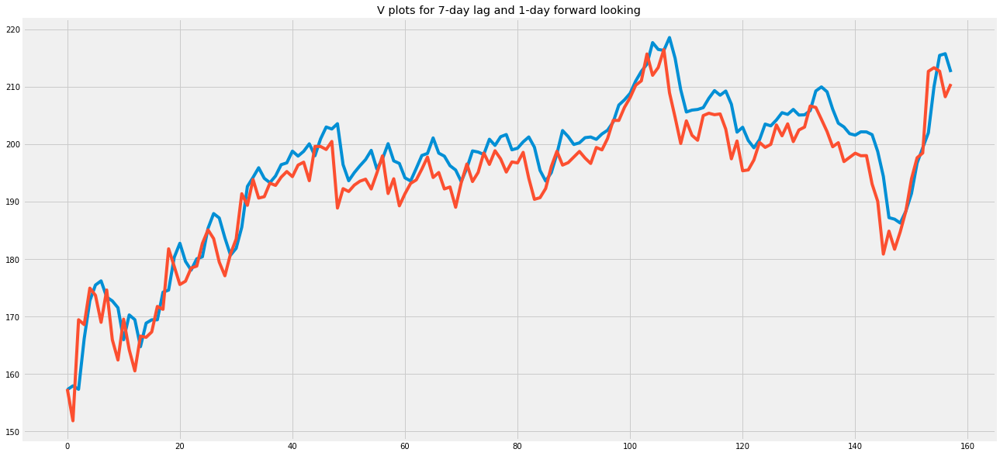

INFO:tensorflow:Assets written to: Stock-Prediction-models/V_model_gr_7day_lag_1day_forward/assets
Starting process for: WMT
Starting process for: 3-days lag and 5-days forward prediction


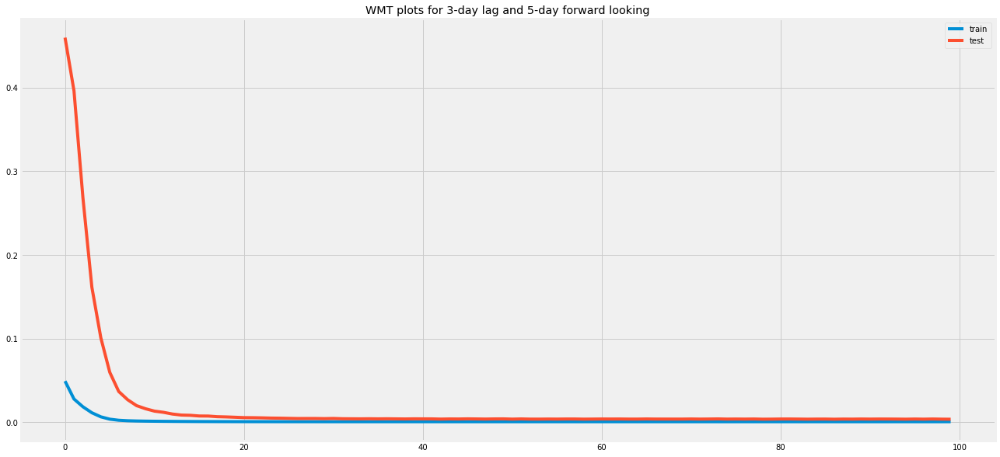

Test RMSE: 4.720


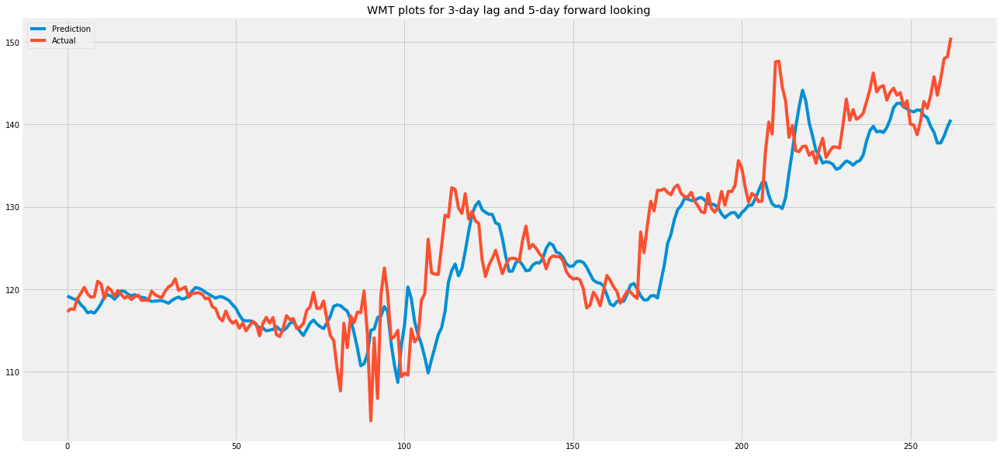

INFO:tensorflow:Assets written to: Stock-Prediction-models/WMT_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


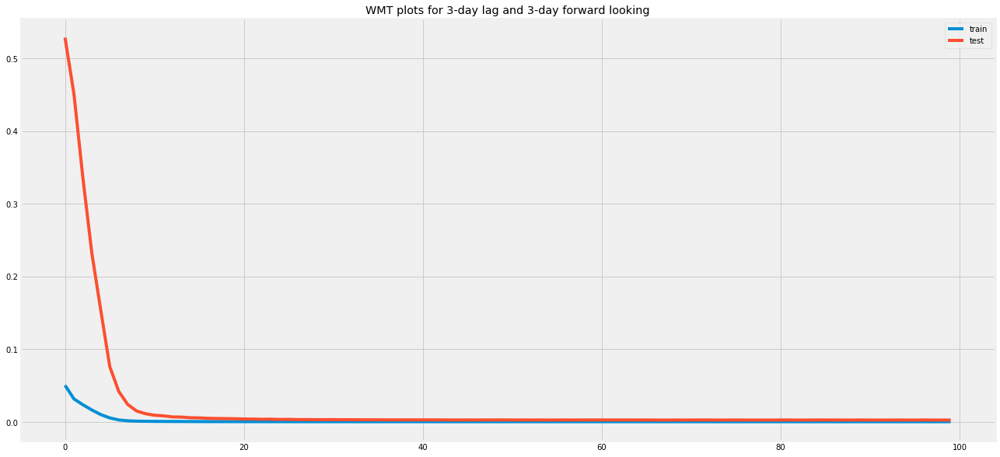

Test RMSE: 4.147


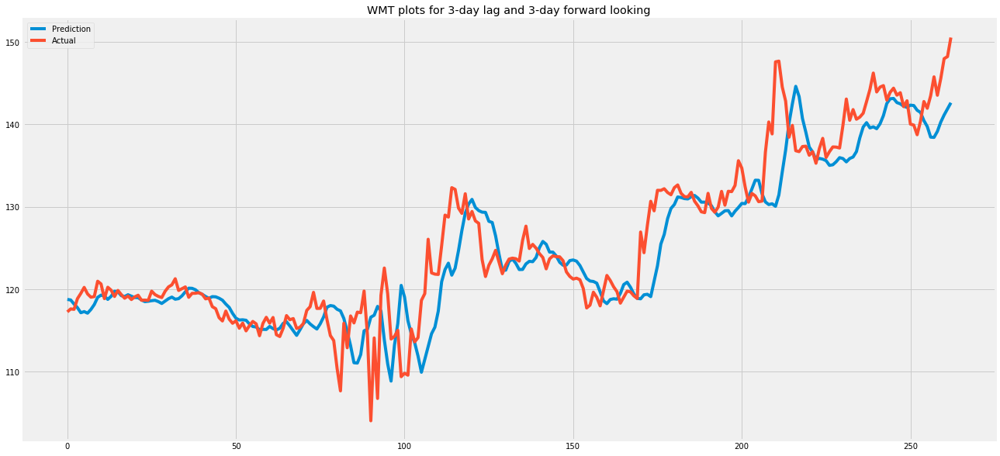

INFO:tensorflow:Assets written to: Stock-Prediction-models/WMT_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


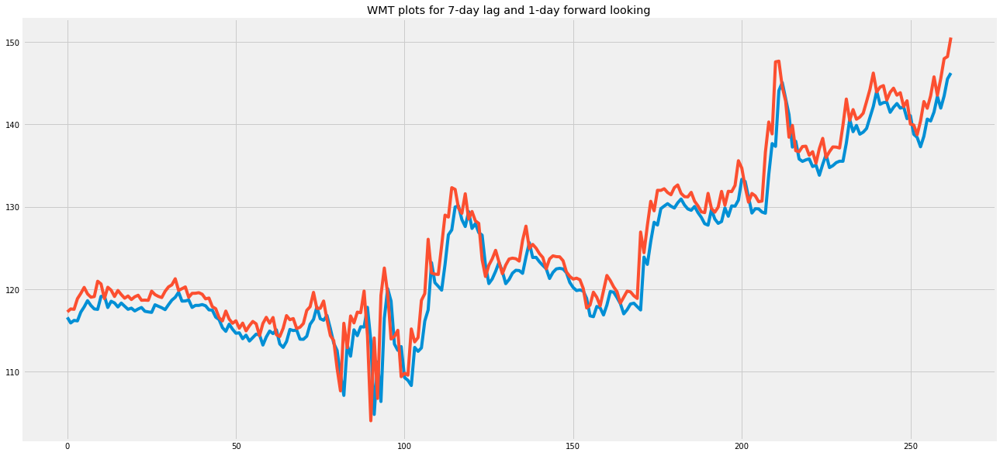

INFO:tensorflow:Assets written to: Stock-Prediction-models/WMT_model_gr_7day_lag_1day_forward/assets
Starting process for: JNJ
Starting process for: 3-days lag and 5-days forward prediction


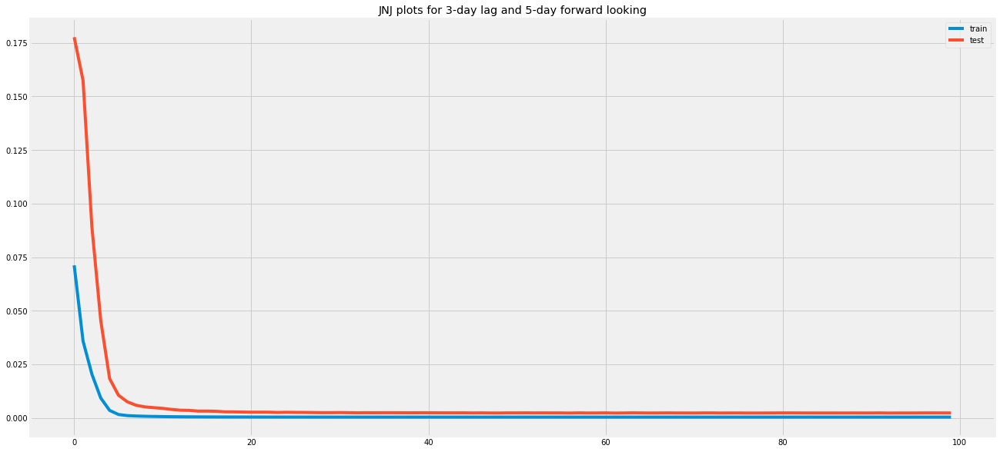

Test RMSE: 5.443


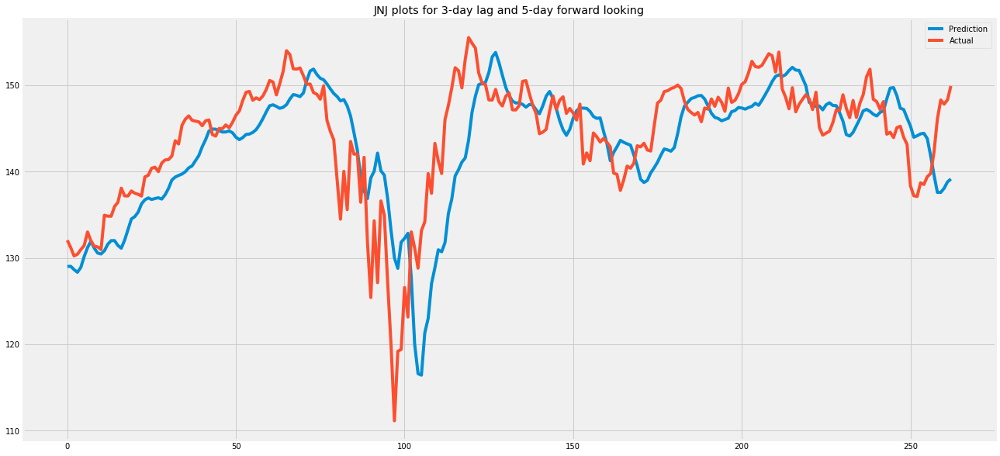

INFO:tensorflow:Assets written to: Stock-Prediction-models/JNJ_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


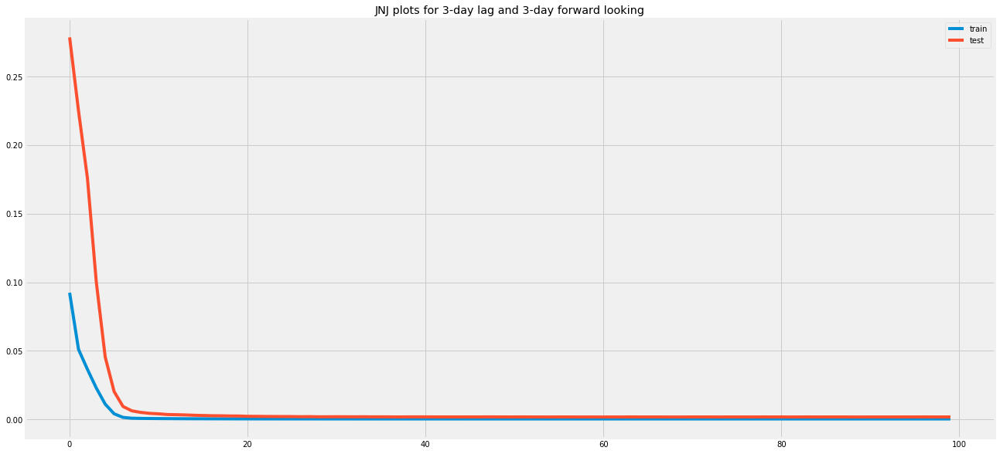

Test RMSE: 4.717


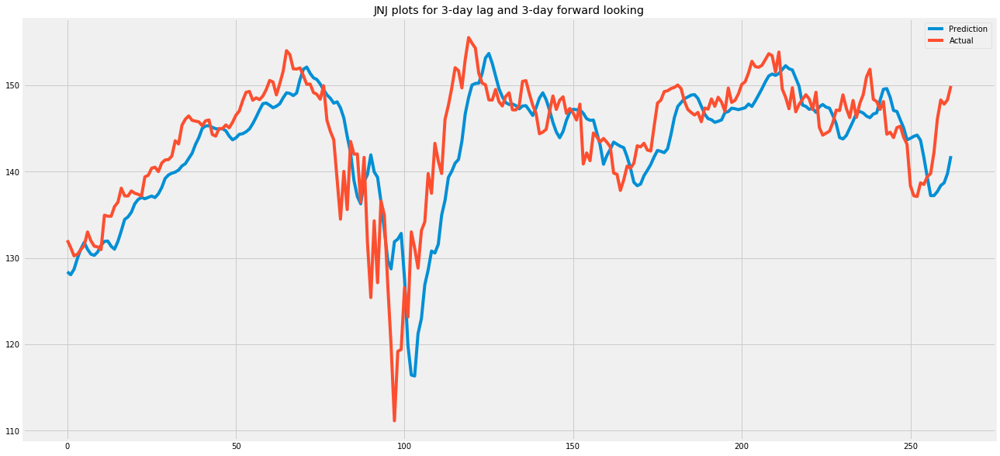

INFO:tensorflow:Assets written to: Stock-Prediction-models/JNJ_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


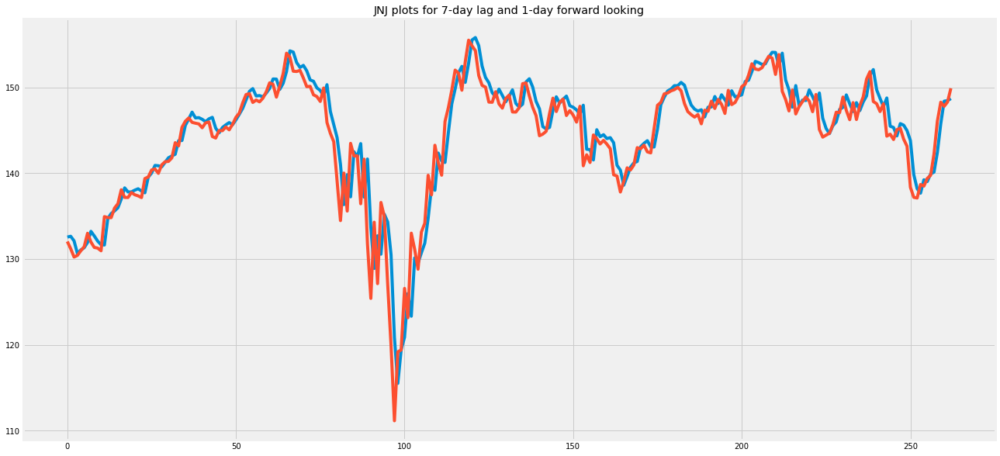

INFO:tensorflow:Assets written to: Stock-Prediction-models/JNJ_model_gr_7day_lag_1day_forward/assets
Starting process for: TSLA
Starting process for: 3-days lag and 5-days forward prediction


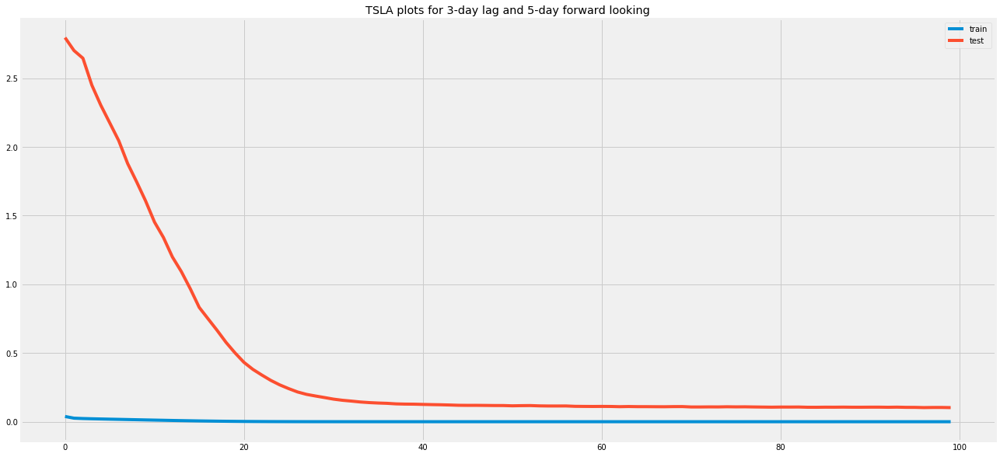

Test RMSE: 57.793


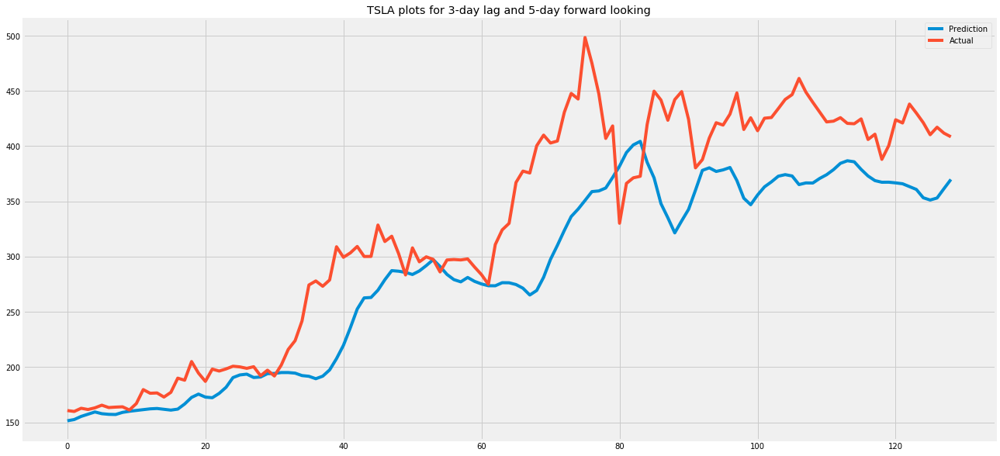

INFO:tensorflow:Assets written to: Stock-Prediction-models/TSLA_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


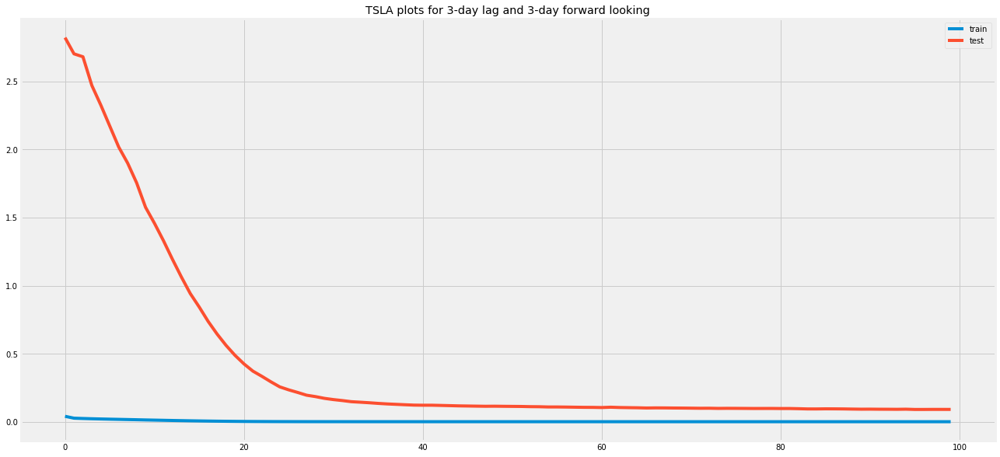

Test RMSE: 54.225


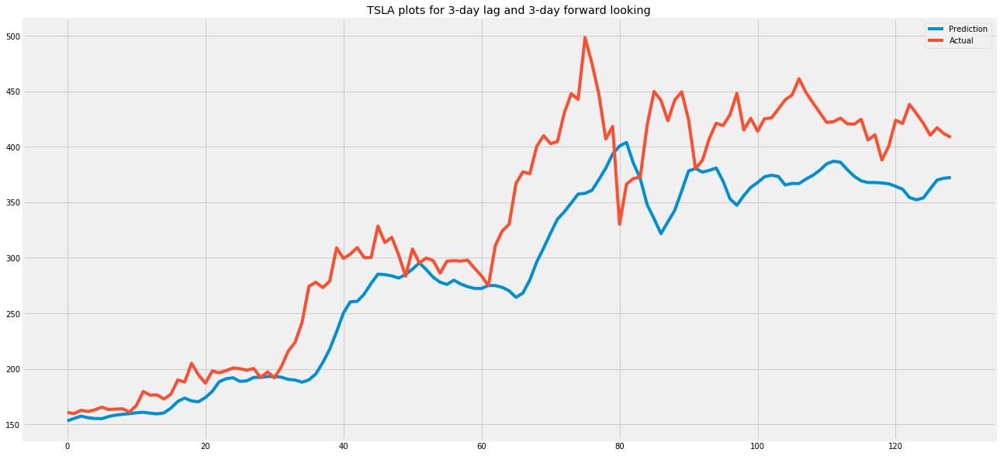

INFO:tensorflow:Assets written to: Stock-Prediction-models/TSLA_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


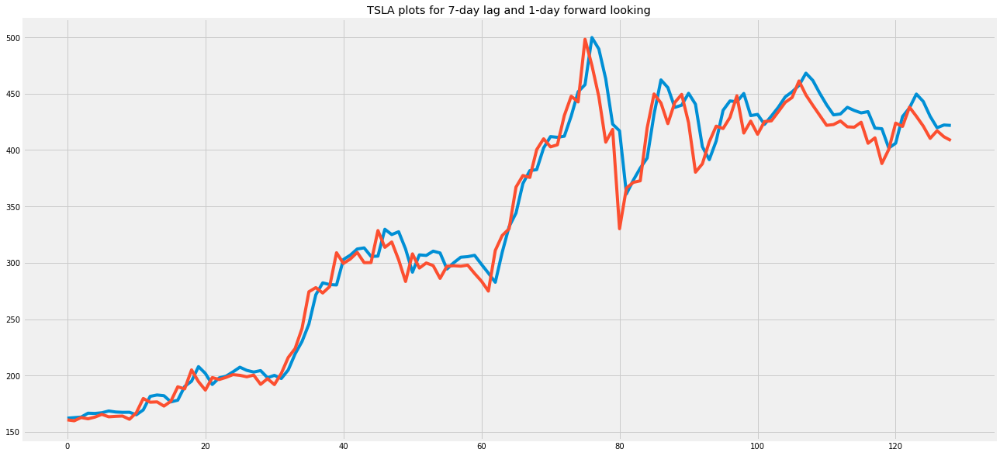

INFO:tensorflow:Assets written to: Stock-Prediction-models/TSLA_model_gr_7day_lag_1day_forward/assets
Starting process for: PG
Starting process for: 3-days lag and 5-days forward prediction


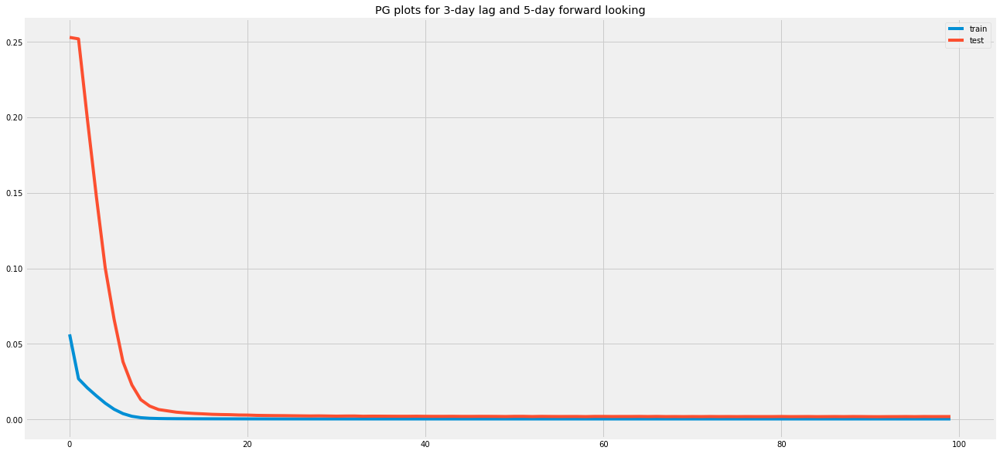

Test RMSE: 4.291


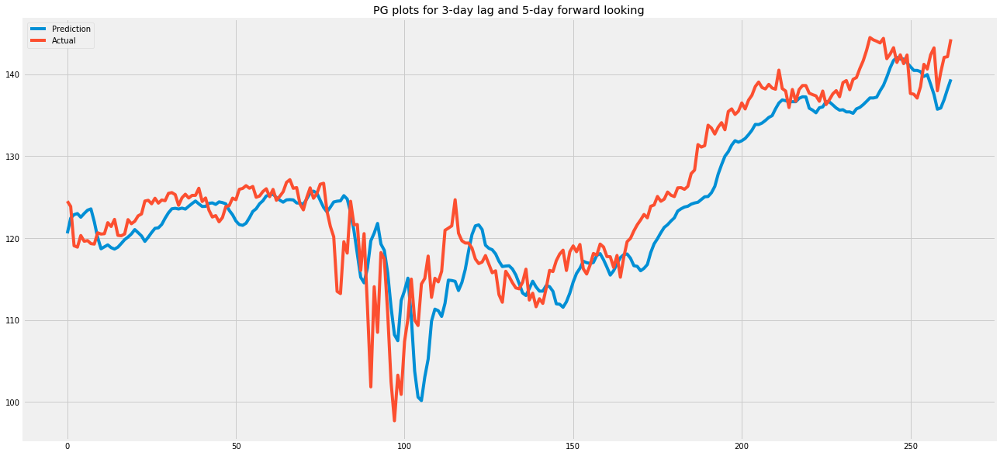

INFO:tensorflow:Assets written to: Stock-Prediction-models/PG_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


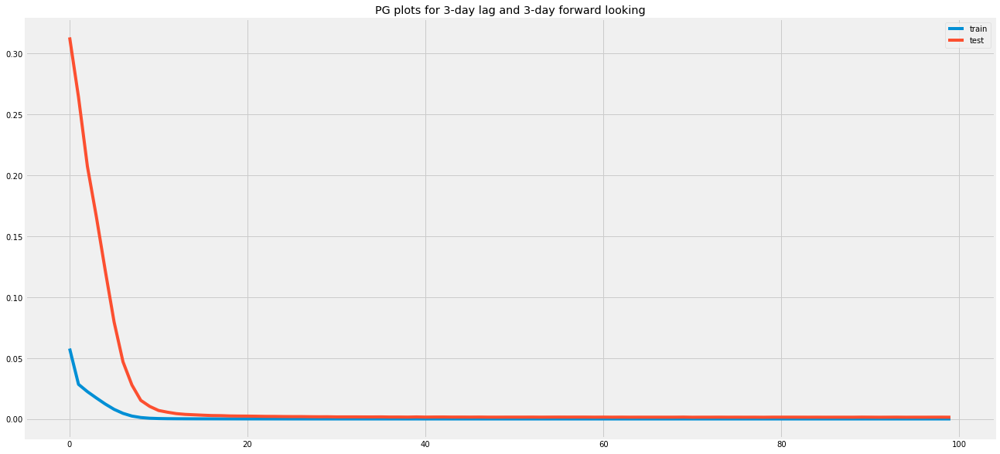

Test RMSE: 4.014


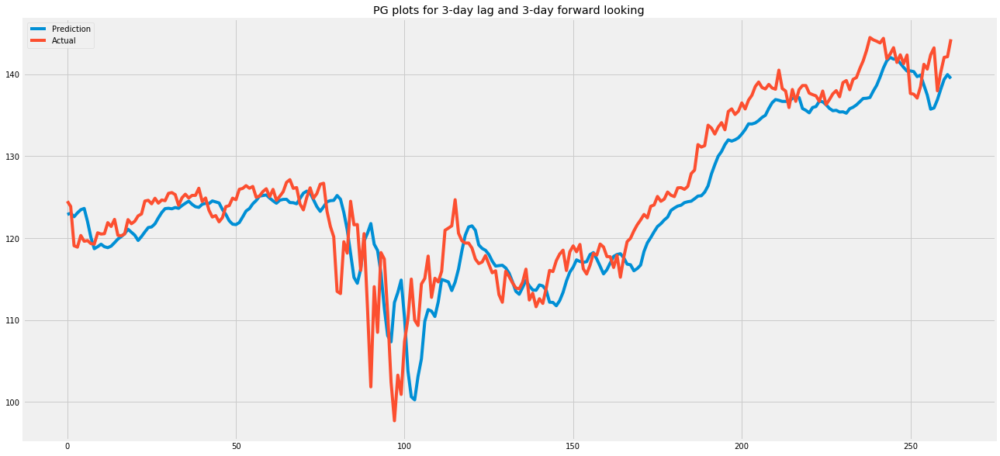

INFO:tensorflow:Assets written to: Stock-Prediction-models/PG_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


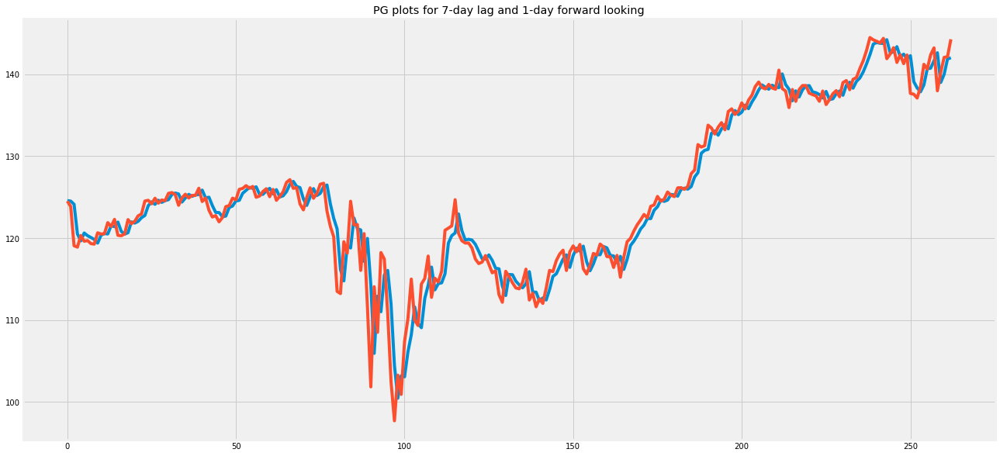

INFO:tensorflow:Assets written to: Stock-Prediction-models/PG_model_gr_7day_lag_1day_forward/assets
Starting process for: MA
Starting process for: 3-days lag and 5-days forward prediction


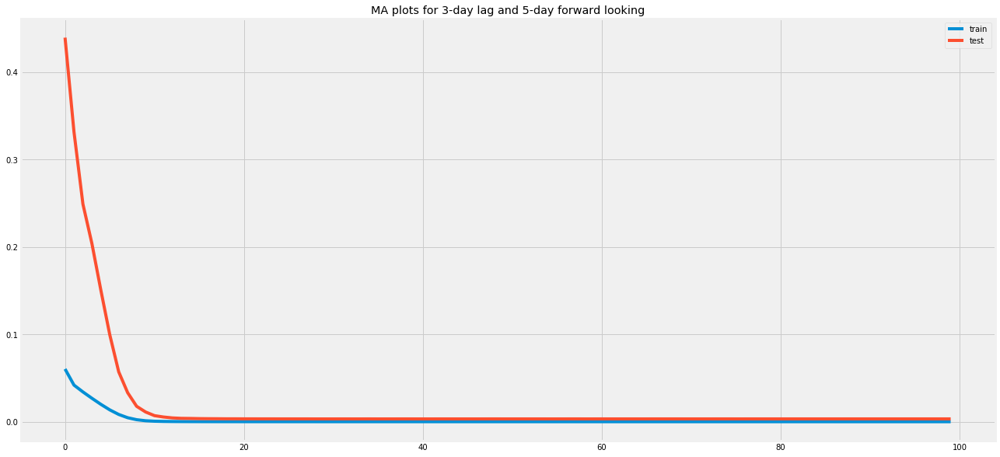

Test RMSE: 19.701


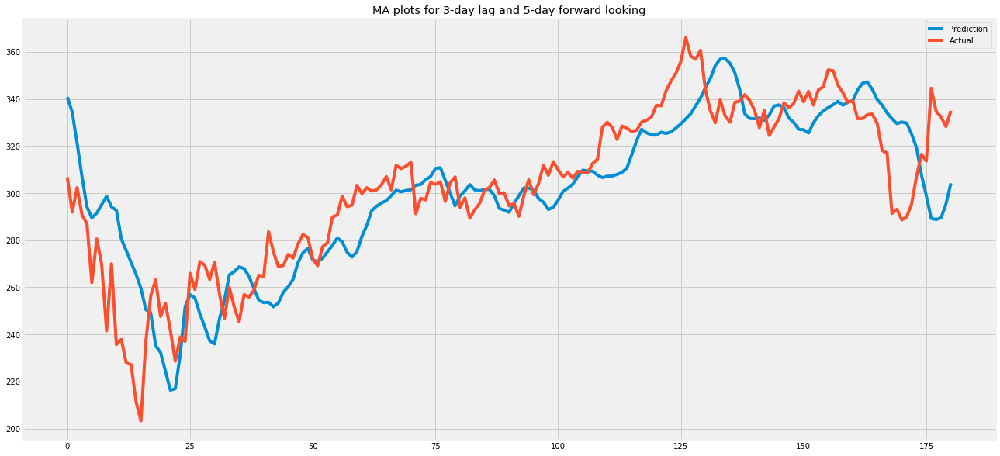

INFO:tensorflow:Assets written to: Stock-Prediction-models/MA_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


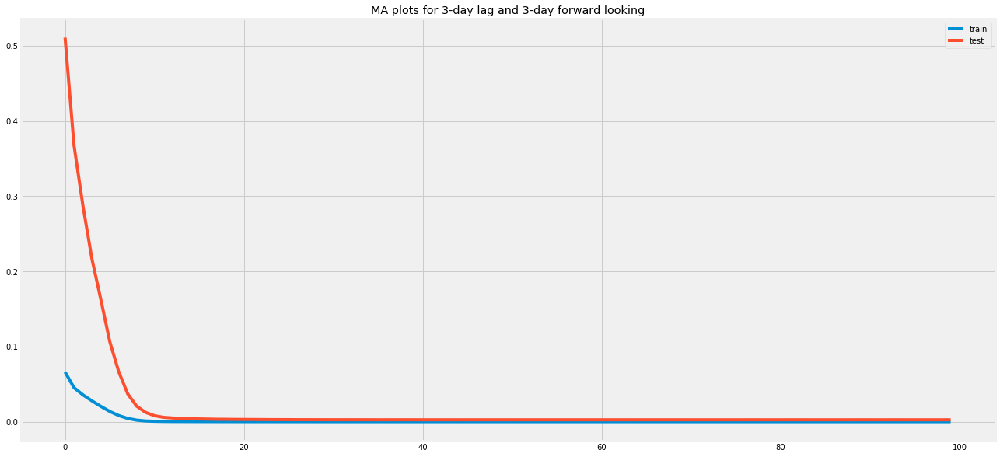

Test RMSE: 17.337


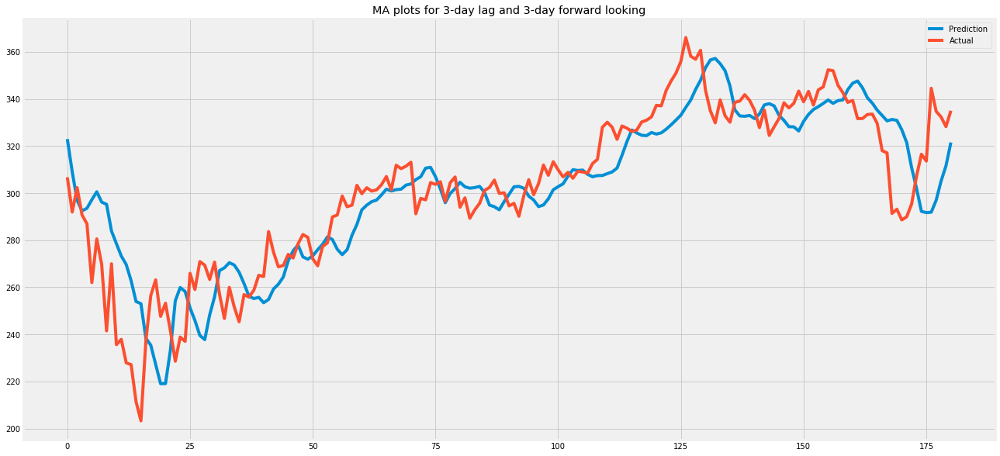

INFO:tensorflow:Assets written to: Stock-Prediction-models/MA_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


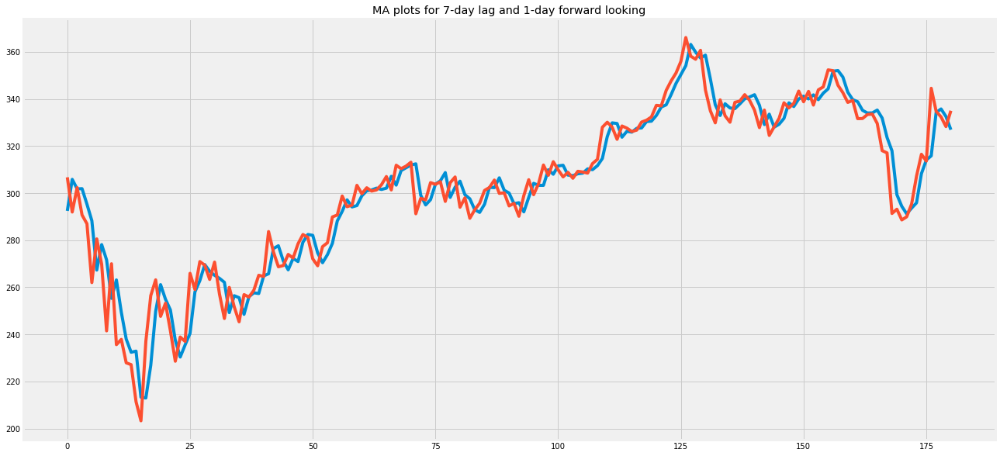

INFO:tensorflow:Assets written to: Stock-Prediction-models/MA_model_gr_7day_lag_1day_forward/assets
Starting process for: JPM
Starting process for: 3-days lag and 5-days forward prediction


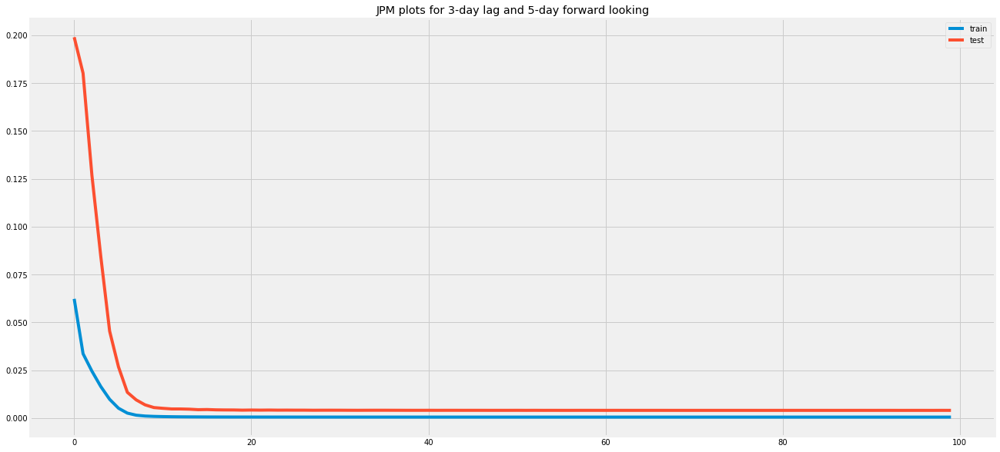

Test RMSE: 7.017


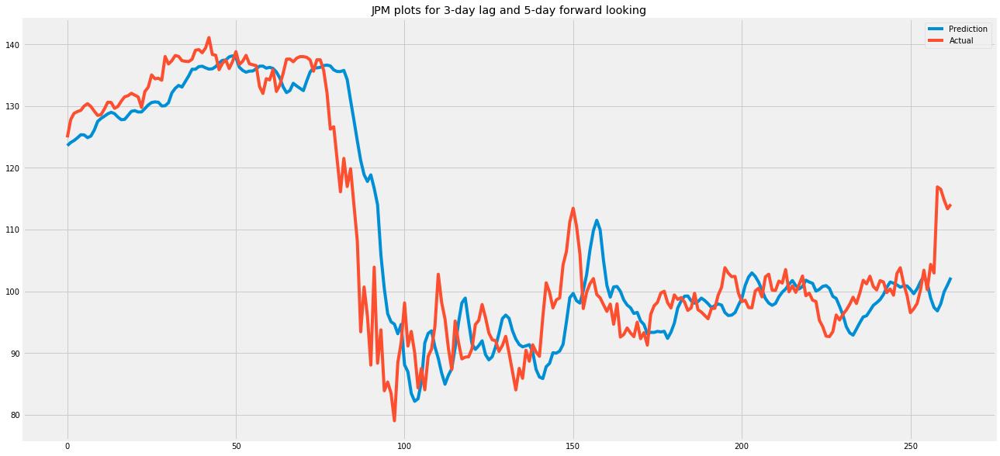

INFO:tensorflow:Assets written to: Stock-Prediction-models/JPM_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


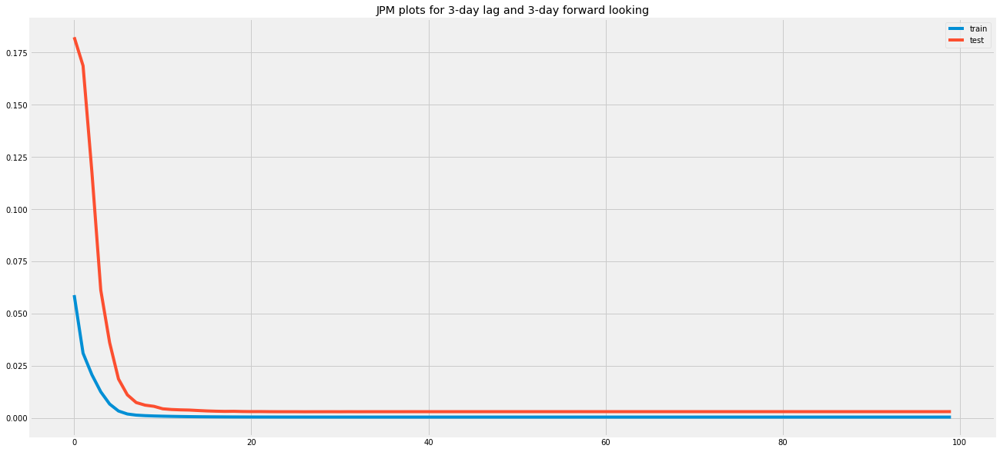

Test RMSE: 6.049


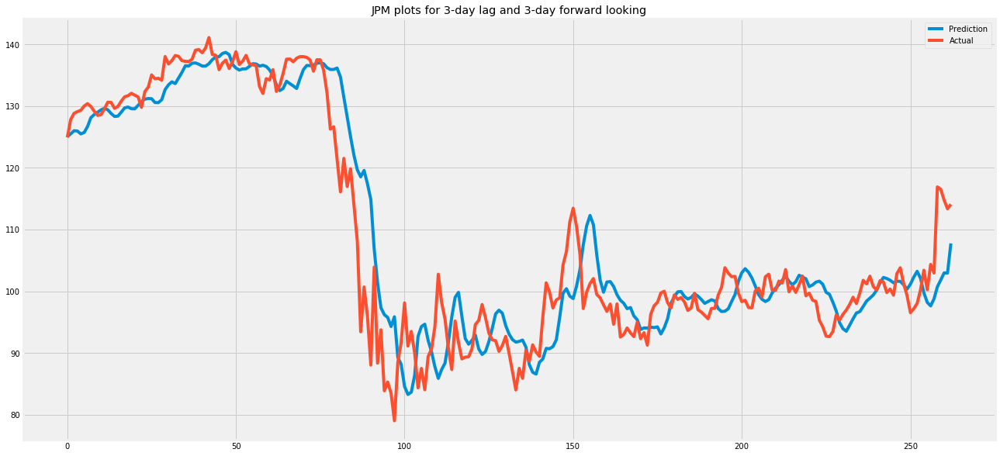

INFO:tensorflow:Assets written to: Stock-Prediction-models/JPM_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


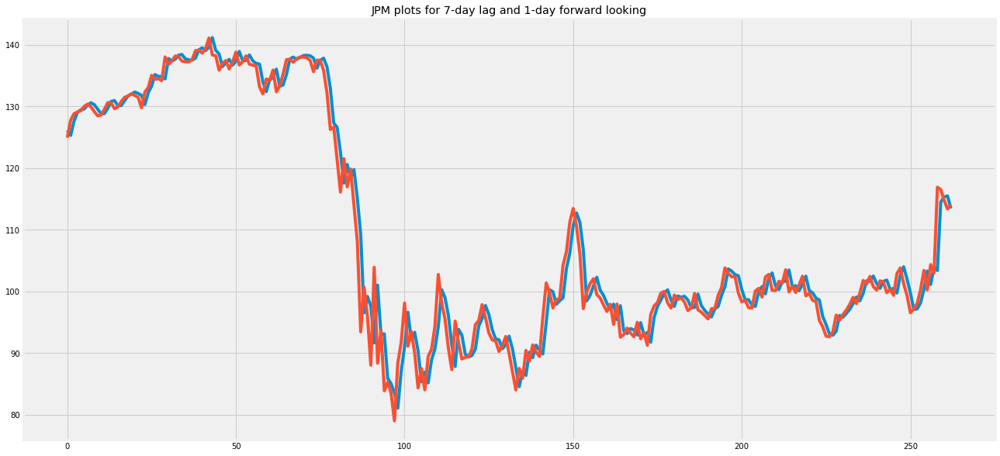

INFO:tensorflow:Assets written to: Stock-Prediction-models/JPM_model_gr_7day_lag_1day_forward/assets
Starting process for: NVDA
Starting process for: 3-days lag and 5-days forward prediction


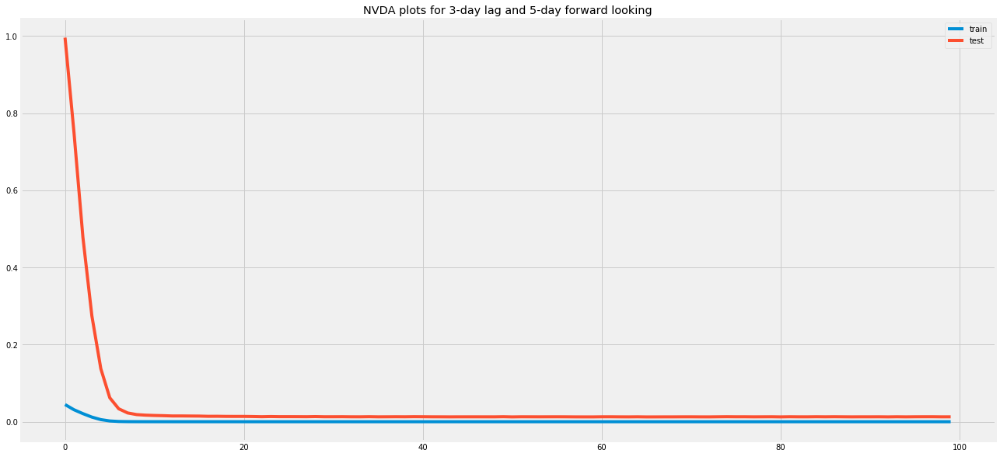

Test RMSE: 32.665


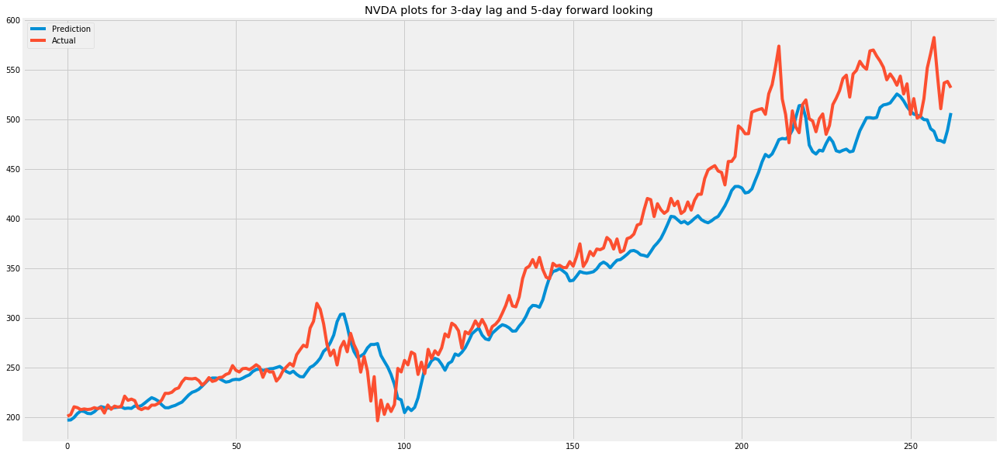

INFO:tensorflow:Assets written to: Stock-Prediction-models/NVDA_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


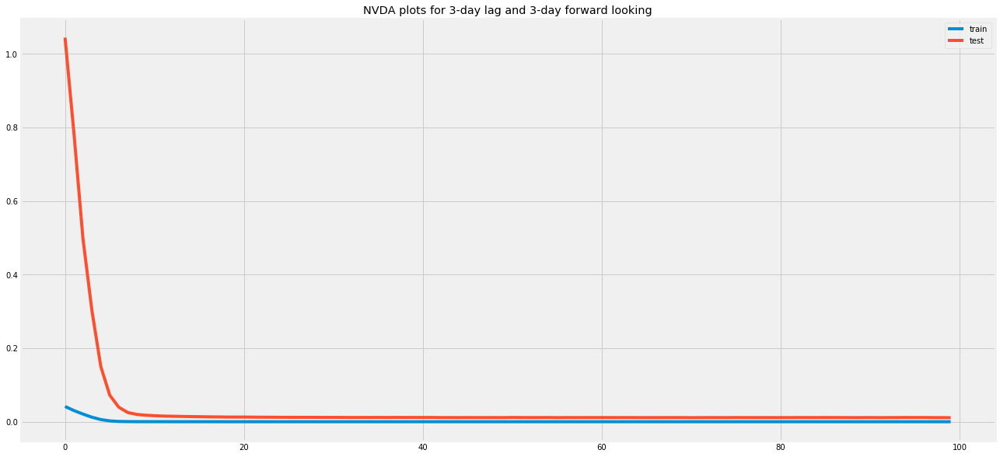

Test RMSE: 30.327


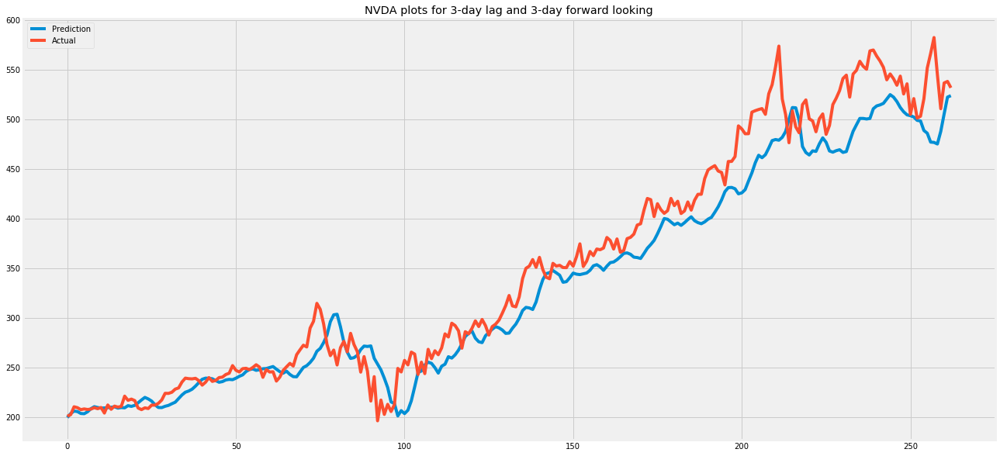

INFO:tensorflow:Assets written to: Stock-Prediction-models/NVDA_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


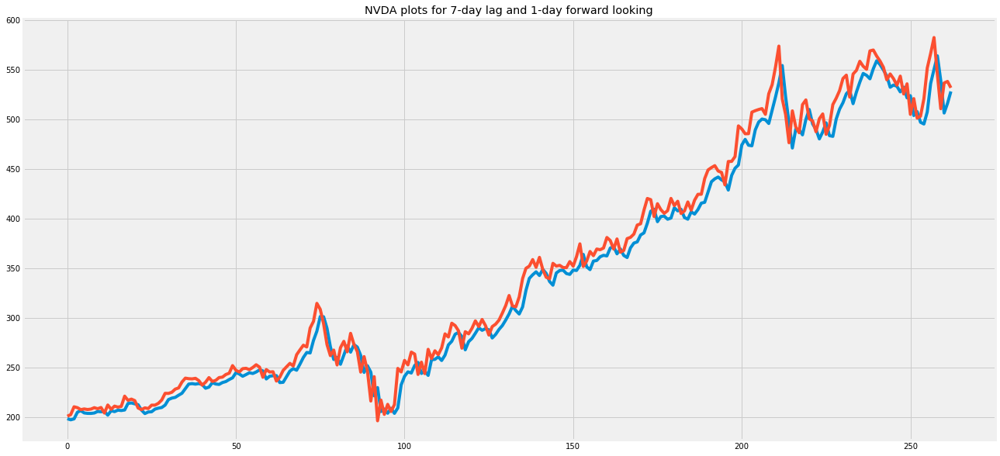

INFO:tensorflow:Assets written to: Stock-Prediction-models/NVDA_model_gr_7day_lag_1day_forward/assets
Starting process for: UNH
Starting process for: 3-days lag and 5-days forward prediction


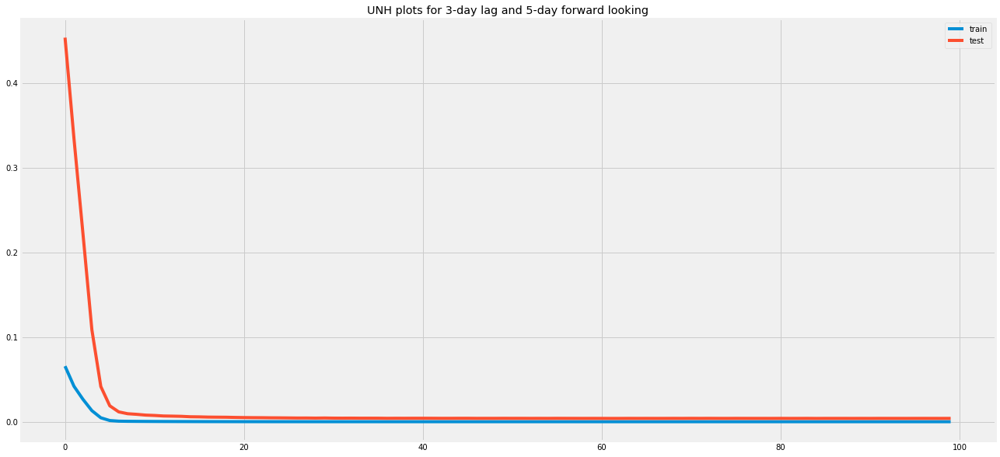

Test RMSE: 17.951


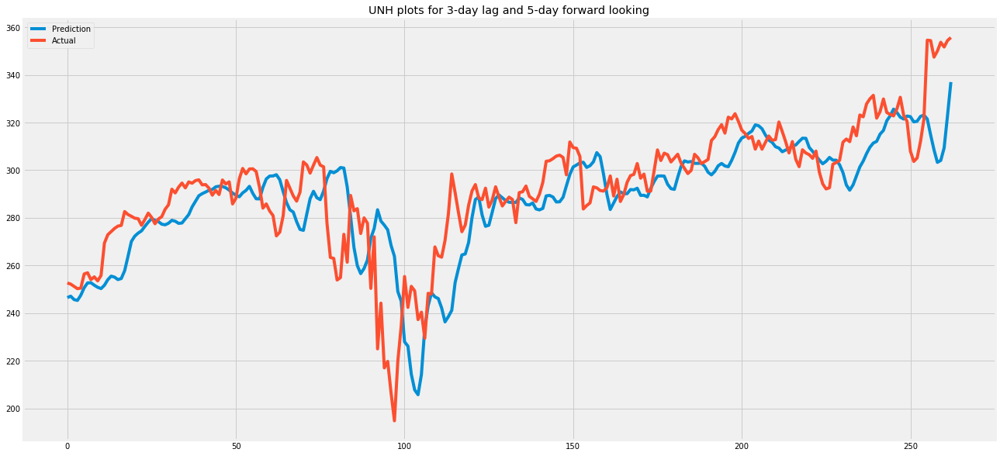

INFO:tensorflow:Assets written to: Stock-Prediction-models/UNH_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


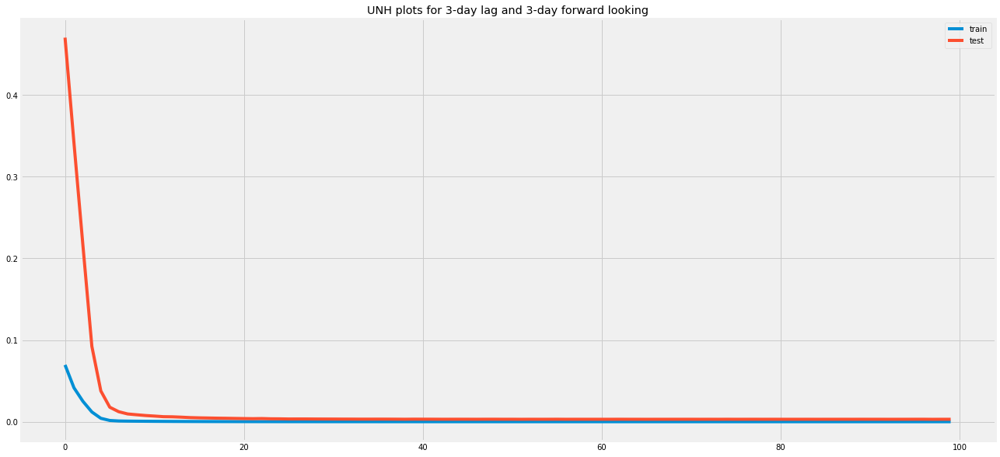

Test RMSE: 15.630


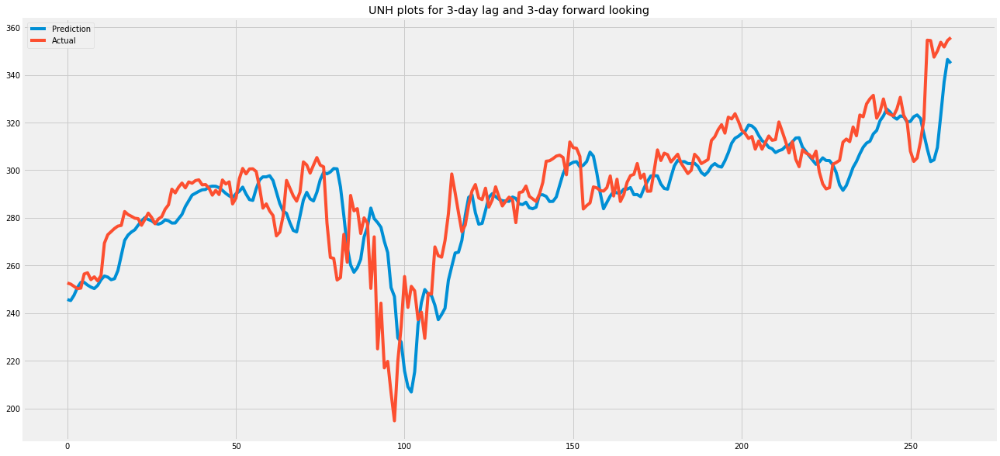

INFO:tensorflow:Assets written to: Stock-Prediction-models/UNH_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


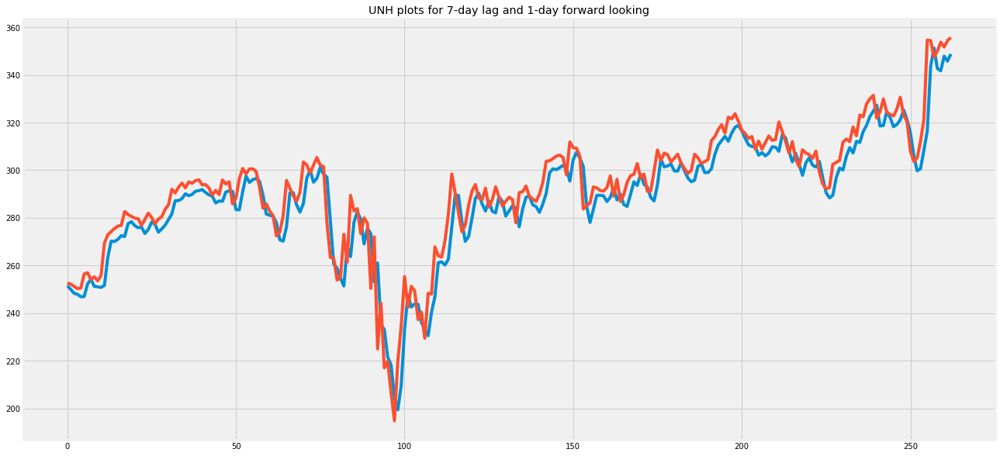

INFO:tensorflow:Assets written to: Stock-Prediction-models/UNH_model_gr_7day_lag_1day_forward/assets
Starting process for: HD
Starting process for: 3-days lag and 5-days forward prediction


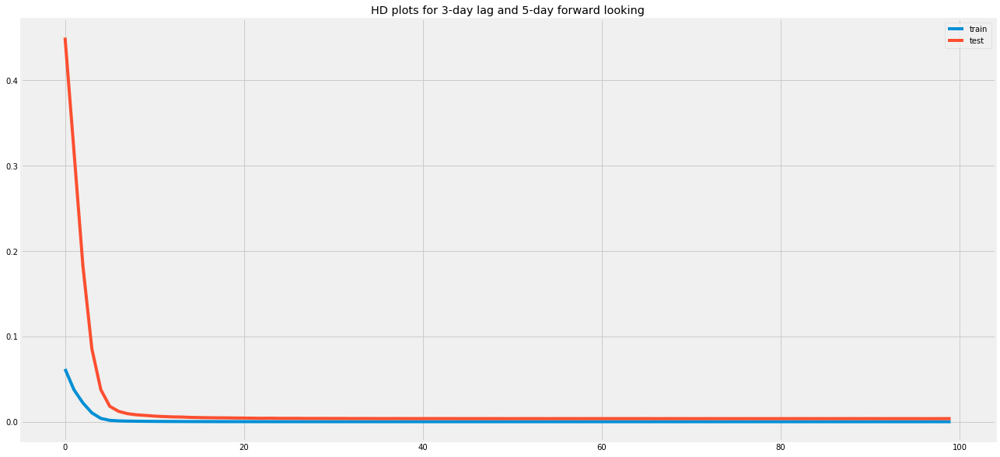

Test RMSE: 13.635


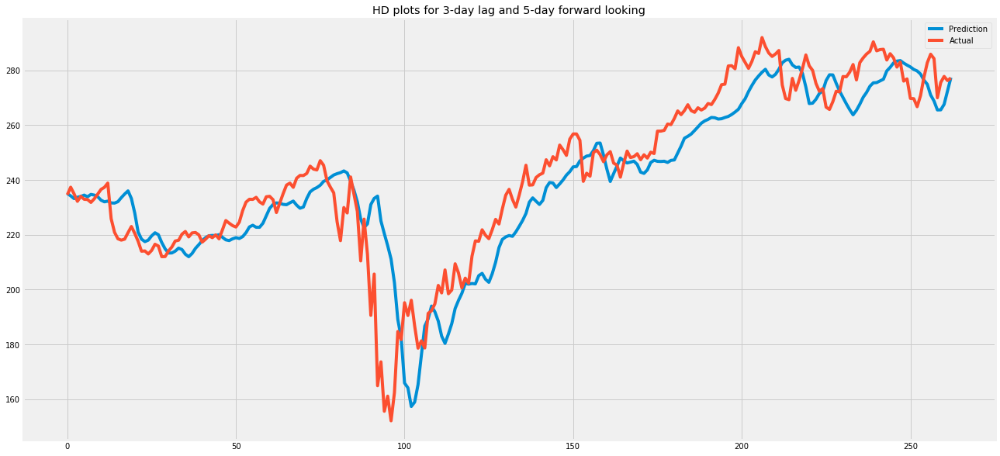

INFO:tensorflow:Assets written to: Stock-Prediction-models/HD_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


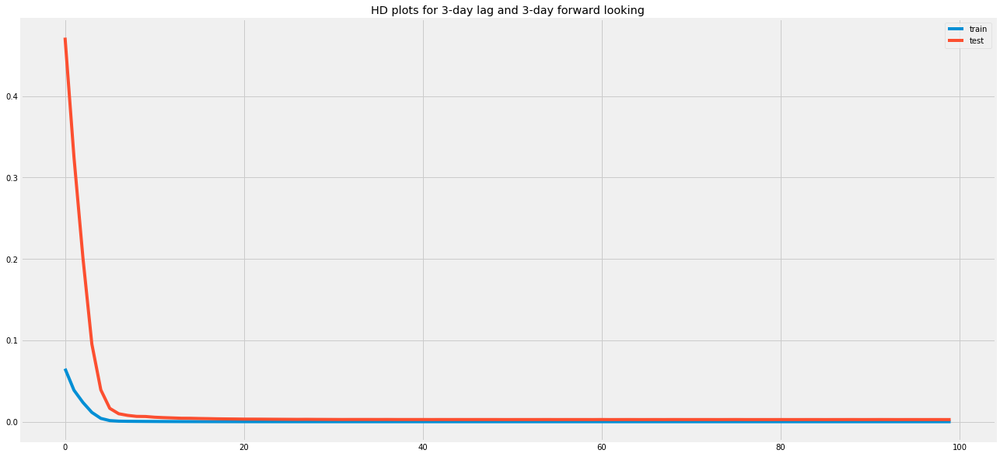

Test RMSE: 11.514


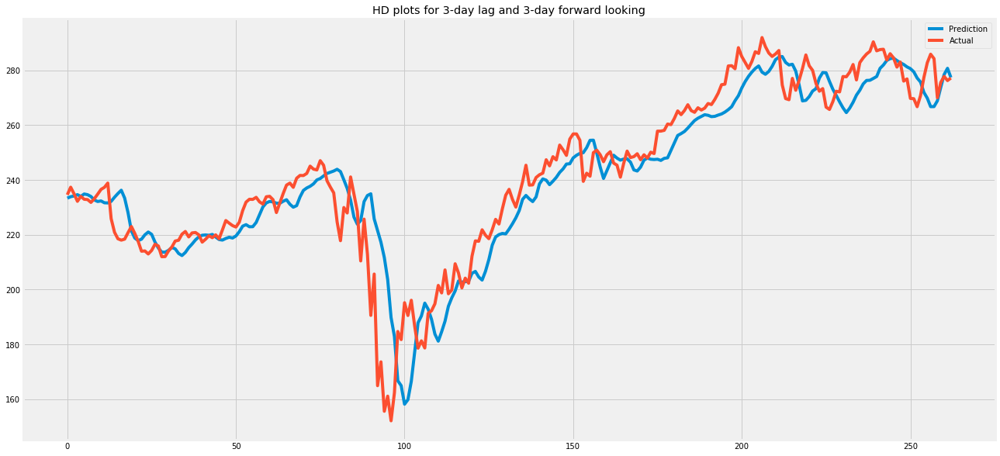

INFO:tensorflow:Assets written to: Stock-Prediction-models/HD_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


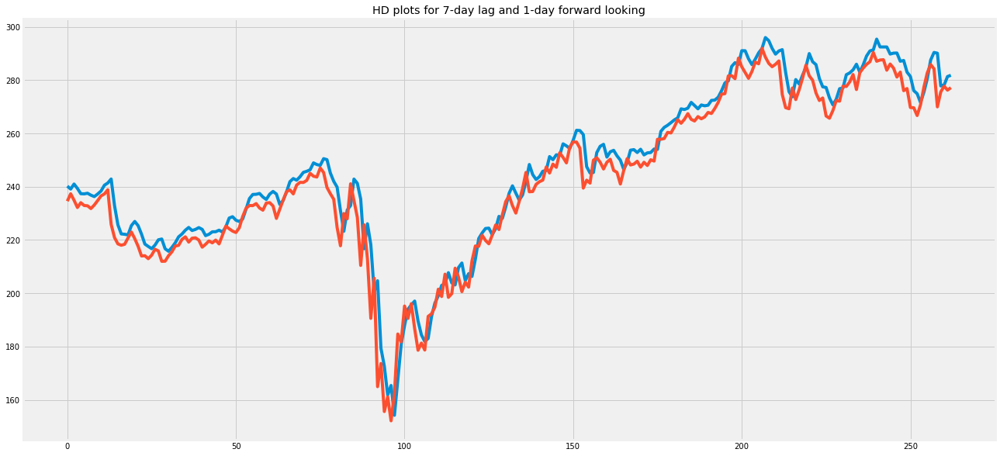

INFO:tensorflow:Assets written to: Stock-Prediction-models/HD_model_gr_7day_lag_1day_forward/assets
Starting process for: VZ
Starting process for: 3-days lag and 5-days forward prediction


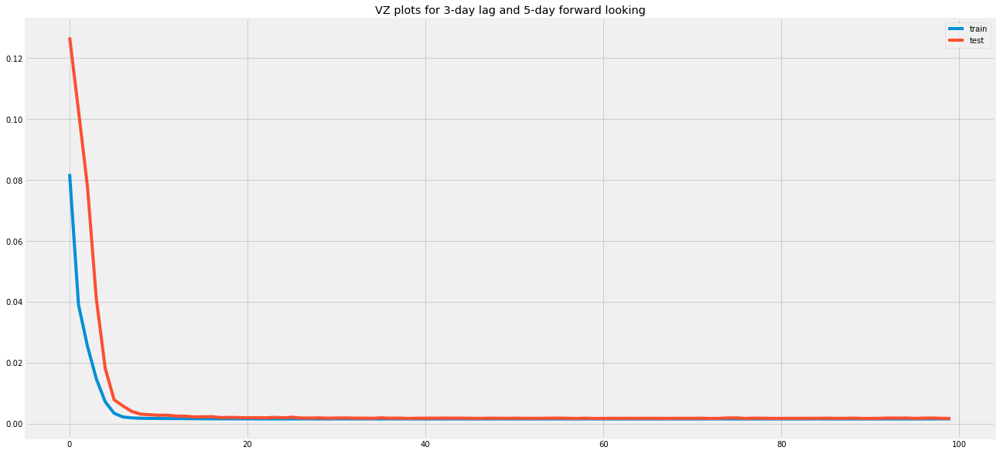

Test RMSE: 1.561


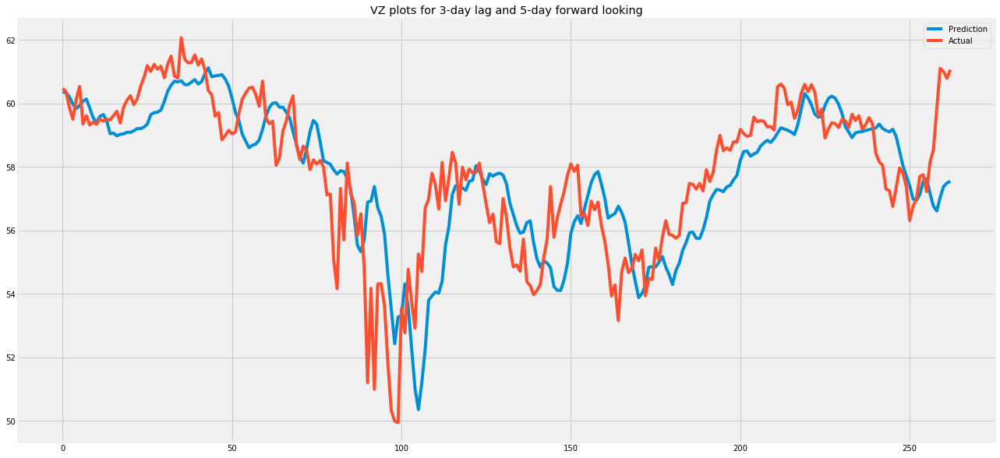

INFO:tensorflow:Assets written to: Stock-Prediction-models/VZ_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


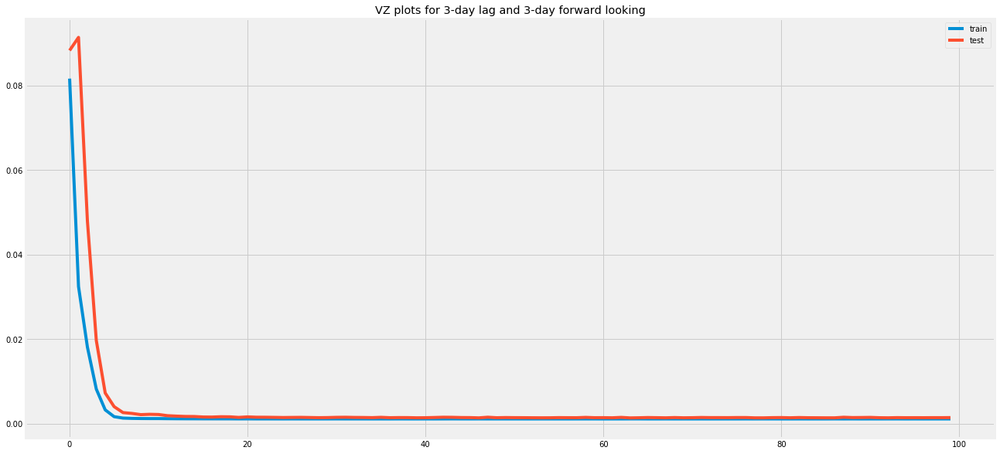

Test RMSE: 1.411


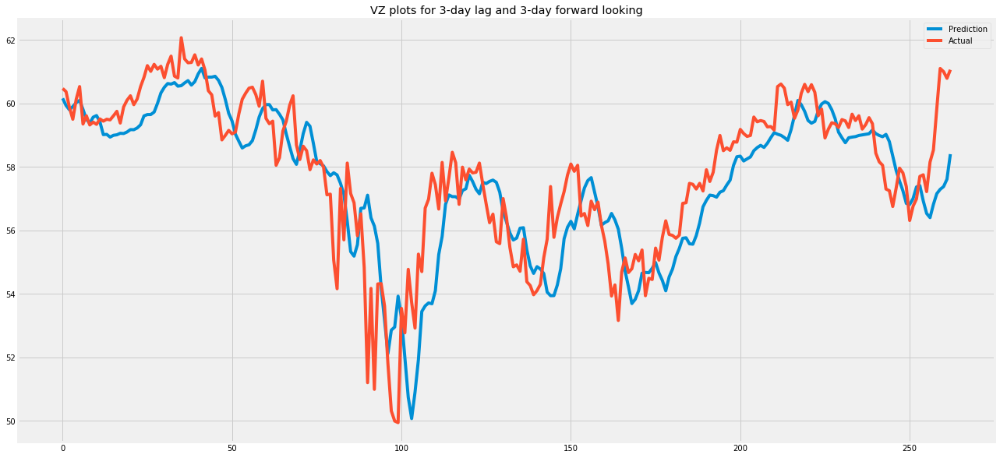

INFO:tensorflow:Assets written to: Stock-Prediction-models/VZ_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


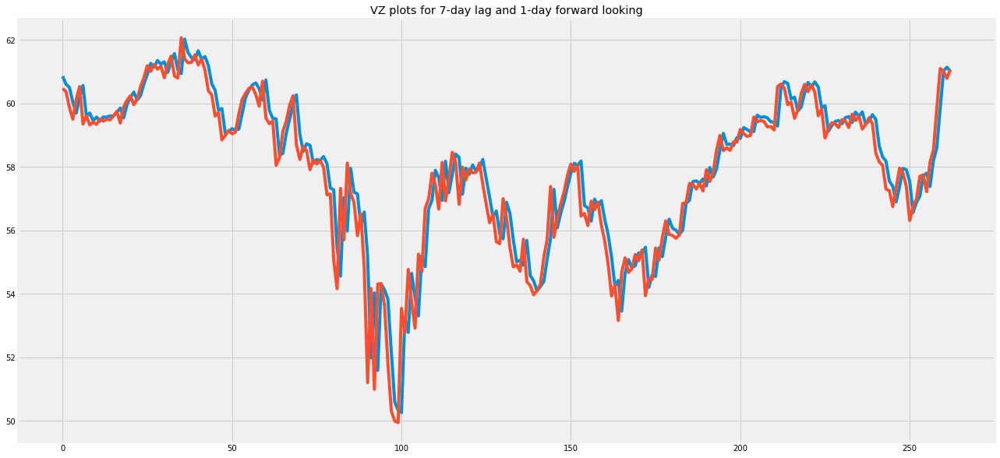

INFO:tensorflow:Assets written to: Stock-Prediction-models/VZ_model_gr_7day_lag_1day_forward/assets
Starting process for: DIS
Starting process for: 3-days lag and 5-days forward prediction


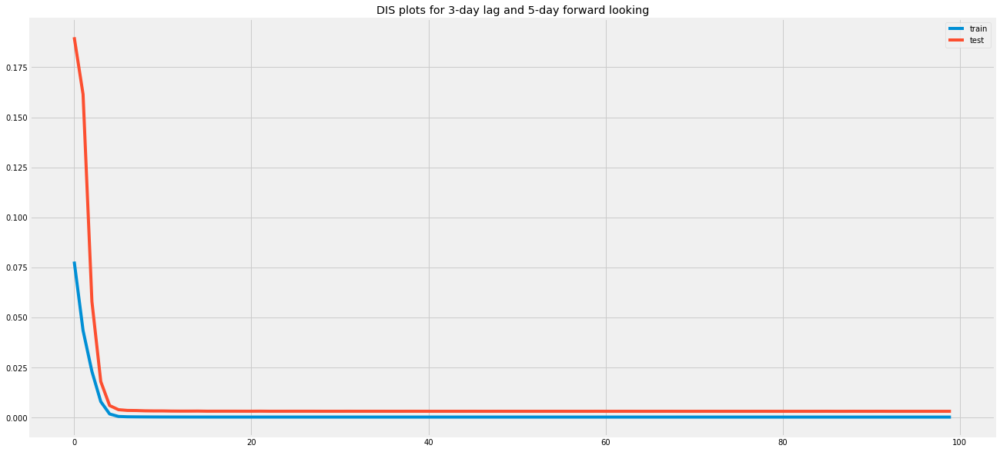

Test RMSE: 7.452


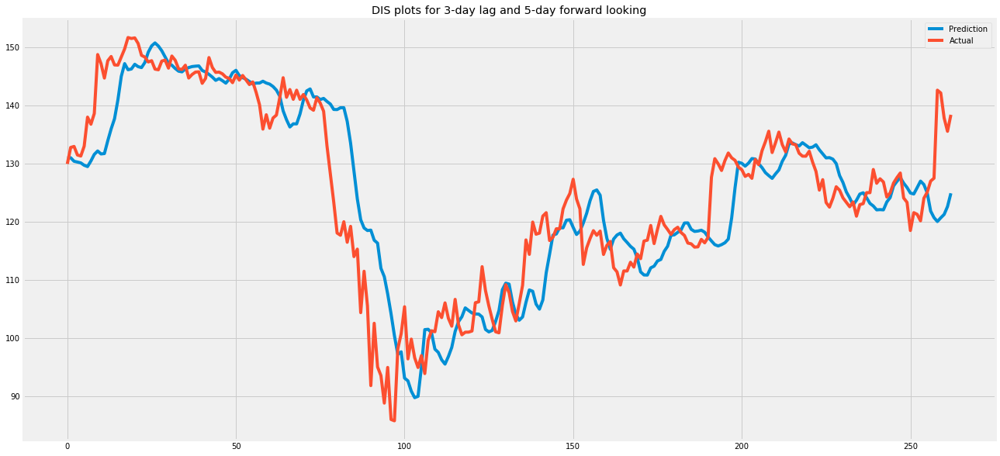

INFO:tensorflow:Assets written to: Stock-Prediction-models/DIS_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


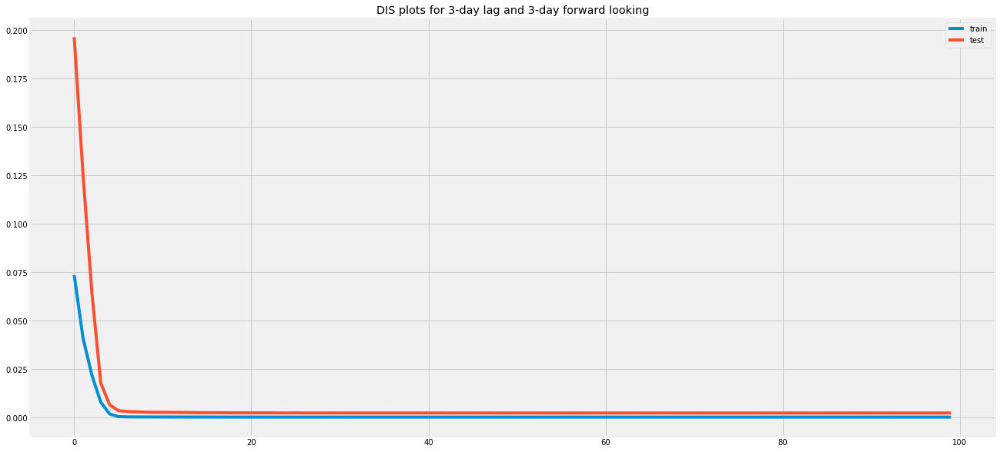

Test RMSE: 6.360


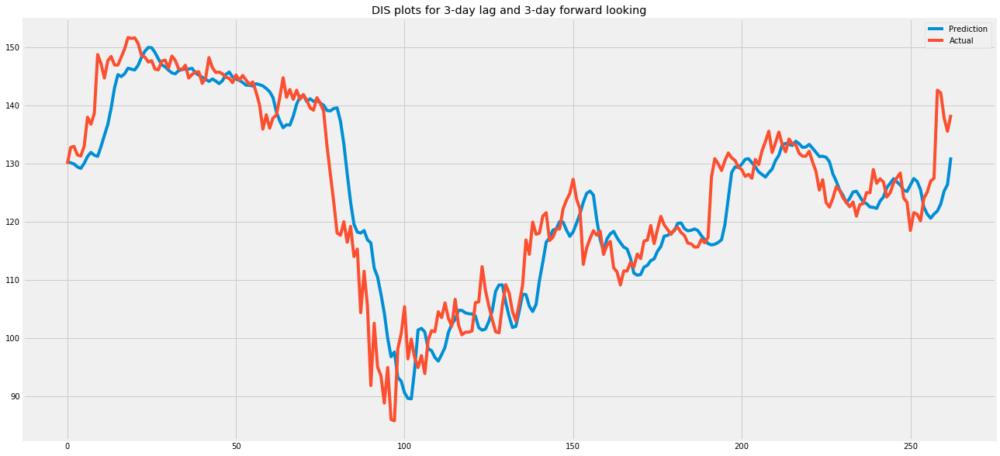

INFO:tensorflow:Assets written to: Stock-Prediction-models/DIS_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


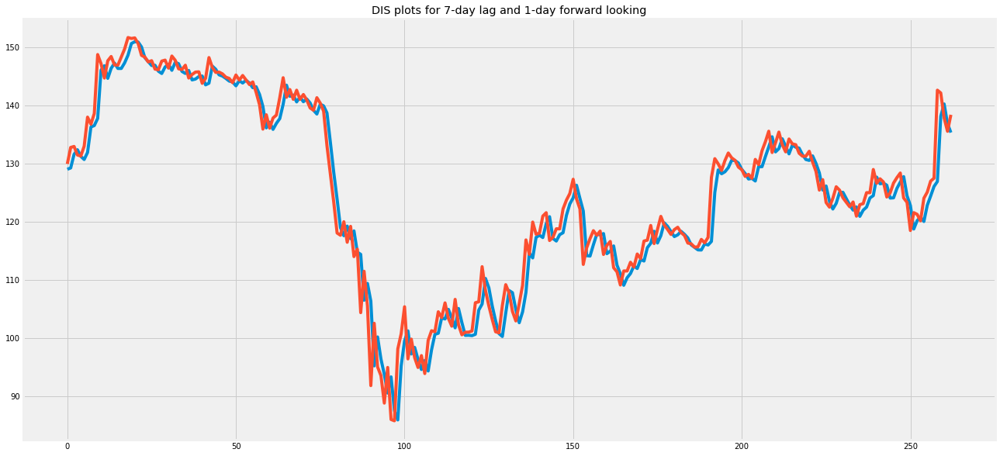

INFO:tensorflow:Assets written to: Stock-Prediction-models/DIS_model_gr_7day_lag_1day_forward/assets
Starting process for: ADBE
Starting process for: 3-days lag and 5-days forward prediction


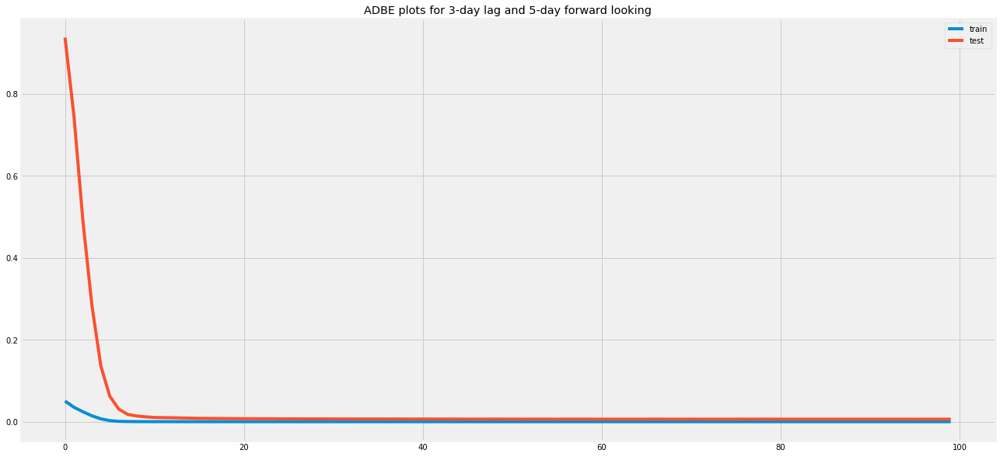

Test RMSE: 24.094


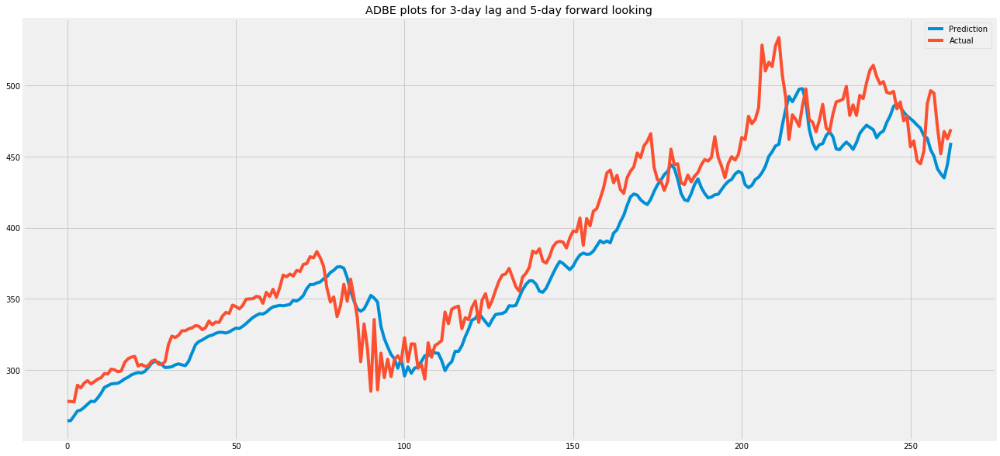

INFO:tensorflow:Assets written to: Stock-Prediction-models/ADBE_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


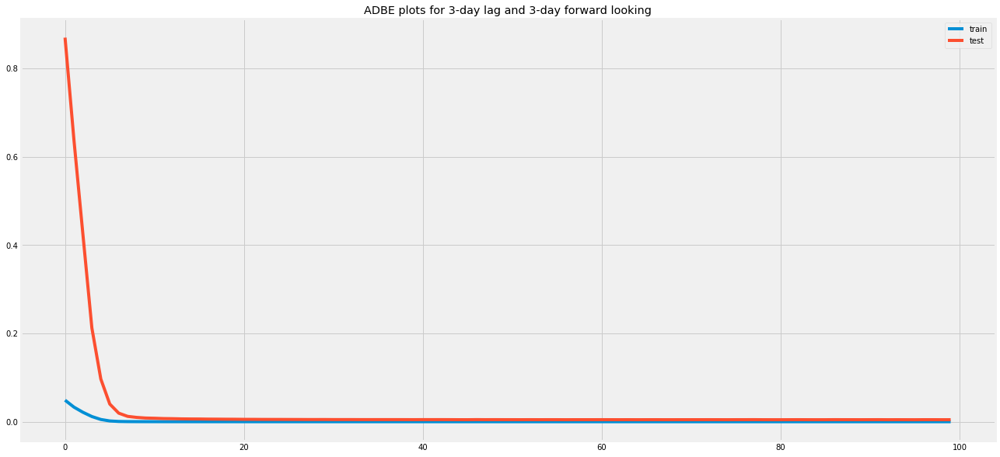

Test RMSE: 20.659


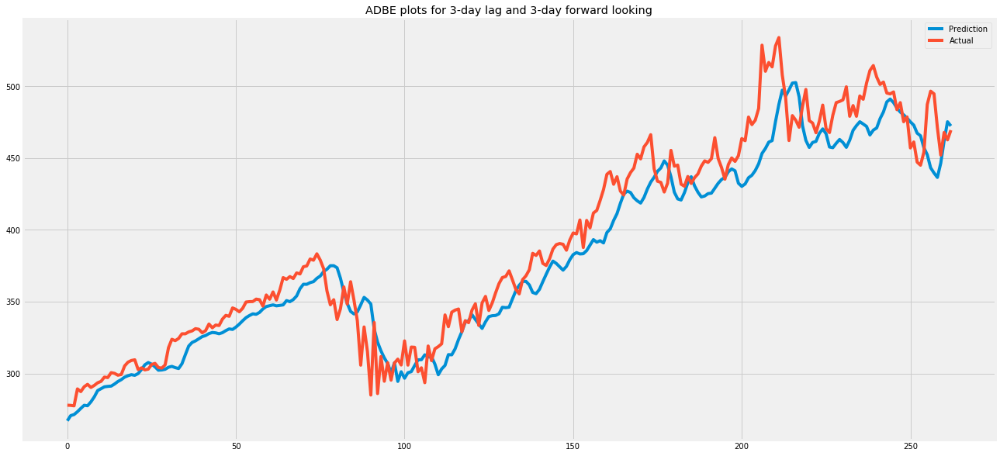

INFO:tensorflow:Assets written to: Stock-Prediction-models/ADBE_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


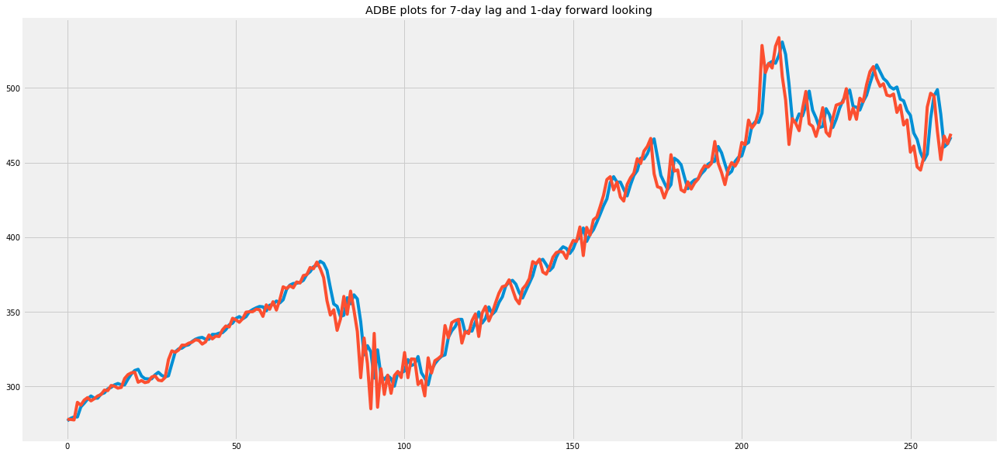

INFO:tensorflow:Assets written to: Stock-Prediction-models/ADBE_model_gr_7day_lag_1day_forward/assets
Starting process for: CRM
Starting process for: 3-days lag and 5-days forward prediction


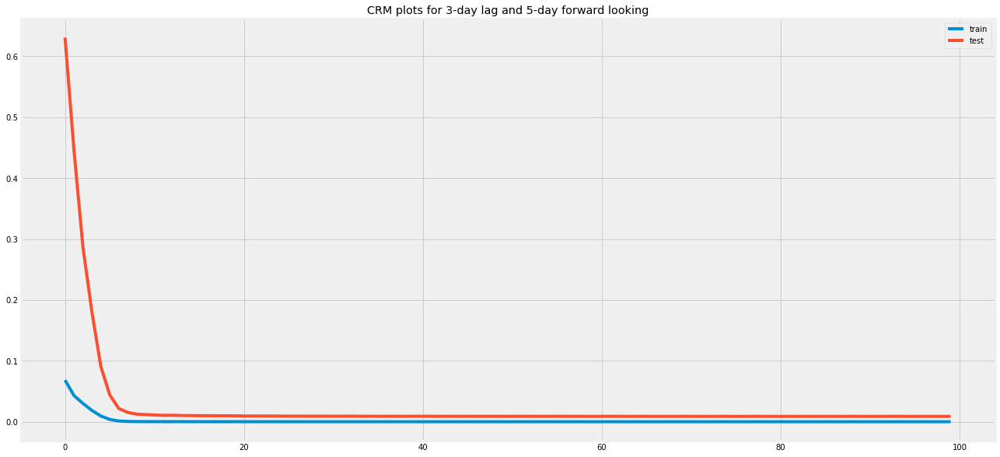

Test RMSE: 17.318


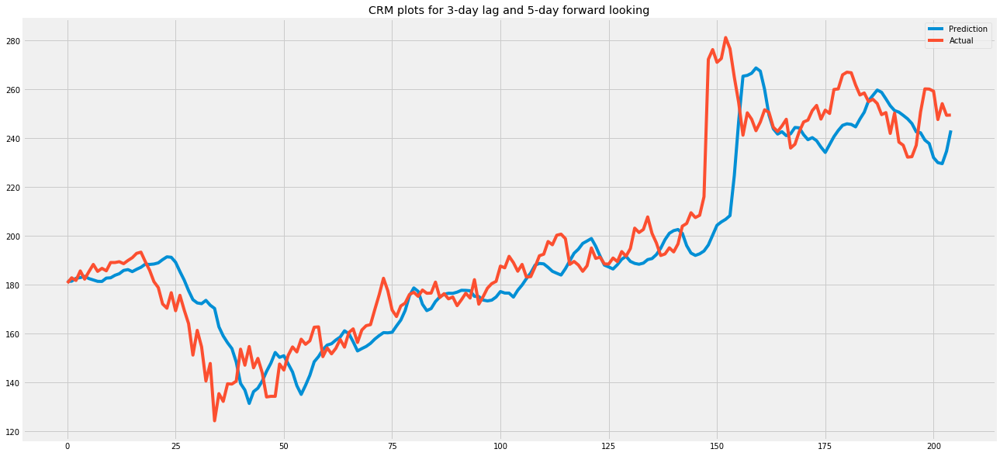

INFO:tensorflow:Assets written to: Stock-Prediction-models/CRM_model_gr_3day_lag_5day_forward/assets
Starting process for: 3-days lag and 3-days forward prediction


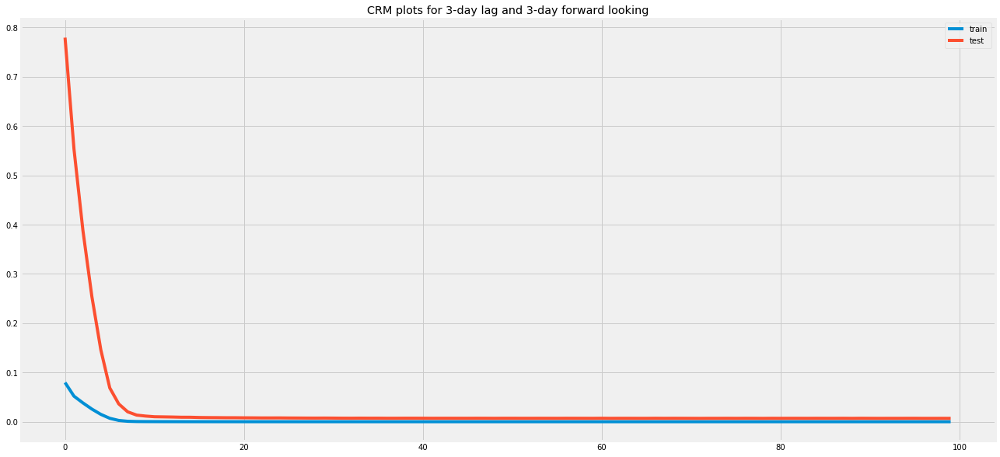

Test RMSE: 15.304


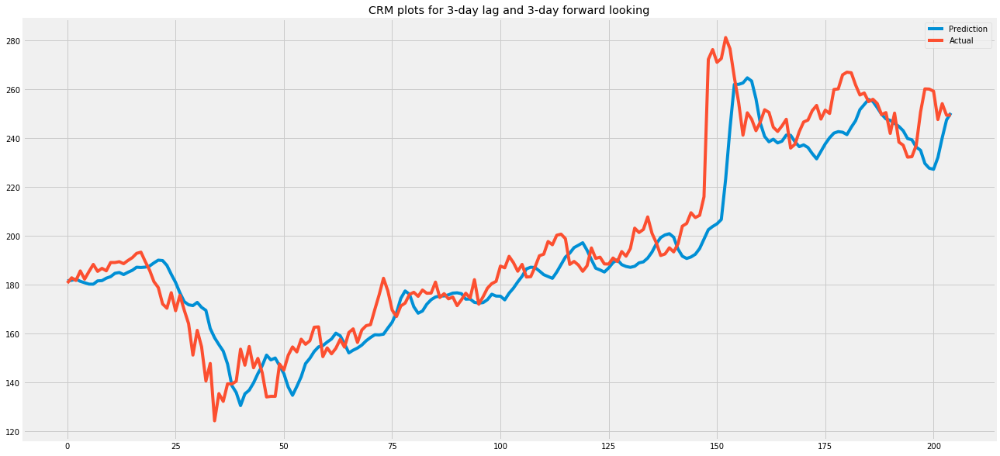

INFO:tensorflow:Assets written to: Stock-Prediction-models/CRM_model_gr_3day_lag_3day_forward/assets
Starting process for: 7-days lag and 1-days forward prediction
(7,)


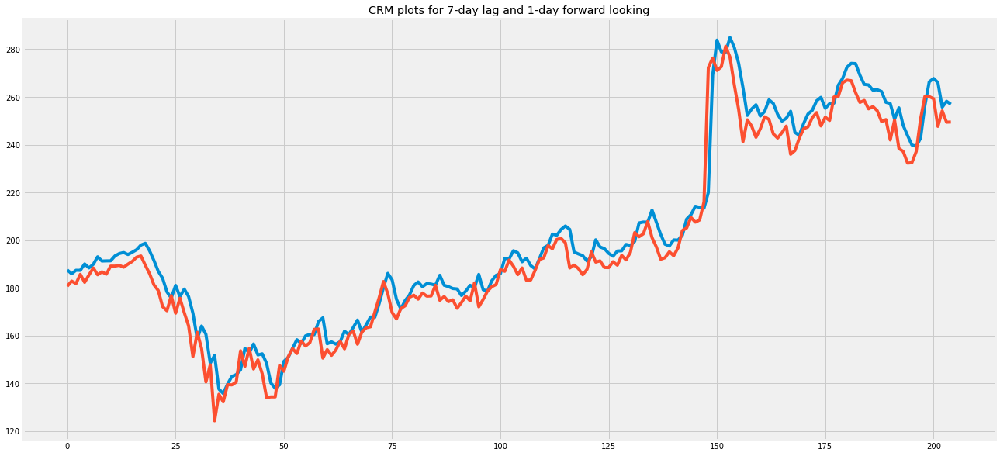

INFO:tensorflow:Assets written to: Stock-Prediction-models/CRM_model_gr_7day_lag_1day_forward/assets
Finished process for: CRM


In [216]:
lags = 42
forward_looking_days_con = 5
stocks = ['AAPL', 'AMZN', 'MSFT', 'GOOGL', 'FB', 'V', 'WMT','JNJ',
          'TSLA', 'PG', 'MA', 'JPM', 'NVDA', 'UNH', 'HD', 'VZ', 'DIS','ADBE', 'CRM']
train_deployment_models(stocks=stocks, lags = [7], forward_looking_days_con = [1],epochs = 100, verbose = 0)




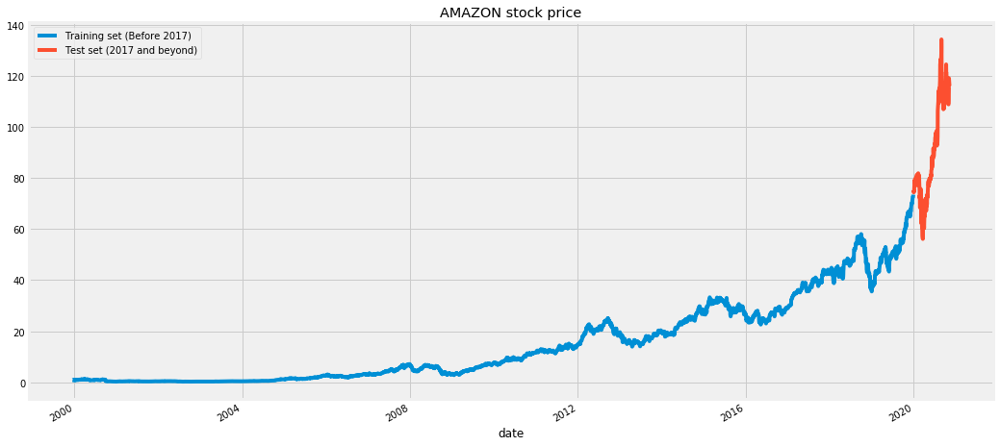

In [342]:
#We have chosen 'High' attribute for prices. Let's see what it looks like
dataset["close"][:'2019'].plot(figsize=(16,8),legend=True)
dataset["close"]['2020':].plot(figsize=(16,8),legend=True)
plt.legend(['Training set (Before 2017)','Test set (2017 and beyond)'])
plt.title('AMAZON stock price')
plt.show()


In [142]:
AAPL_model_gr_2day_lag_1day_forward
    
    
    
    


In [300]:


model = Sequential()
model.add(LSTM(units=100, return_sequences=True, input_shape=(a_train.shape[1],a_train.shape[2])))
model.add(LSTM(units=100))
#model.add(Dropout(0.2))
model.add(Dense(1))

ADAM=keras.optimizers.Adam(0.0005, beta_1=0.9, beta_2=0.999, amsgrad=False)
SGD = keras.optimizers.SGD(learning_rate=0.05,momentum=0.9)
callback = keras.callbacks.LearningRateScheduler(scheduler)

model.compile(loss='mean_squared_error', optimizer=SGD)
history = model.fit(a_train,b_train,
                    epochs=50,
                    batch_size=16,
                    validation_data=(c_test,d_test),
                    verbose=1,
                    #callbacks=[callback],
                    shuffle=False)


Epoch 1/50
309/309 [==============================] - 16s 53ms/step - loss: 0.0097 - val_loss: 0.0032
Epoch 2/50
309/309 [==============================] - 16s 50ms/step - loss: 0.0016 - val_loss: 0.0029
Epoch 3/50
309/309 [==============================] - 15s 47ms/step - loss: 0.0016 - val_loss: 0.0027
Epoch 4/50
309/309 [==============================] - 14s 47ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 5/50
309/309 [==============================] - 15s 49ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 6/50
309/309 [==============================] - 14s 46ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 7/50
309/309 [==============================] - 14s 47ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 8/50
309/309 [==============================] - 15s 50ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 9/50
309/309 [==============================] - 14s 47ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 10/50
309/309 [==============================] - 15s 50ms/step - loss: 0.001

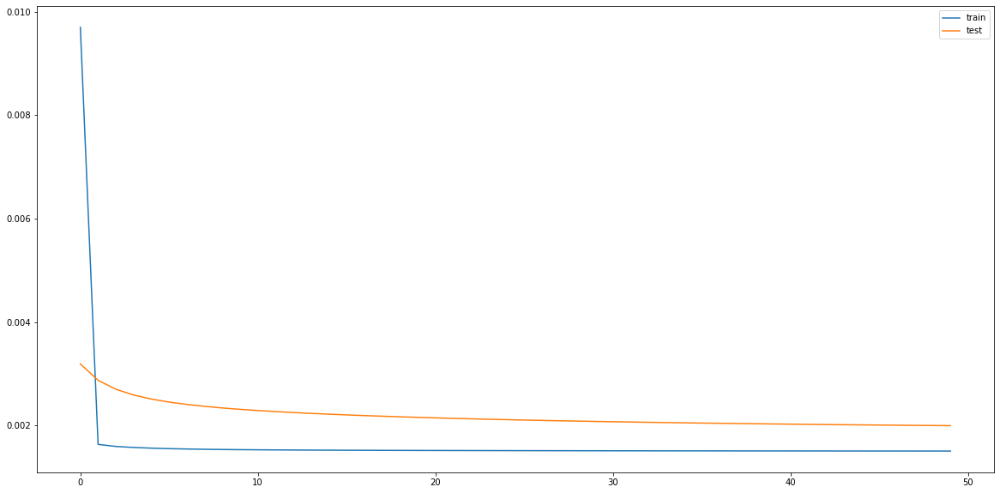

In [301]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()



Test RMSE: 0.029


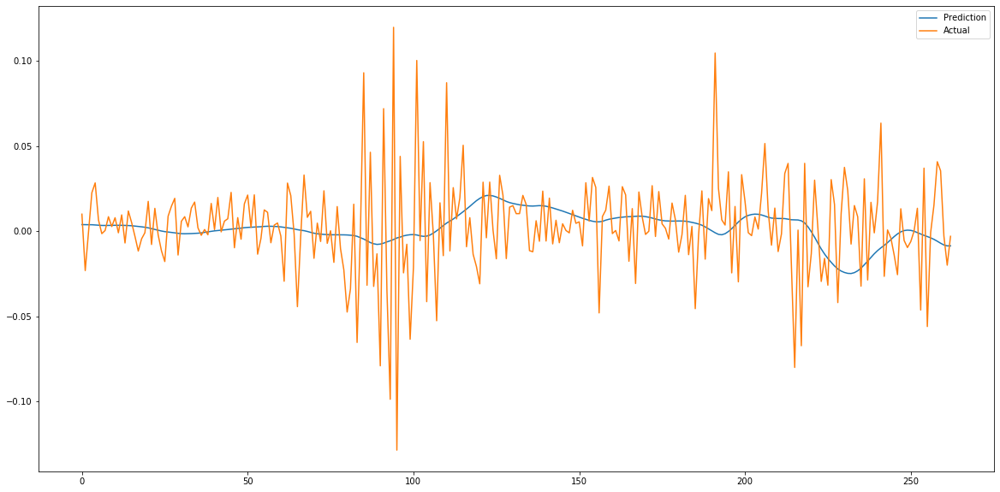

In [302]:
from numpy import concatenate
yhat = model.predict(c_test)
X_test_new = X_test.reshape((X_test.shape[0], X_test.shape[2]))
inv_yhat = concatenate((yhat,X_test_new), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]

mean_squared_error = keras.losses.MeanSquaredError()
y_test_new = y_test.reshape((len(y_test), 1))
inv_y = concatenate((y_test_new,X_test_new), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

#plt.plot(dataset.index[:len(inv_yhat)].values,inv_yhat,label="Prediction")
#plt.plot(dataset.index[:len(inv_yhat)].values,y[len(y_train)+60:].values,label="Actual")
plt.plot(inv_yhat,label="Prediction")
plt.plot(inv_y,label="Actual")
plt.legend()
plt.show()


In [143]:
model_5_days_v2 = Sequential()
model_5_days_v2.add(LSTM(units=50, return_sequences=True, input_shape=(a_train.shape[1],a_train.shape[2])))
model_5_days_v2.add(LSTM(units=50))
model_5_days_v2.add(Dropout(0.4))
model_5_days_v2.add(Dense(1))

ADAM=keras.optimizers.Adam(0.0005, beta_1=0.9, beta_2=0.999, amsgrad=False)
SGD = keras.optimizers.SGD(learning_rate=0.01,momentum=0.9)
callback = keras.callbacks.LearningRateScheduler(scheduler)

model_5_days_v2.compile(loss='mean_squared_error', optimizer=SGD)
history = model_5_days_v2.fit(a_train,b_train,epochs=200,batch_size=32,validation_data=(c_test,d_test),verbose=1,shuffle=False,callbacks=[callback])

Epoch 1/200
130/130 [==============================] - 6s 46ms/step - loss: 0.0023 - val_loss: 0.0880
Epoch 2/200
130/130 [==============================] - 6s 43ms/step - loss: 0.0017 - val_loss: 0.1029
Epoch 3/200
130/130 [==============================] - 6s 43ms/step - loss: 0.0017 - val_loss: 0.1087
Epoch 4/200
130/130 [==============================] - 6s 44ms/step - loss: 0.0018 - val_loss: 0.1081
Epoch 5/200
130/130 [==============================] - 6s 44ms/step - loss: 0.0023 - val_loss: 0.0992
Epoch 6/200
130/130 [==============================] - 6s 45ms/step - loss: 0.0028 - val_loss: 0.0884
Epoch 7/200
130/130 [==============================] - 7s 52ms/step - loss: 0.0034 - val_loss: 0.0765
Epoch 8/200
130/130 [==============================] - 6s 44ms/step - loss: 0.0035 - val_loss: 0.0666
Epoch 9/200
130/130 [==============================] - 6s 44ms/step - loss: 0.0036 - val_loss: 0.0605
Epoch 10/200
130/130 [==============================] - 7s 52ms/step - loss: 0.003

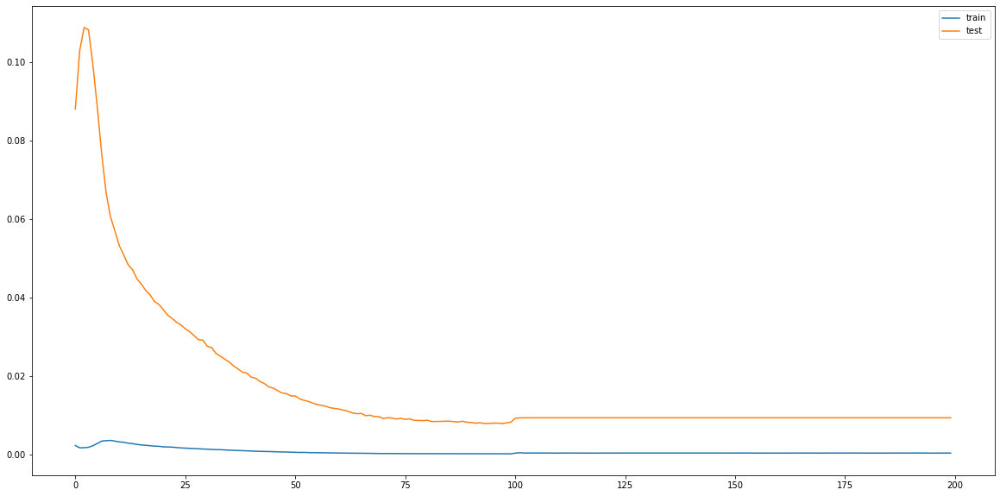

In [144]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

Test RMSE: 10.072


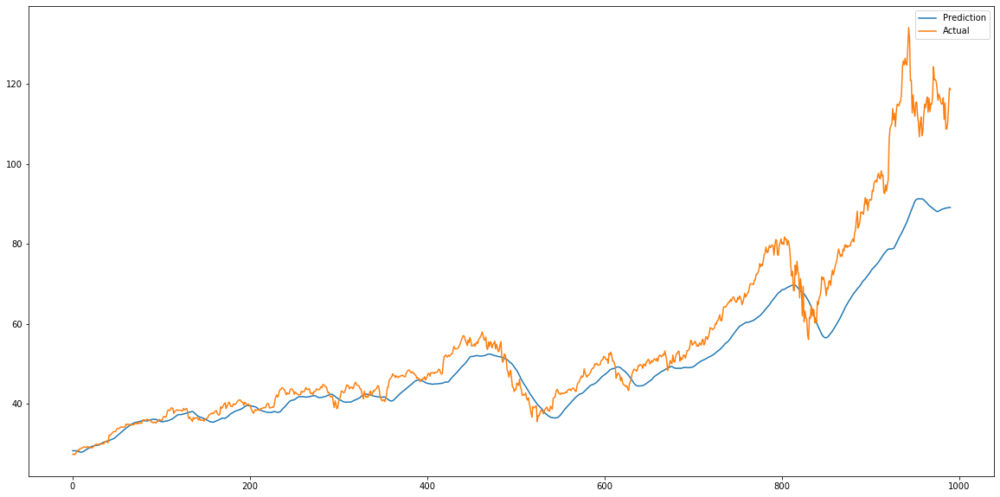

In [145]:
yhat = model.predict(c_test)
X_test_new = X_test.reshape((X_test.shape[0], X_test.shape[2]))
inv_yhat = concatenate((yhat,X_test_new[60:, 1:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]

mean_squared_error = keras.losses.MeanSquaredError()
y_test_new = y_test.reshape((len(y_test), 1))
inv_y = concatenate((y_test_new[60:],X_test_new[60:, 1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

#plt.plot(dataset.index[:len(inv_yhat)].values,inv_yhat,label="Prediction")
#plt.plot(dataset.index[:len(inv_yhat)].values,y[len(y_train)+60:].values,label="Actual")
plt.plot(inv_yhat,label="Prediction")
plt.plot(y[len(y_train)+60:].values,label="Actual")
plt.legend()
plt.show()



In [ ]:
#for plotting
train = new_data[:int(dataset.shape[0]*0.8)]
valid = new_data[int(dataset.shape[0]*0.8):]
valid['Predictions'] = closing_price
plt.plot(train['Close'])
plt.plot(valid[['Close','Predictions']])

valid_plot = valid.copy()
valid_plot['Predictions'] = y_pred_uni
plt.plot(train['Close'])
plt.plot(valid_plot[['Close','Predictions']])

## Univariate model

In [172]:
#creating dataframe
data = TI.close_data.sort_index(ascending=True, axis=0)
new_data = pd.DataFrame(index=range(0,len(data)),columns=['Date', 'Close'])
for i in range(0,len(data)):
    new_data['Date'][i] = data.index[i]
    new_data['Close'][i] = data['close'][i]

#setting index
new_data.index = new_data.Date
new_data.drop('Date', axis=1, inplace=True)

#creating train and test sets
dataset_adj = new_data

train = dataset_adj.iloc[0:int(dataset_adj.shape[0]*0.9),:]
valid = dataset_adj.iloc[int(dataset_adj.shape[0]*0.9):,:]


In [187]:
#converting dataset into x_train and y_train
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(dataset_adj)

x_train_uni, y_train_uni = [], []
for i in range(60,len(train)):
    x_train_uni.append(scaled_data[i-60:i,0])
    y_train_uni.append(scaled_data[i,0])

x_train_uni, y_train_uni = np.array(x_train_uni), np.array(y_train_uni)

x_train_uni = np.reshape(x_train_uni, (x_train_uni.shape[0],x_train_uni.shape[1],1))


#Test
#predicting, using past 60 from the train data
inputs = new_data[len(new_data) - len(valid) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = scaler.transform(inputs)

x_test_uni, y_test_uni = [], []
for j in range(60,inputs.shape[0]):
    x_test_uni.append(inputs[j-60:j,0])
    y_test_uni.append(inputs[j,0])

x_test_uni, y_test_uni = np.array(x_test_uni), np.array(y_test_uni)

x_test_uni = np.reshape(x_test_uni, (x_test_uni.shape[0],x_test_uni.shape[1],1))


In [189]:
# create and fit the LSTM network
model_univariate_v1 = Sequential()
model_univariate_v1.add(LSTM(units=50, return_sequences=True, input_shape=(x_train_uni.shape[1],1)))
model_univariate_v1.add(LSTM(units=50))
model_univariate_v1.add(Dense(1))

SGD = keras.optimizers.SGD(learning_rate=0.01,momentum=0.9)

model_univariate_v1.compile(loss='mean_squared_error', optimizer=SGD)
history_uni_v1_1d = model_univariate_v1.fit(x_train_uni, y_train_uni, validation_data=(x_test_uni,y_test_uni), epochs=250, batch_size=32, verbose=1)

Epoch 1/250
146/146 [==============================] - 7s 50ms/step - loss: 0.0044 - val_loss: 0.0132
Epoch 2/250
146/146 [==============================] - 7s 45ms/step - loss: 5.6106e-05 - val_loss: 0.0049
Epoch 3/250
146/146 [==============================] - 7s 49ms/step - loss: 3.8742e-05 - val_loss: 0.0050
Epoch 4/250
146/146 [==============================] - 6s 44ms/step - loss: 3.9742e-05 - val_loss: 0.0048
Epoch 5/250
146/146 [==============================] - 6s 42ms/step - loss: 3.8335e-05 - val_loss: 0.0049
Epoch 6/250
146/146 [==============================] - 7s 45ms/step - loss: 3.8147e-05 - val_loss: 0.0047
Epoch 7/250
146/146 [==============================] - 7s 46ms/step - loss: 3.8070e-05 - val_loss: 0.0047
Epoch 8/250
146/146 [==============================] - 6s 44ms/step - loss: 3.7643e-05 - val_loss: 0.0046
Epoch 9/250
146/146 [==============================] - 7s 45ms/step - loss: 3.7390e-05 - val_loss: 0.0045
Epoch 10/250
146/146 [============================

In [190]:
y_pred_uni = model_univariate_v1.predict(x_test_uni)
y_pred_uni = scaler.inverse_transform(y_pred_uni)

In [191]:
rms=np.sqrt(np.mean(np.power((valid-y_pred_uni),2)))
rms

Close    5.373344
dtype: float64

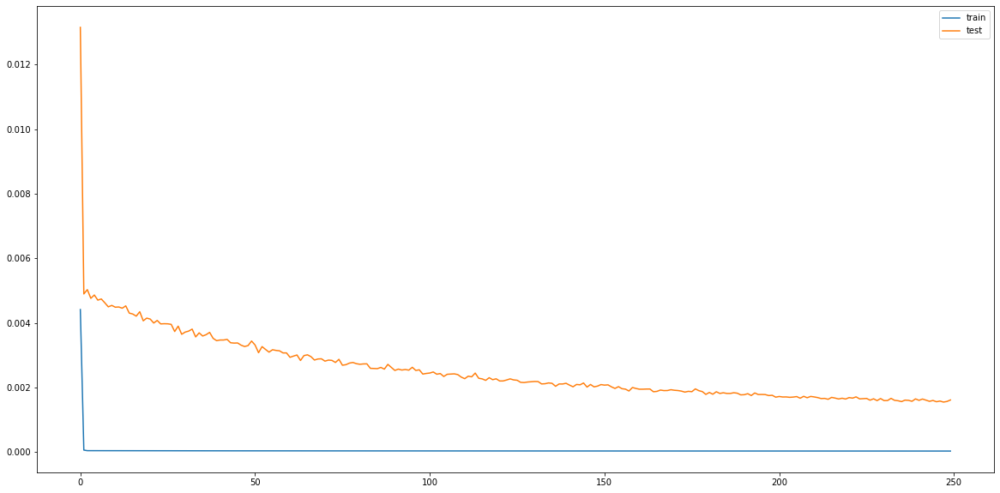

In [195]:
plt.plot(history_uni_v1_1d.history['loss'], label='train')
plt.plot(history_uni_v1_1d.history['val_loss'], label='test')
plt.legend()
plt.show()

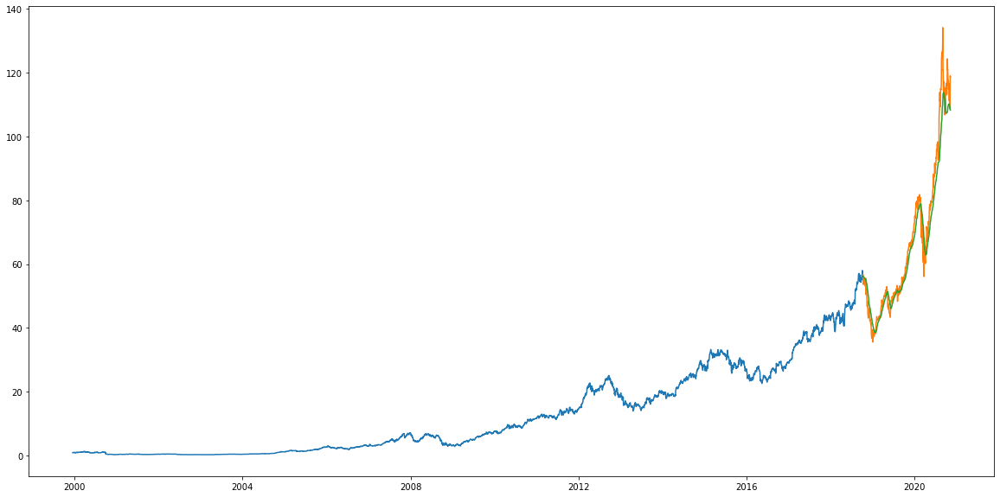

In [192]:
#for plotting
#train = new_data[:int(dataset.shape[0]*0.8)]
valid_plot = valid.copy()
valid_plot['Predictions'] = y_pred_uni
plt.plot(train['Close'])
plt.plot(valid_plot[['Close','Predictions']])

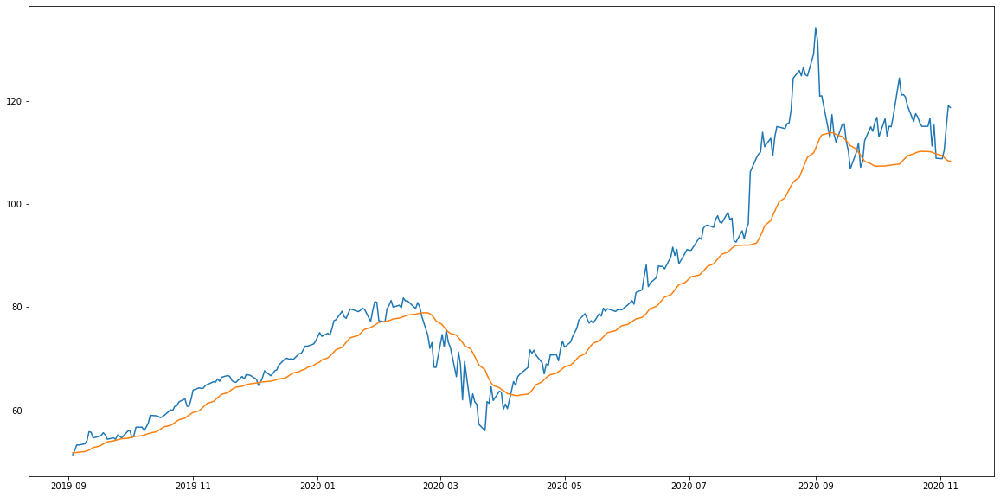

In [211]:
plt.plot(valid_plot[['Close','Predictions']][-300:])

## Training on 30 day lag

In [213]:
def train_univariate_model(lag = 60,forward_pred = 5,dataset_adj):
lag = 60
forward_pred = 5 #days

train = dataset_adj.iloc[0:int(dataset_adj.shape[0]*0.9),:]
valid = dataset_adj.iloc[int(dataset_adj.shape[0]*0.9):,:]

#converting dataset into x_train and y_train
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(dataset_adj)

x_train_uni, y_train_uni = [], []
for i in range(lag,len(train)-forward_pred):
    x_train_uni.append(scaled_data[i-lag:i,0])
    y_train_uni.append(scaled_data[i+forward_pred,0])

x_train_uni, y_train_uni = np.array(x_train_uni), np.array(y_train_uni)

x_train_uni = np.reshape(x_train_uni, (x_train_uni.shape[0],x_train_uni.shape[1],1))


#Test
#predicting, using past 30 from the train data
inputs = new_data[len(new_data) - len(valid) - lag:].values
inputs = inputs.reshape(-1,1)
inputs  = scaler.transform(inputs)

x_test_uni, y_test_uni = [], []
for j in range(lag,inputs.shape[0]-forward_pred):
    x_test_uni.append(inputs[j-lag:j,0])
    y_test_uni.append(inputs[j+forward_pred,0])

x_test_uni, y_test_uni = np.array(x_test_uni), np.array(y_test_uni)

x_test_uni = np.reshape(x_test_uni, (x_test_uni.shape[0],x_test_uni.shape[1],1))



In [214]:
# create and fit the LSTM network
model_univariate_v2 = Sequential()
model_univariate_v2.add(LSTM(units=50, return_sequences=True, input_shape=(x_train_uni.shape[1],1)))
model_univariate_v2.add(LSTM(units=50))
model_univariate_v2.add(Dense(1))

SGD = keras.optimizers.SGD(learning_rate=0.01,momentum=0.9)

model_univariate_v2.compile(loss='mean_squared_error', optimizer=SGD)
history_uni_v2_1d = model_univariate_v1.fit(x_train_uni, y_train_uni, validation_data=(x_test_uni,y_test_uni), epochs=250, batch_size=32, verbose=1)

Epoch 1/250
146/146 [==============================] - 8s 52ms/step - loss: 4.6634e-05 - val_loss: 0.0017
Epoch 2/250
146/146 [==============================] - 7s 45ms/step - loss: 4.7052e-05 - val_loss: 0.0016
Epoch 3/250
146/146 [==============================] - 7s 48ms/step - loss: 4.5886e-05 - val_loss: 0.0016
Epoch 4/250
146/146 [==============================] - 7s 45ms/step - loss: 4.6410e-05 - val_loss: 0.0016
Epoch 5/250
146/146 [==============================] - 6s 44ms/step - loss: 4.6175e-05 - val_loss: 0.0017
Epoch 6/250
146/146 [==============================] - 7s 45ms/step - loss: 4.6261e-05 - val_loss: 0.0017
Epoch 7/250
146/146 [==============================] - 7s 46ms/step - loss: 4.6562e-05 - val_loss: 0.0017
Epoch 8/250
146/146 [==============================] - 6s 42ms/step - loss: 4.6641e-05 - val_loss: 0.0016
Epoch 9/250
146/146 [==============================] - 6s 41ms/step - loss: 4.5956e-05 - val_loss: 0.0016
Epoch 10/250
146/146 [========================

In [217]:
y_pred_uni = model_univariate_v2.predict(x_test_uni)
y_pred_uni = scaler.inverse_transform(y_pred_uni)

In [221]:
rms=np.sqrt(np.mean(np.power((valid[forward_pred:]-y_pred_uni),2)))
rms

Close    76.68502
dtype: float64

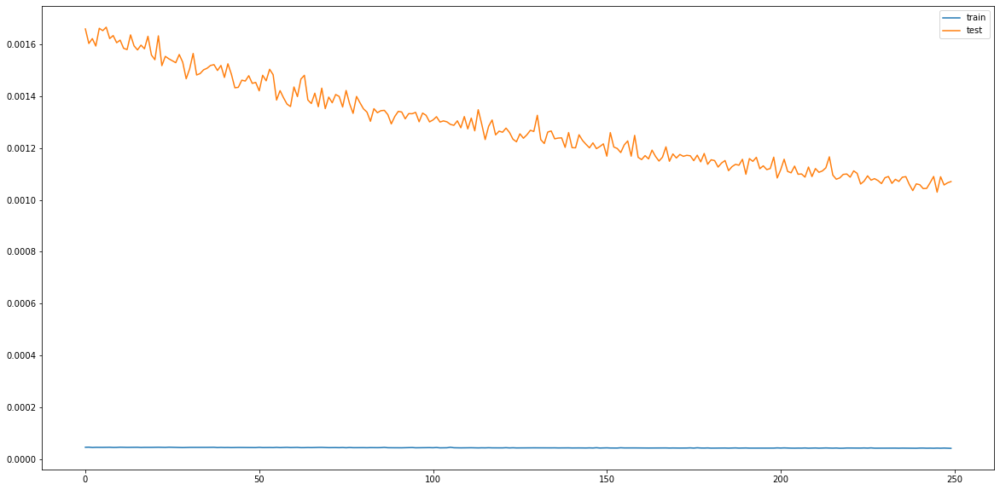

In [219]:
plt.plot(history_uni_v2_1d.history['loss'], label='train')
plt.plot(history_uni_v2_1d.history['val_loss'], label='test')
plt.legend()
plt.show()

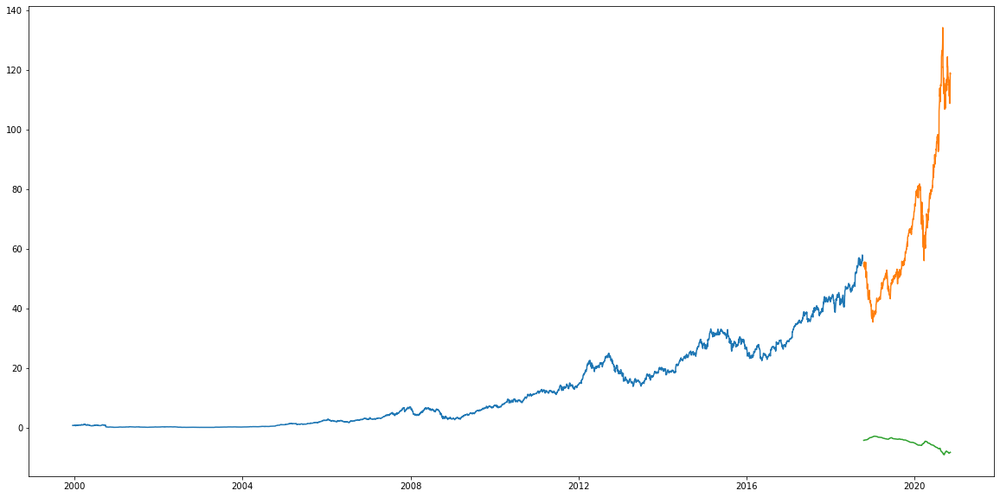

In [223]:
valid_plot = valid[forward_pred:].copy()
valid_plot['Predictions'] = y_pred_uni
plt.plot(train['Close'])
plt.plot(valid_plot[['Close','Predictions']])

In [227]:
model_univariate_v3 = Sequential()
model_univariate_v3.add(LSTM(units=100, return_sequences=True, input_shape=(x_train_uni.shape[1],1)))
model_univariate_v3.add(LSTM(units=100))
model_univariate_v3.add(Dense(1))

SGD = keras.optimizers.SGD(learning_rate=0.01,momentum=0.9)

model_univariate_v2.compile(loss='mean_squared_error', optimizer=SGD)
history_uni_v2_1d = model_univariate_v1.fit(x_train_uni, y_train_uni, validation_data=(x_test_uni,y_test_uni), epochs=250, batch_size=32, verbose=1)

Epoch 1/250
146/146 [==============================] - 7s 46ms/step - loss: 4.3035e-05 - val_loss: 0.0019
Epoch 2/250
146/146 [==============================] - 7s 46ms/step - loss: 4.3005e-05 - val_loss: 0.0019
Epoch 3/250
146/146 [==============================] - 7s 45ms/step - loss: 4.2950e-05 - val_loss: 0.0019
Epoch 4/250
146/146 [==============================] - 7s 46ms/step - loss: 4.2988e-05 - val_loss: 0.0019
Epoch 5/250
146/146 [==============================] - 7s 45ms/step - loss: 4.2925e-05 - val_loss: 0.0019
Epoch 6/250
146/146 [==============================] - 7s 48ms/step - loss: 4.2952e-05 - val_loss: 0.0019
Epoch 7/250
146/146 [==============================] - 7s 45ms/step - loss: 4.2432e-05 - val_loss: 0.0019
Epoch 8/250
146/146 [==============================] - 6s 44ms/step - loss: 4.2470e-05 - val_loss: 0.0019
Epoch 9/250
146/146 [==============================] - 6s 42ms/step - loss: 4.3170e-05 - val_loss: 0.0019
Epoch 10/250
146/146 [========================

In [228]:
y_pred_uni = model_univariate_v2.predict(x_test_uni)
y_pred_uni = scaler.inverse_transform(y_pred_uni)

In [229]:
rms=np.sqrt(np.mean(np.power((valid[forward_pred:]-y_pred_uni),2)))
rms

Close    76.68502
dtype: float64

In [141]:
TI=TechnicalIndicators(symbol='TSLA', request_input=False)
close_data=TI.close_data[['close']]
volume_data=TI.close_data[['volume']]
macd_data=TI.macd_data
rsi_data=TI.rsi_data
bbands_data=TI.bbands_data
sma_data=TI.sma_data
vix_data = TI.vix_data
        


In [159]:
forward_looking_days = 3
lag = 21

if forward_looking_days == 3:
    dataset = pd.concat([volume_data.copy(), vix_data.copy(), close_data.copy()], axis=1,sort=True).reindex(macd_data.index)
else:
    dataset = pd.concat([rsi_data.copy(), volume_data.copy(), vix_data.copy(), close_data.copy()], axis=1,sort=True).reindex(macd_data.index)

dataset = dataset.sort_index(ascending=True)

X, y = get_modelling_data(dataset_= dataset, lag_ = lag, forward_days_ = forward_looking_days,returns_ = True)
a_train,b_train,c_test,d_test, X_train, y_train, X_test, y_test,scaler_x,scaler_y = create_test_and_train_sets(X=X, y=y, train_ratio=0.95, lag = lag)




In [160]:
y

,close
date,
2010-08-19,0.000532
2010-08-20,-0.002611
2010-08-23,0.072456
2010-08-24,0.021820
2010-08-25,0.041885
...,...
2020-11-09,0.000665
2020-11-10,-0.063298
2020-11-11,-0.029817


In [56]:
y_train

array([[[0.36284108]],

       [[0.35641281]],

       [[0.39191652]],

       ...,

       [[0.40374313]],

       [[0.41578357]],

       [[0.41693454]]])

In [59]:
y_train_new = y_train.reshape( y_train.shape[0],y_train.shape[2])
scaler_y.inverse_transform(y_train_new)

array([[-0.00623539],
       [-0.01068702],
       [ 0.01389961],
       ...,
       [ 0.02208964],
       [ 0.03042775],
       [ 0.03122481]])

In [58]:
scaler_y.inverse_transform(b_train)

array([[-0.06638116],
       [-0.024     ],
       [ 0.02990518],
       ...,
       [ 0.02208964],
       [ 0.03042775],
       [ 0.03122481]])

In [65]:
a_train[-1].shape

(21, 3)

In [66]:
a_train.shape

(4974, 21, 3)

In [67]:
a_train[-1]

array([[0.0105939 , 0.09509202, 0.71384043],
       [0.01140033, 0.09662576, 0.70566446],
       [0.01004665, 0.11266033, 0.7090523 ],
       [0.01235474, 0.09899609, 0.70119248],
       [0.0242778 , 0.1313441 , 0.68068479],
       [0.02629694, 0.15923033, 0.66062877],
       [0.02216147, 0.13915227, 0.6560665 ],
       [0.02309487, 0.11015059, 0.67214744],
       [0.01592457, 0.12158394, 0.67034055],
       [0.01988841, 0.15532627, 0.65665368],
       [0.01803739, 0.13245955, 0.65430483],
       [0.01509975, 0.11754043, 0.66794648],
       [0.02583725, 0.08979364, 0.68967382],
       [0.01665919, 0.07571109, 0.6948234 ],
       [0.06880827, 0.06134969, 0.69771435],
       [0.02646331, 0.06330173, 0.70205075],
       [0.02182875, 0.06483547, 0.69771435],
       [0.01596659, 0.0712493 , 0.69798537],
       [0.01358408, 0.06776352, 0.71031709],
       [0.0129983 , 0.07417735, 0.71189811],
       [0.01042841, 0.06790295, 0.71966756]])

In [195]:
def train_model_v4(X,y,a_dim=100,epoch=50,batch_size=32,d=0.2):
    model = Sequential()
    model.add(Dense(a_dim,activation='relu',input_dim=X.shape[1]))
    model.add(Dropout(d))
    model.add(Dense(a_dim,activation='relu'))
    model.add(Dropout(d))
    model.add(Dense(a_dim,activation='relu'))
    model.add(Dropout(d))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(X, y, epochs=epoch,batch_size=batch_size,  verbose=2)
    return model


def getdata(data,window_size,forward_days = 1):
    X,y = np.array([1]*window_size),np.array([])
    print(X.shape)
    for i in range(window_size, len(data)-forward_days+1):
        X = np.vstack((X,data[i-window_size:i]))
        y = np.append(y,data[i+forward_days-1:i+forward_days])

    return X[1:],y



(42,)
Epoch 1/50
78/78 - 0s - loss: 159.2907
Epoch 2/50
78/78 - 0s - loss: 19.2766
Epoch 3/50
78/78 - 0s - loss: 15.4155
Epoch 4/50
78/78 - 0s - loss: 16.1526
Epoch 5/50
78/78 - 0s - loss: 14.1196
Epoch 6/50
78/78 - 0s - loss: 14.7140
Epoch 7/50
78/78 - 0s - loss: 11.3520
Epoch 8/50
78/78 - 0s - loss: 12.4586
Epoch 9/50
78/78 - 0s - loss: 12.4942
Epoch 10/50
78/78 - 0s - loss: 11.3932
Epoch 11/50
78/78 - 0s - loss: 9.5884
Epoch 12/50
78/78 - 0s - loss: 9.6428
Epoch 13/50
78/78 - 0s - loss: 16.6280
Epoch 14/50
78/78 - 0s - loss: 12.7837
Epoch 15/50
78/78 - 0s - loss: 9.4157
Epoch 16/50
78/78 - 0s - loss: 8.3533
Epoch 17/50
78/78 - 0s - loss: 14.1089
Epoch 18/50
78/78 - 0s - loss: 7.9373
Epoch 19/50
78/78 - 0s - loss: 8.2836
Epoch 20/50
78/78 - 0s - loss: 7.9475
Epoch 21/50
78/78 - 0s - loss: 8.0347
Epoch 22/50
78/78 - 0s - loss: 11.8316
Epoch 23/50
78/78 - 0s - loss: 7.2877
Epoch 24/50
78/78 - 0s - loss: 9.8866
Epoch 25/50
78/78 - 0s - loss: 9.0770
Epoch 26/50
78/78 - 0s - loss: 8.6551


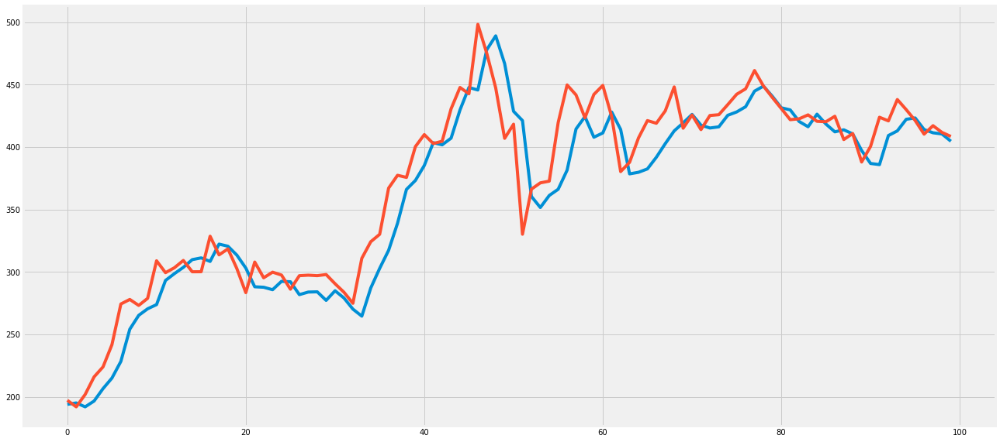

In [200]:
window_size = 42
X,y = getdata(close_data['close'].values,window_size,forward_days = 1)

model = train_model_v4(X[:-100,],y[:-100],d=0.0,epoch = 50)

plt.plot(model.predict(X[-100:,])[:,0])
plt.plot(y[-100:])
plt.show()

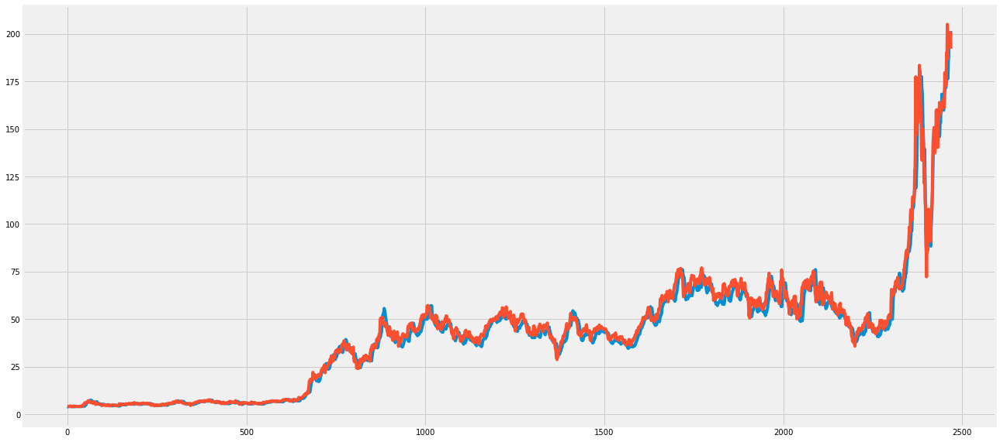

In [197]:
plt.plot(model.predict(X[:-100,]))
plt.plot(y[:-100])
plt.show()

In [198]:
mean_squared_error = keras.losses.MeanSquaredError()
yhat = model.predict(X[-100:,])

rmse = np.sqrt(mean_squared_error(y[-100:], yhat))

In [199]:
rmse

108.542175

In [150]:
model.predict(X[-5:,])

array([[444.40332],
       [435.76   ],
       [421.29068],
       [428.75958],
       [423.83282]], dtype=float32)

In [151]:
y[-5:]

array([421.26000977, 410.35998535, 417.13000488, 411.76000977,
       408.5       ])

In [118]:
(y[-8]/y[-9])-1

0.04064140826270668

In [117]:
(yhat[-8]/yhat[-9])-1

array([0.00634289], dtype=float32)

Starting process for: GOOGL
Starting process for: 7-days lag and 1-days forward prediction


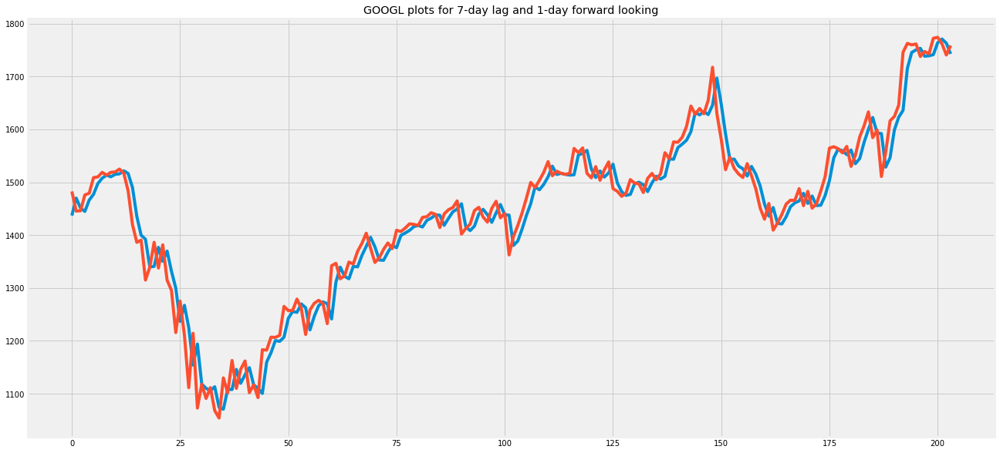

Starting process for: AAPL
Starting process for: 7-days lag and 1-days forward prediction


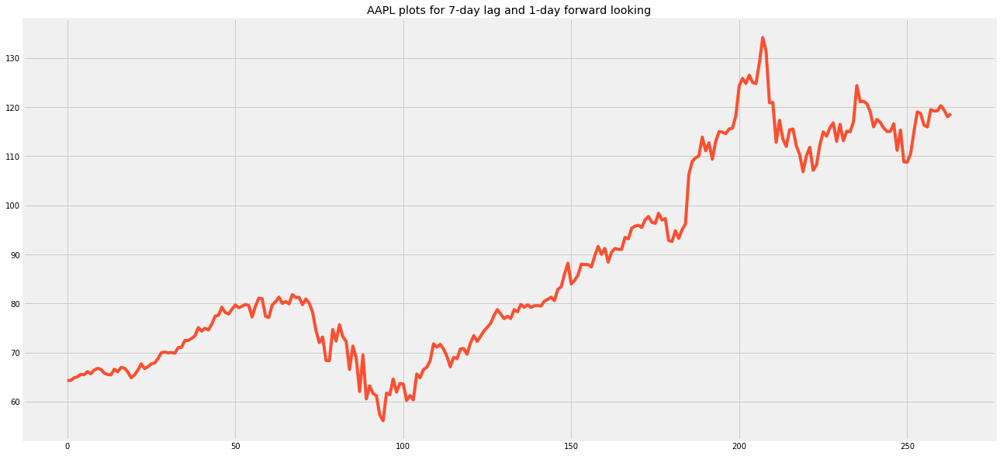

Starting process for: AMZN
Starting process for: 7-days lag and 1-days forward prediction


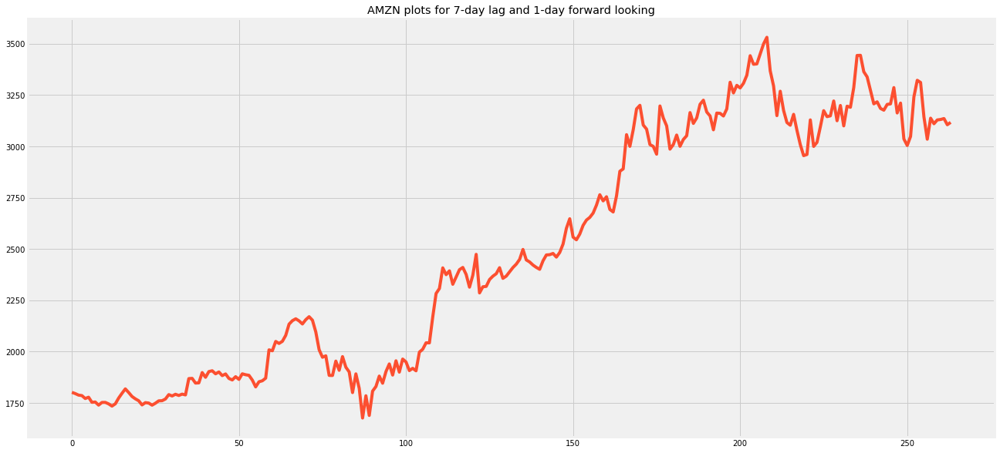

Starting process for: MSFT
Starting process for: 7-days lag and 1-days forward prediction


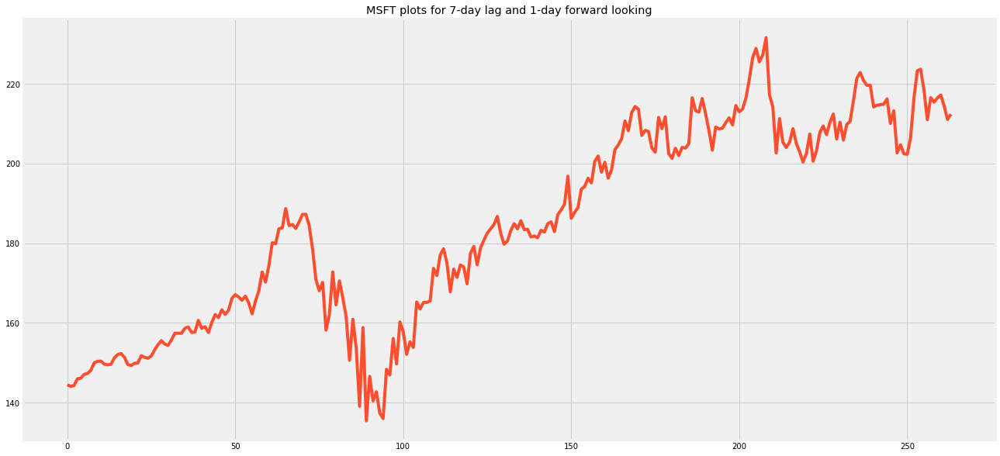

Starting process for: GOOGL
Starting process for: 7-days lag and 1-days forward prediction


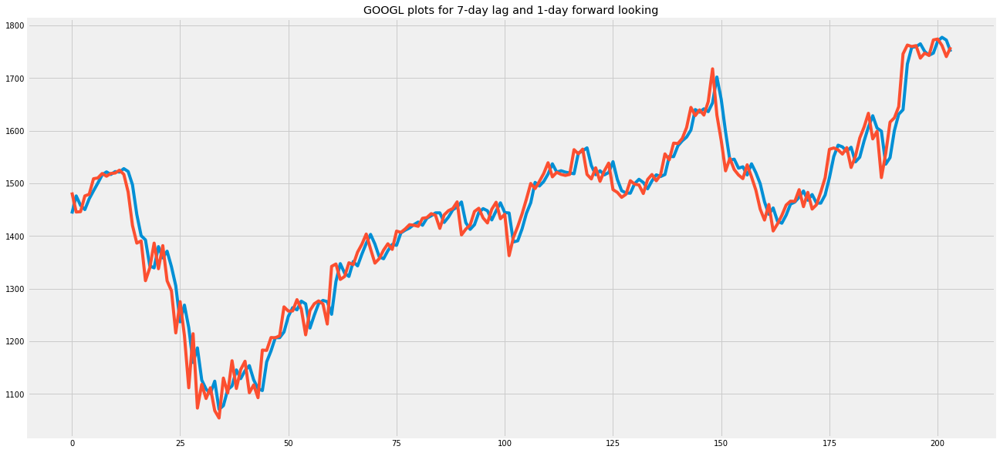

Starting process for: FB
Starting process for: 7-days lag and 1-days forward prediction


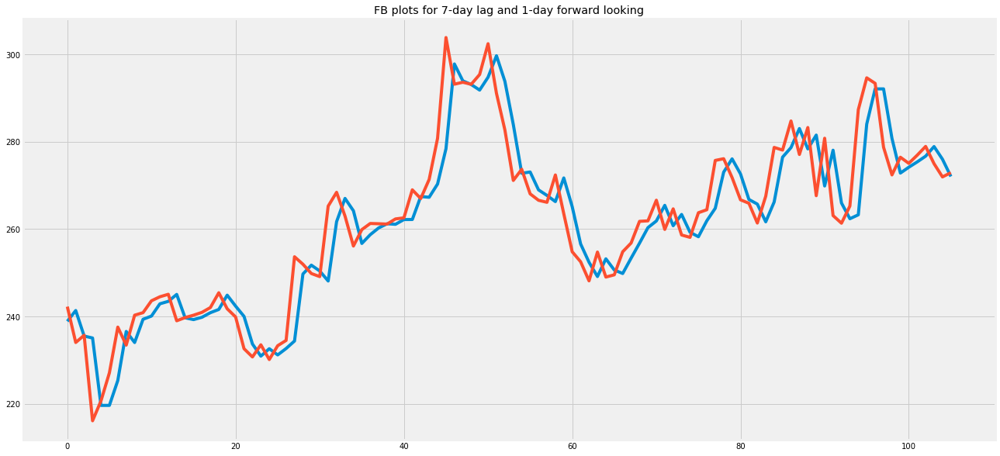

Starting process for: V
Starting process for: 7-days lag and 1-days forward prediction


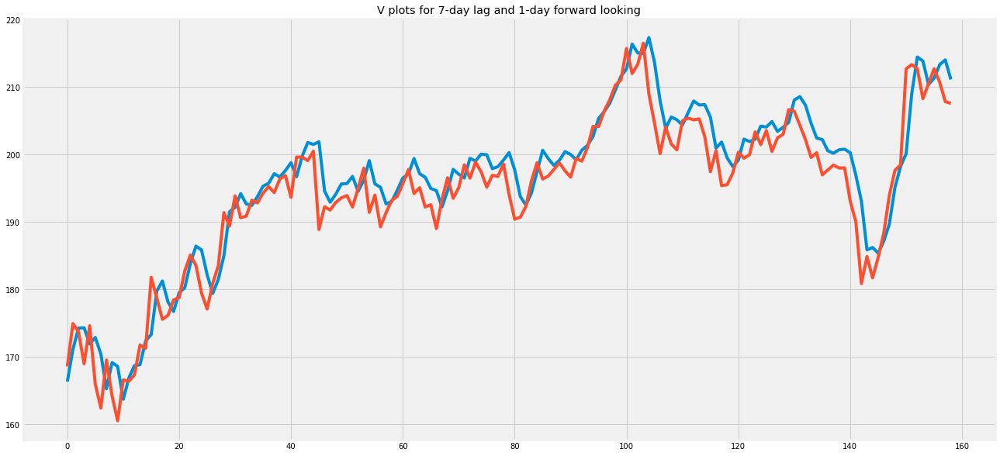

Starting process for: WMT
Starting process for: 7-days lag and 1-days forward prediction


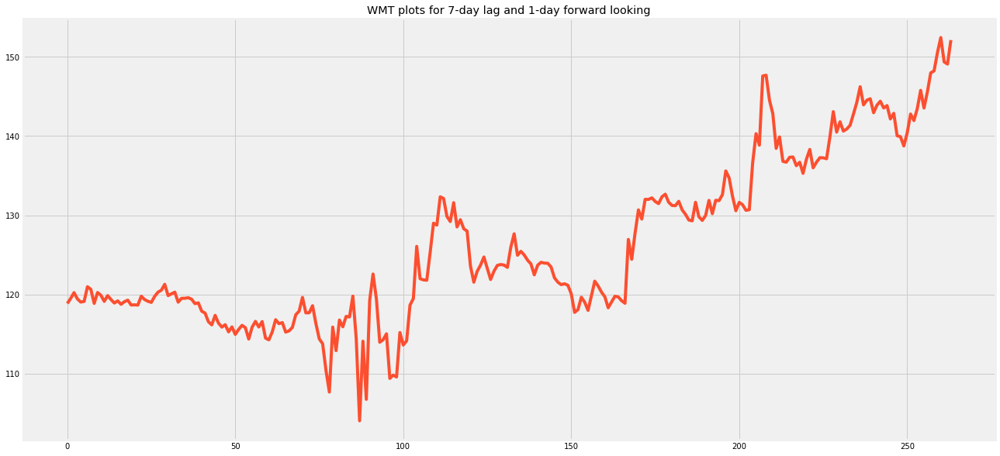

Starting process for: JNJ
Starting process for: 7-days lag and 1-days forward prediction


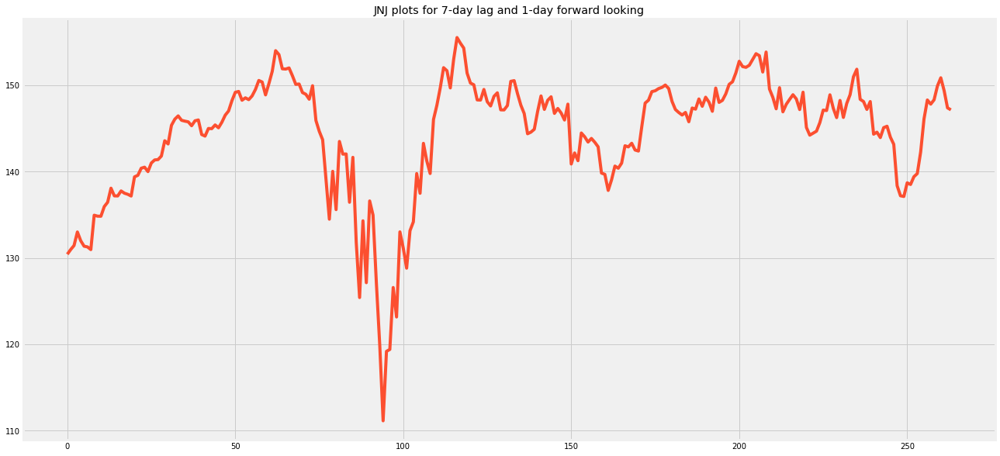

Starting process for: TSLA
Starting process for: 7-days lag and 1-days forward prediction


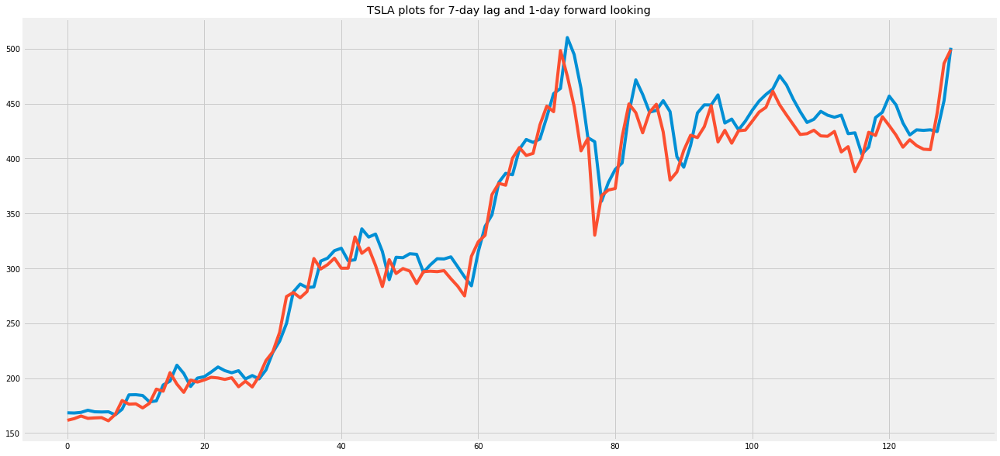

Starting process for: PG
Starting process for: 7-days lag and 1-days forward prediction


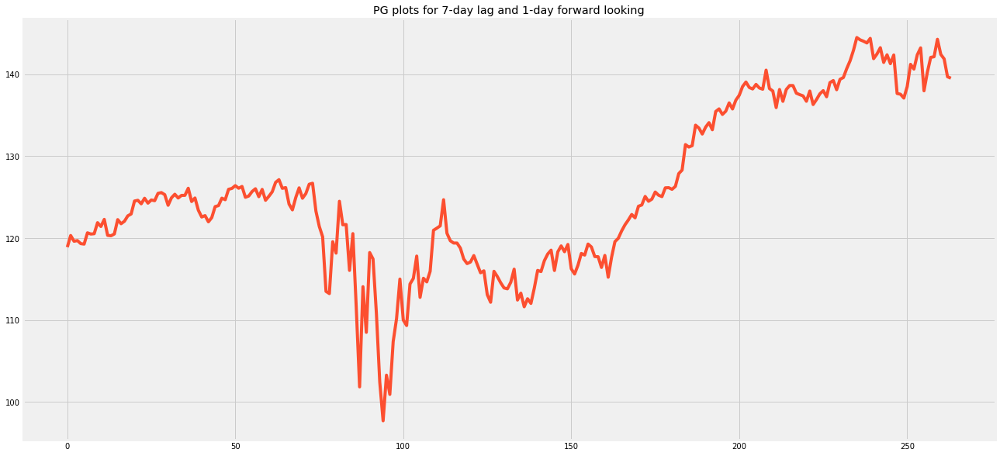

Starting process for: MA
Starting process for: 7-days lag and 1-days forward prediction


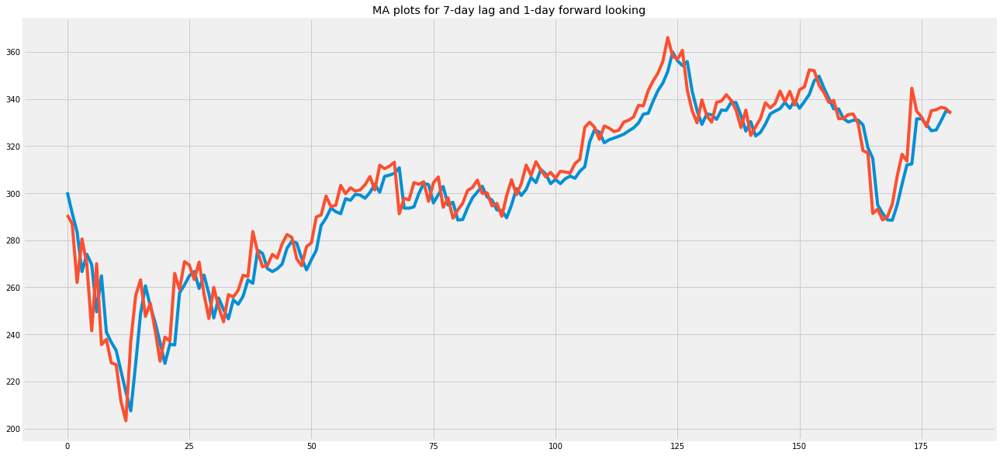

Starting process for: JPM
Starting process for: 7-days lag and 1-days forward prediction


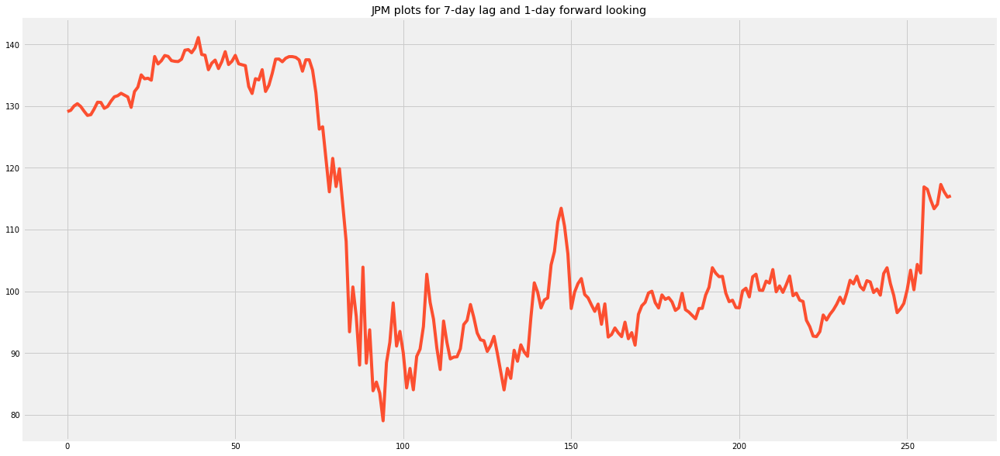

Starting process for: NVDA
Starting process for: 7-days lag and 1-days forward prediction


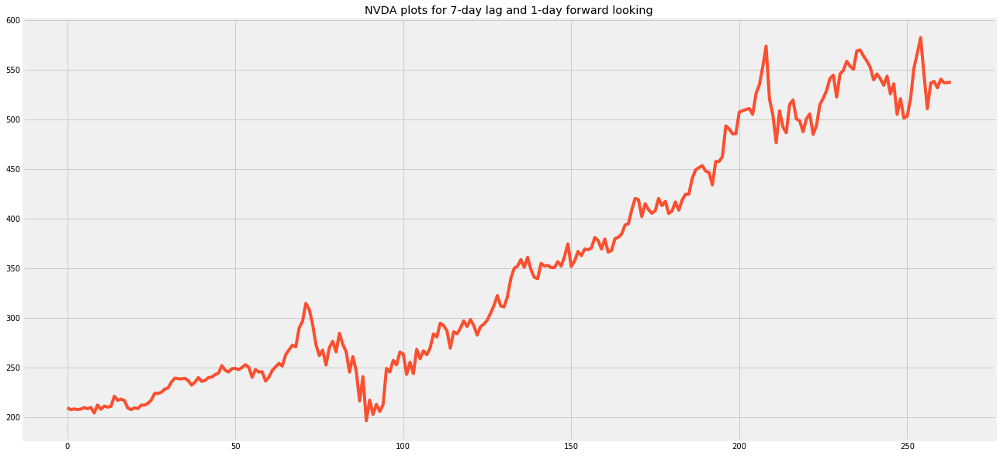

Starting process for: UNH
Starting process for: 7-days lag and 1-days forward prediction


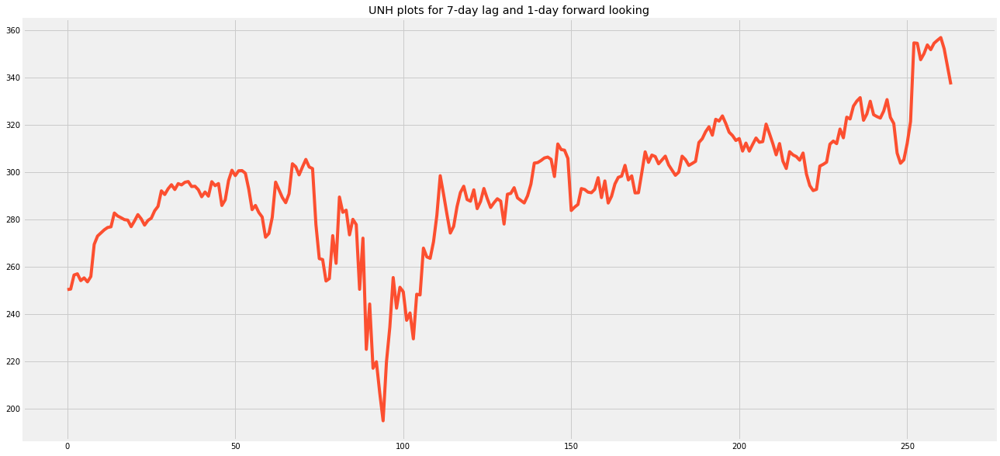

Starting process for: HD
Starting process for: 7-days lag and 1-days forward prediction


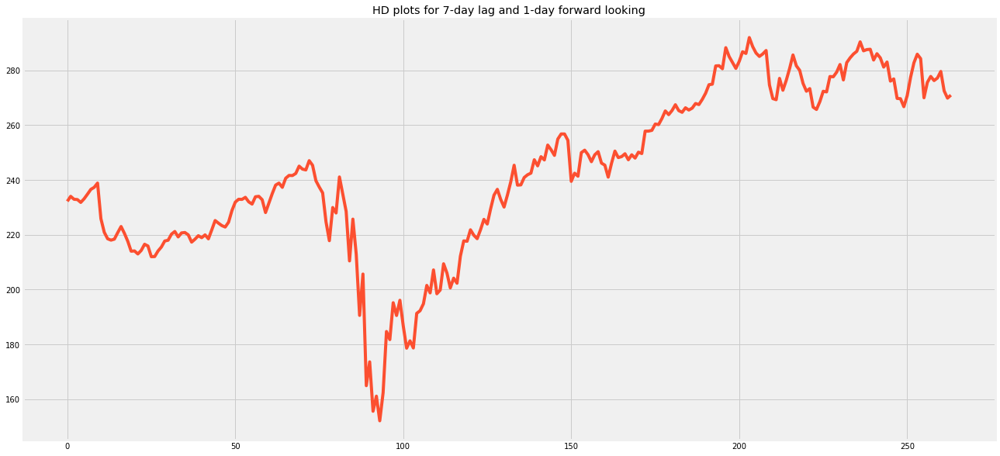

Starting process for: VZ
Starting process for: 7-days lag and 1-days forward prediction


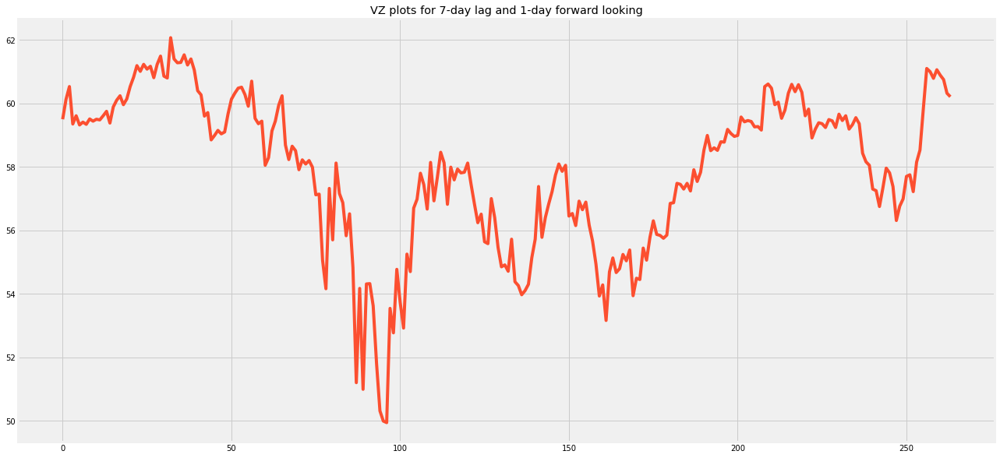

Starting process for: DIS
Starting process for: 7-days lag and 1-days forward prediction


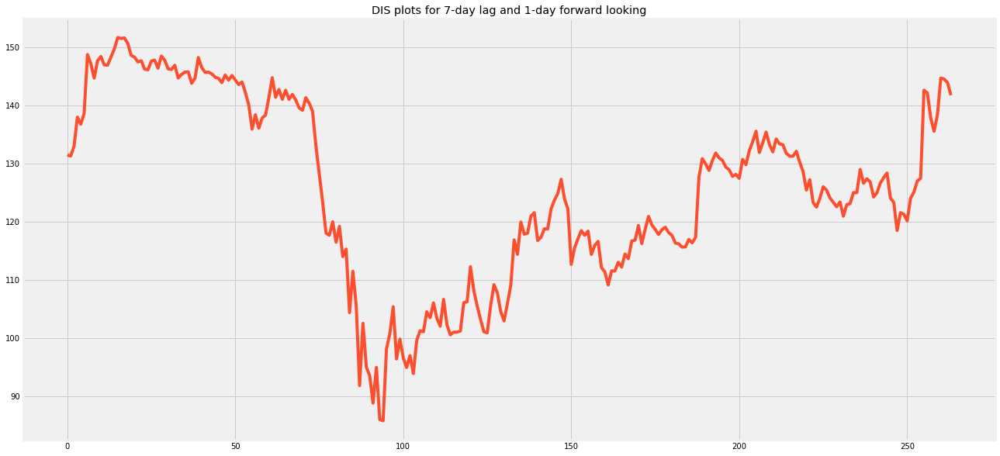

Starting process for: ADBE
Starting process for: 7-days lag and 1-days forward prediction


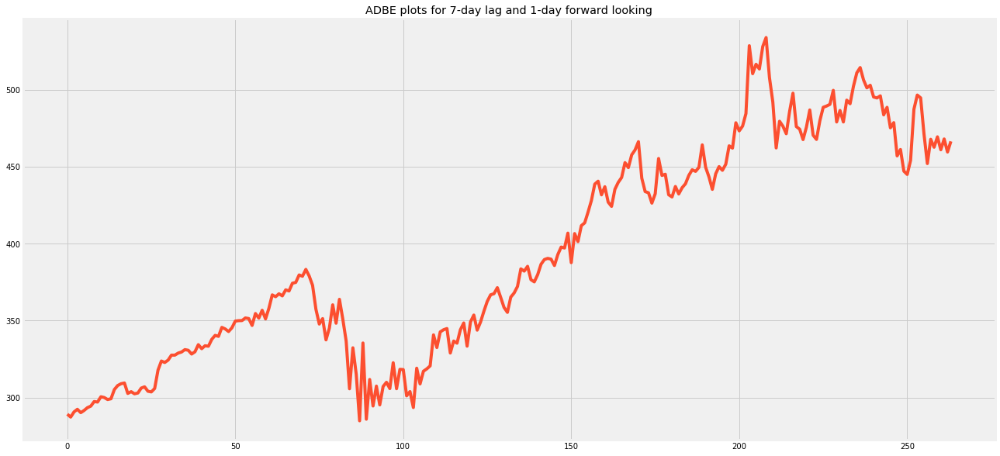

Starting process for: CRM
Starting process for: 7-days lag and 1-days forward prediction


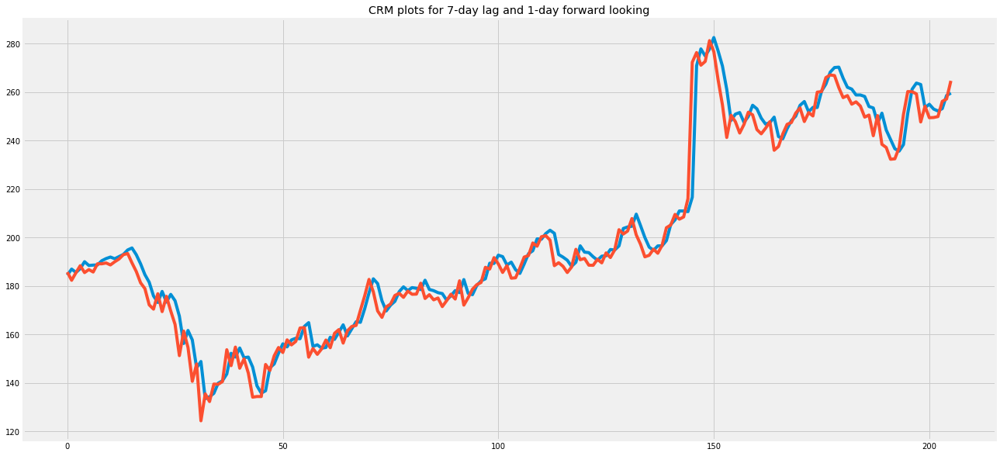

Finished process for: CRM


In [37]:
stocks = ['GOOGL','AAPL', 'AMZN', 'MSFT', 'GOOGL', 'FB', 'V', 'WMT','JNJ',
          'TSLA', 'PG', 'MA', 'JPM', 'NVDA', 'UNH', 'HD', 'VZ', 'DIS','ADBE', 'CRM']
train_deployment_models(stocks=stocks, lags = [7], forward_looking_days_con = [1],epochs = 100, verbose = 0)

In [35]:
latest_predictions(symbol='AMZN',root_dir='Stock_prediction_alt_models')[1]

Starting process for: 7-days lag and 1-days forward prediction


,Actual Price,Predicted Price
date,,
2020-07-01,2878.699951,NaN
2020-07-02,2890.300049,NaN
2020-07-06,3057.040039,NaN
2020-07-07,3000.120117,NaN
2020-07-08,3081.110107,NaN
...,...,...
2020-11-16,3131.060059,NaN
2020-11-17,3135.659912,NaN
2020-11-18,3105.459961,NaN
